# Process 2 — ML with Process Attributes vs Baseline Methods

Compares four approaches **without using any energy/sensor columns** as features:

| Mode | Duration source | Transition source |
|---|---|---|
| `median_baseline` | constant per-activity median | Petri-net stochastic weights |
| `distribution_fit` | fitted distribution (best of lognorm/gamma/…) | Petri-net stochastic weights |
| `petri_heuristic` | fitted distribution | Heuristic Miner PN |
| `petri_inductive` | fitted distribution | Inductive Miner PN |
| `ml_process_attrs` | XGBoost / mean / median — features: `object_attributes` (incl. `total_material`) + `prev_activity` | same ML classifier |

Line **l01** from Process 2 is used as the example.

## 0 · Setup

In [1]:
import os, sys, warnings
os.environ['TQDM_DISABLE'] = '1'
warnings.filterwarnings('ignore')

import logging
logging.getLogger('pm4py').setLevel(logging.ERROR)
logging.captureWarnings(True)

SRC_DIR = os.path.dirname(os.path.abspath('__file__'))
if SRC_DIR not in sys.path:
    sys.path.insert(0, SRC_DIR)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pm4py
from pm4py.util import constants as pm4py_constants
pm4py_constants.SHOW_PROGRESS_BAR = False
from IPython.display import display
pd.options.mode.chained_assignment = None

print('Setup complete.')

Setup complete.


In [2]:
from modelling_utils import (
    _split_process_datasets,
    comprehensive_simulation_evaluation,
    _plot_short_heatmap,
)
from sim_extractor import extract_process
from sim_modeller import SimModeller
from simulation import ProcessSimulation

print('All src modules imported.')

Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.



All src modules imported.


## 1 · Load Process 2 — filter to line l01

In [3]:
from pathlib import Path

EXPERIMENT  = '1'
PROCESS     = 'process_2'
OBJECT_LINE = 'l01'   # one production line
TRAIN_RATIO = 0.70

gold_base = Path(SRC_DIR).parent / 'data' / 'gold' / f'experiment_{EXPERIMENT}' / PROCESS / 'datasets'

event_log_full  = pd.read_parquet(gold_base / 'df_event_log.parquet')
production_plan_full = pd.read_parquet(gold_base / 'df_production_plan.parquet')

print('Event log columns:', event_log_full.columns.tolist())
print('Event log shape  :', event_log_full.shape)
print('Objects          :', event_log_full['object'].unique())

Event log columns: ['timestamp_start', 'timestamp_end', 'activity', 'higher_level_activity', 'object_type', 'object', 'case_id', 'object_attributes']
Event log shape  : (2587, 8)
Objects          : ['l01' 'l02']


In [4]:
# Keep only l01
event_log = event_log_full[event_log_full['object'] == OBJECT_LINE].copy()
event_log = event_log.dropna(subset=['case_id', 'activity', 'timestamp_start', 'timestamp_end'])

print(f'Filtered to {OBJECT_LINE}: {len(event_log)} rows, {event_log["case_id"].nunique()} cases')
print(f'Activities: {sorted(event_log["activity"].unique())}')
display(event_log.head(10))

Filtered to l01: 1299 rows, 48 cases
Activities: ['Fehler Tankanwahl Bestand', 'Grundstellung', 'Leitung zum HSM füllen', 'Leitung zum Vorheizer füllen', 'Materialvalidierung', 'Nachlauf', 'Produktion', 'Spülen auf Gully', 'Spülen mit Wasser', 'Vorwärmen des Warmwasserkreislaufs', 'Warten auf Quelle', 'Warten auf Ziel']


,timestamp_start,timestamp_end,activity,higher_level_activity,object_type,object,case_id,object_attributes
0,2024-11-03 14:03:21,2024-11-04 08:58:21,Grundstellung,l01,l01,l01,shift_2_2024-11-03,"{'mat_id_m01_': 0, 'mat_id_m02_': 0, 'mat_id_m..."
1,2024-11-04 08:58:26,2024-11-04 08:59:01,Vorwärmen des Warmwasserkreislaufs,l01,l01,l01,shift_1_2024-11-04,"{'mat_id_m01_': 8681981, 'mat_id_m02_': 0, 'ma..."
2,2024-11-04 08:59:06,2024-11-04 10:13:56,Warten auf Ziel,l01,l01,l01,shift_1_2024-11-04,"{'mat_id_m01_': 8681981, 'mat_id_m02_': 0, 'ma..."
3,2024-11-04 10:14:01,2024-11-04 10:14:06,Materialvalidierung,l01,l01,l01,shift_1_2024-11-04,"{'mat_id_m01_': 8681982, 'mat_id_m02_': 0, 'ma..."
4,2024-11-04 10:14:11,2024-11-04 10:17:41,Leitung zum Vorheizer füllen,l01,l01,l01,shift_1_2024-11-04,"{'mat_id_m01_': 8681982, 'mat_id_m02_': 0, 'ma..."
5,2024-11-04 10:17:46,2024-11-04 10:17:56,Leitung zum HSM füllen,l01,l01,l01,shift_1_2024-11-04,"{'mat_id_m01_': 8681982, 'mat_id_m02_': 0, 'ma..."
6,2024-11-04 10:18:01,2024-11-04 10:24:11,Produktion,l01,l01,l01,shift_1_2024-11-04,"{'mat_id_m01_': 8681982, 'mat_id_m02_': 0, 'ma..."
7,2024-11-04 10:24:16,2024-11-04 10:26:41,Spülen mit Wasser,l01,l01,l01,shift_1_2024-11-04,"{'mat_id_m01_': 8681982, 'mat_id_m02_': 0, 'ma..."
8,2024-11-04 10:26:46,2024-11-04 10:26:56,Nachlauf,l01,l01,l01,shift_1_2024-11-04,"{'mat_id_m01_': 8681982, 'mat_id_m02_': 0, 'ma..."
9,2024-11-04 10:27:01,2024-11-04 10:27:26,Spülen auf Gully,l01,l01,l01,shift_1_2024-11-04,"{'mat_id_m01_': 8681982, 'mat_id_m02_': 0, 'ma..."


In [5]:
# Inspect object_attributes — should contain mat_id_* keys plus total_material
sample_attrs = event_log['object_attributes'].dropna().iloc[0] if 'object_attributes' in event_log.columns else {}
print('Sample object_attributes:', sample_attrs)

Sample object_attributes: {'mat_id_m01_': 0, 'mat_id_m02_': 0, 'mat_id_m03_': 0, 'total_material': 6123.253770616319}


## 2 · Duration distribution per activity

                                    count  median   mean    std
activity                                                       
Warten auf Ziel                       282    56.0   56.7   38.4
Grundstellung                          38    45.4  329.9  821.7
Produktion                            252     6.8    6.5    1.8
Leitung zum Vorheizer füllen           35     3.4    3.2    0.7
Spülen mit Wasser                      34     2.2    2.3    0.1
Vorwärmen des Warmwasserkreislaufs     13     0.7    0.6    0.2
Spülen auf Gully                       34     0.5    0.5    0.3
Fehler Tankanwahl Bestand              29     0.3    4.8   15.4
Leitung zum HSM füllen                 35     0.2    0.3    0.1
Nachlauf                              252     0.2    0.2    0.0
Materialvalidierung                   250     0.1    0.1    0.1
Warten auf Quelle                      45     0.0    0.6    4.1


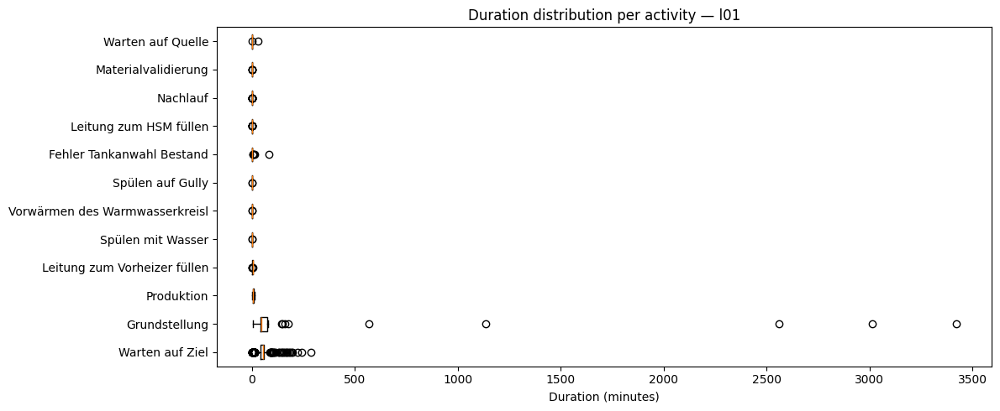

In [6]:
event_log['duration_min'] = (
    pd.to_datetime(event_log['timestamp_end']) - pd.to_datetime(event_log['timestamp_start'])
).dt.total_seconds() / 60.0

dur_stats = (
    event_log.groupby('activity')['duration_min']
    .agg(['count', 'median', 'mean', 'std'])
    .sort_values('median', ascending=False)
)
print(dur_stats.round(1))

fig, ax = plt.subplots(figsize=(12, 5))
activity_order = dur_stats.index.tolist()
bp_data = [event_log[event_log['activity'] == a]['duration_min'].dropna().values for a in activity_order]
ax.boxplot(bp_data, vert=False, labels=[a[:30] for a in activity_order])
ax.set_xlabel('Duration (minutes)')
ax.set_title('Duration distribution per activity — l01')
plt.tight_layout()
plt.show()

## 3 · Train / test split

In [7]:
# Temporal split: sort cases by first timestamp
event_log['timestamp_start'] = pd.to_datetime(event_log['timestamp_start'])
event_log['timestamp_end']   = pd.to_datetime(event_log['timestamp_end'])

case_order = (
    event_log.groupby('case_id')['timestamp_start']
    .min()
    .sort_values()
    .index.tolist()
)
n_train = max(1, int(len(case_order) * TRAIN_RATIO))
train_cases = set(case_order[:n_train])
test_cases  = set(case_order[n_train:])

df_train = event_log[event_log['case_id'].isin(train_cases)].copy()
df_test  = event_log[event_log['case_id'].isin(test_cases)].copy()

# Production plan: one row per case_id (case start/end)
def make_production_plan(el):
    return (
        el.groupby('case_id')
        .agg(
            timestamp_start=('timestamp_start', 'min'),
            timestamp_end=('timestamp_end', 'max'),
            object_attributes=('object_attributes', 'first'),
        )
        .reset_index()
    )

pp_train = make_production_plan(df_train)
pp_test  = make_production_plan(df_test)

print(f'Train: {len(train_cases)} cases, {len(df_train)} events')
print(f'Test : {len(test_cases)} cases, {len(df_test)} events')

Train: 33 cases, 883 events
Test : 15 cases, 416 events


## 4 · Extract process (heuristic miner on training data)

In [8]:
# Extract with heuristic miner — produces stats_df, raw_df, process_models
stats_heuristic, raw_df, pm_heuristic = extract_process(
    df_train,
    mining_algorithm='heuristic',
    optimize_mining_hyperparams=False,
)
print('\nstats_df:')
display(stats_heuristic[['activity', 'duration', 'duration_std', 'dist_name', 'n_events', 'is_start', 'is_end']])

print('\nraw_df columns:', raw_df.columns.tolist())
print('raw_df attr_* columns:', [c for c in raw_df.columns if c.startswith('attr_')])
print('raw_df prev_* columns:', [c for c in raw_df.columns if c.startswith('prev_')])


Processing: l01 (1 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 12 unique activities: ['Grundstellung' 'Vorwärmen des Warmwasserkreislaufs' 'Warten auf Ziel'
 'Materialvalidierung' 'Leitung zum Vorheizer füllen'
 'Leitung zum HSM füllen' 'Produktion' 'Spülen mit Wasser' 'Nachlauf'
 'Spülen auf Gully' 'Fehler Tankanwahl Bestand' 'Warten auf Quelle']
    Grundstellung: best fit = weibull_min (0.5844550101446674, 0.0, 178.00974773019453)
    Vorwärmen des Warmwasserkreislaufs: best fit = lognorm (0.14887146877695792, 0.0, 0.6238080085643007)
    Warten auf Ziel: best fit = weibull_min (1.4034321161703613, 0.0, 62.3606538186368)


    Materialvalidierung: best fit = norm (0.12365591397849464, 0.16309474529158616)
    Leitung zum Vorheizer füllen: best fit = norm (3.1041666666666665, 0.5560327811412774)
    Leitung zum HSM füllen: best fit = norm (0.24652777777777776, 0.04487099994208363)
    Produktion: best fit = weibull_min (4.594773408029717, 0.0, 7.258764040095482)


    Spülen mit Wasser: best fit = norm (2.300724637681159, 0.1384418345981362)
    Nachlauf: best fit = norm (0.16569200779727097, 0.017998231298849306)
    Spülen auf Gully: best fit = lognorm (0.32989829289106276, 0.0, 0.48841459140854526)
    Fehler Tankanwahl Bestand: best fit = gamma (0.42830650319806, 0.0, 21.388221325881048)


    Warten auf Quelle: best fit = norm (14.083333333333334, 13.416666666666668)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.7649, fitness=0.9805, precision=0.8013, generalization=0.6776769662451543, simplicity=0.6000000000000001
    Selected params: noise=0.2, heur={} (score=0.7649)
    Petri net: 16 places, 29 transitions, 60 arcs
    Stochastic map: 29 transition weights
    Decision-point weights: 2 decision points, 1 with __END__ probability
    Max case length in training: 39
      Grundstellung: Start=True, End=True, Transitions={'Nachlauf': 0.038461538461538464, 'Vorwärmen des Warmwasserkreislaufs': 0.15384615384615385, 'Warten auf Ziel': 0.6538461538461539, '__END__': 0.15384615384615385}
      Vorwärmen des Warmwasserkreislaufs: Start=True, End=False, Transitions={'Warten auf Ziel': 1.0}
      Warten auf Ziel: Start=True, End=True, Transitions={'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
      Materialvalidierung: St

    History weights: 29 bigram keys, 52 activity-count keys

stats_df:


,activity,duration,duration_std,dist_name,n_events,is_start,is_end
0,Grundstellung,44.500000,822.854998,weibull_min,26,True,True
1,Vorwärmen des Warmwasserkreislaufs,0.583333,0.106035,lognorm,7,True,False
2,Warten auf Ziel,56.333333,40.391992,weibull_min,191,True,True
3,Materialvalidierung,0.083333,0.150461,norm,169,True,False
4,Leitung zum Vorheizer füllen,3.416667,0.567992,norm,24,False,False
5,Leitung zum HSM füllen,0.250000,0.045836,norm,24,False,False
6,Produktion,6.750000,1.641428,weibull_min,171,False,True
7,Spülen mit Wasser,2.250000,0.141553,norm,23,False,False
8,Nachlauf,0.166667,0.018051,norm,171,True,False
9,Spülen auf Gully,0.500000,0.358641,lognorm,23,False,False



raw_df columns: ['case_id', 'activity', 'object', 'object_type', 'higher_level_activity', 'duration', 'next_activity', 'timestamp_start', 'activity_index', 'hour_of_day', 'day_of_week', 'prev_activity_1', 'prev_duration_1', 'prev_activity_2', 'prev_duration_2', 'attr_mat_id_m01_', 'attr_mat_id_m02_', 'attr_mat_id_m03_', 'attr_total_material']
raw_df attr_* columns: ['attr_mat_id_m01_', 'attr_mat_id_m02_', 'attr_mat_id_m03_', 'attr_total_material']
raw_df prev_* columns: ['prev_activity_1', 'prev_duration_1', 'prev_activity_2', 'prev_duration_2']


In [9]:
# Also extract with inductive miner for the petri_inductive mode
stats_inductive, raw_df_ind, pm_inductive = extract_process(
    df_train,
    mining_algorithm='inductive',
    optimize_mining_hyperparams=False,
)
print('Inductive miner done.')


Processing: l01 (1 objects, one whole-process net)
  Mining algorithm: inductive
  Found 12 unique activities: ['Grundstellung' 'Vorwärmen des Warmwasserkreislaufs' 'Warten auf Ziel'
 'Materialvalidierung' 'Leitung zum Vorheizer füllen'
 'Leitung zum HSM füllen' 'Produktion' 'Spülen mit Wasser' 'Nachlauf'
 'Spülen auf Gully' 'Fehler Tankanwahl Bestand' 'Warten auf Quelle']
    Grundstellung: best fit = weibull_min (0.5844550101446674, 0.0, 178.00974773019453)
    Vorwärmen des Warmwasserkreislaufs: best fit = lognorm (0.14887146877695792, 0.0, 0.6238080085643007)


    Warten auf Ziel: best fit = weibull_min (1.4034321161703613, 0.0, 62.3606538186368)


    Materialvalidierung: best fit = norm (0.12365591397849464, 0.16309474529158616)
    Leitung zum Vorheizer füllen: best fit = norm (3.1041666666666665, 0.5560327811412774)


    Leitung zum HSM füllen: best fit = norm (0.24652777777777776, 0.04487099994208363)
    Produktion: best fit = weibull_min (4.594773408029717, 0.0, 7.258764040095482)


    Spülen mit Wasser: best fit = norm (2.300724637681159, 0.1384418345981362)
    Nachlauf: best fit = norm (0.16569200779727097, 0.017998231298849306)


    Spülen auf Gully: best fit = lognorm (0.32989829289106276, 0.0, 0.48841459140854526)
    Fehler Tankanwahl Bestand: best fit = gamma (0.42830650319806, 0.0, 21.388221325881048)


    Warten auf Quelle: best fit = norm (14.083333333333334, 13.416666666666668)
    Mining Petri net with 'inductive' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.6565, fitness=0.9637, precision=0.3331, generalization=0.6821559952025946, simplicity=0.6470588235294118
    Selected params: noise=0.2, heur={} (score=0.6565)
    Petri net: 17 places, 27 transitions, 56 arcs
    Stochastic map: 25 transition weights
    Decision-point weights: 3 decision points, 1 with __END__ probability
    Max case length in training: 39
      Grundstellung: Start=True, End=True, Transitions={'Nachlauf': 0.038461538461538464, 'Vorwärmen des Warmwasserkreislaufs': 0.15384615384615385, 'Warten auf Ziel': 0.6538461538461539, '__END__': 0.15384615384615385}
      Vorwärmen des Warmwasserkreislaufs: Start=True, End=False, Transitions={'Warten auf Ziel': 1.0}
      Warten auf Ziel: Start=True, End=True, Transitions={'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
      Materialvalidierung: St

    History weights: 29 bigram keys, 52 activity-count keys
Inductive miner done.


## 5 · Train ML model (process attributes + previous activities only)

Features used:
- `attr_*` — flattened from `object_attributes` (mat_id values, `total_material`, …)
- `prev_activity_1`, `prev_activity_2` — label-encoded activity names
- `prev_duration_1`, `prev_duration_2` — duration of previous activities

No sensor / energy columns are used.

In [10]:
# Show which features will be used
attr_cols = [c for c in raw_df.columns if c.startswith('attr_')]
prev_cols = [c for c in raw_df.columns if c.startswith('prev_')]
print('Attribute features:', attr_cols)
print('Previous-activity features:', prev_cols)
print(f'\nTotal ML features: {len(attr_cols) + len(prev_cols)}')
if attr_cols:
    display(raw_df[attr_cols].describe())

Attribute features: ['attr_mat_id_m01_', 'attr_mat_id_m02_', 'attr_mat_id_m03_', 'attr_total_material']
Previous-activity features: ['prev_activity_1', 'prev_duration_1', 'prev_activity_2', 'prev_duration_2']

Total ML features: 8


,attr_mat_id_m01_,attr_mat_id_m02_,attr_mat_id_m03_,attr_total_material
count,8.830000e+02,8.830000e+02,8.830000e+02,883.000000
mean,6.085983e+06,5.889329e+06,5.063448e+06,23242.173153
std,3.976797e+06,4.057492e+06,4.282651e+06,25827.022888
min,0.000000e+00,0.000000e+00,0.000000e+00,2586.458706
25%,0.000000e+00,0.000000e+00,0.000000e+00,13977.639589
50%,8.681590e+06,8.681588e+06,8.681588e+06,17155.600970
75%,8.681590e+06,8.681590e+06,8.681590e+06,19857.716760
max,8.681983e+06,8.681697e+06,8.681697e+06,138529.317881


In [11]:
# Train SimModeller — duration + transitions, no energy data
ml_models = SimModeller(
    model_types=['xgboost', 'mean', 'median'],
    optimize_hyperparams=False,   # set True for tuned results (slower)
    train_transitions=True,       # also learn transitions from process attrs
)
ml_models.train(raw_df, stats_heuristic)
print(ml_models.summary())


[SimModeller] Model types      : ['xgboost', 'mean', 'median']
[SimModeller] Optuna tuning    : False
[SimModeller] Internal val %   : 20%
[SimModeller] Feature columns  : ['attr_mat_id_m01_', 'attr_mat_id_m02_', 'attr_mat_id_m03_', 'attr_total_material', 'prev_activity_1', 'prev_duration_1', 'prev_activity_2', 'prev_duration_2']

  Key: ('Fehler Tankanwahl Bestand', 'l01', 'l01', 'l01')
    Fit size: 15, Val size: 4, Total: 19


    Duration [ xgboost]  MAE=1.002  RMSE=1.612  R²=-0.123
    Duration [    mean]  MAE=6.967  RMSE=7.131  R²=-20.988
    Duration [  median]  MAE=1.083  RMSE=1.776  R²=-0.363
    ✓ Best duration model: xgboost  (val MAE=1.002)


    Transition [ xgboost]  Acc=1.000  F1=1.000
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of binary and continuous targets
    Transition [  median]  Acc=1.000  F1=1.000
    ✓ Best transition model: xgboost  (val Acc=1.000)

  Key: ('Grundstellung', 'l01', 'l01', 'l01')
    Fit size: 20, Val size: 6, Total: 26
    Duration [ xgboost]  MAE=605.505  RMSE=1398.228  R²=-0.250
    Duration [    mean]  MAE=684.786  RMSE=1304.096  R²=-0.088
    Duration [  median]  MAE=590.056  RMSE=1379.623  R²=-0.217
    ✓ Best duration model: median  (val MAE=590.056)
    Transition [ xgboost]  Acc=0.333  F1=0.250
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of multiclass and continuous targets


    Transition [  median]  Acc=0.500  F1=0.333
    ✓ Best transition model: median  (val Acc=0.500)

  Key: ('Leitung zum HSM füllen', 'l01', 'l01', 'l01')
    Fit size: 19, Val size: 5, Total: 24
    Duration [ xgboost]  MAE=0.050  RMSE=0.065  R²=-1.500
    Duration [    mean]  MAE=0.046  RMSE=0.062  R²=-1.297
    Duration [  median]  MAE=0.033  RMSE=0.053  R²=-0.667
    ✓ Best duration model: median  (val MAE=0.033)

  Key: ('Leitung zum Vorheizer füllen', 'l01', 'l01', 'l01')
    Fit size: 19, Val size: 5, Total: 24
    Duration [ xgboost]  MAE=0.762  RMSE=0.945  R²=-0.990
    Duration [    mean]  MAE=0.602  RMSE=0.718  R²=-0.148
    Duration [  median]  MAE=0.550  RMSE=0.846  R²=-0.595
    ✓ Best duration model: median  (val MAE=0.550)



  Key: ('Materialvalidierung', 'l01', 'l01', 'l01')
    Fit size: 135, Val size: 34, Total: 169
    Duration [ xgboost]  MAE=0.085  RMSE=0.110  R²=-5.593
    Duration [    mean]  MAE=0.030  RMSE=0.045  R²=-0.083
    Duration [  median]  MAE=0.022  RMSE=0.043  R²=-0.003
    ✓ Best duration model: median  (val MAE=0.022)
    Transition [ xgboost]  Acc=0.824  F1=0.810
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of multiclass and continuous targets
    Transition [  median]  Acc=0.794  F1=0.703


    ✓ Best transition model: xgboost  (val Acc=0.824)

  Key: ('Nachlauf', 'l01', 'l01', 'l01')
    Fit size: 136, Val size: 35, Total: 171
    Duration [ xgboost]  MAE=0.003  RMSE=0.014  R²=-270998662539075381909608464384.000
    Duration [    mean]  MAE=0.001  RMSE=0.001  R²=-1949481891931134677850521600.000
    Duration [  median]  MAE=0.000  RMSE=0.000  R²=1.000
    ✓ Best duration model: median  (val MAE=0.000)


    Transition [ xgboost]  Acc=0.971  F1=0.973
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of binary and continuous targets
    Transition [  median]  Acc=0.886  F1=0.832
    ✓ Best transition model: xgboost  (val Acc=0.971)

  Key: ('Produktion', 'l01', 'l01', 'l01')
    Fit size: 136, Val size: 35, Total: 171
    Duration [ xgboost]  MAE=0.997  RMSE=1.213  R²=0.209
    Duration [    mean]  MAE=1.498  RMSE=1.798  R²=-0.738
    Duration [  median]  MAE=1.412  RMSE=1.679  R²=-0.515
    ✓ Best duration model: xgboost  (val MAE=0.997)


    Transition [ xgboost]  FAILED: Invalid classes inferred from unique values of `y`.  Expected: [0 1 2], got [1 2 3]
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of multiclass and continuous targets
    Transition [  median]  Acc=0.857  F1=0.791
    ✓ Best transition model: median  (val Acc=0.857)

  Key: ('Spülen auf Gully', 'l01', 'l01', 'l01')
    Fit size: 18, Val size: 5, Total: 23
    Duration [ xgboost]  MAE=0.367  RMSE=0.784  R²=-0.344
    Duration [    mean]  MAE=0.378  RMSE=0.767  R²=-0.288
    Duration [  median]  MAE=0.400  RMSE=0.785  R²=-0.350
    ✓ Best duration model: xgboost  (val MAE=0.367)

  Key: ('Spülen mit Wasser', 'l01', 'l01', 'l01')
    Fit size: 18, Val size: 5, Total: 23
    Duration [ xgboost]  MAE=0.150  RMSE=0.300  R²=-0.332
    Duration [    mean]  MAE=0.155  RMSE=0.290  R²=-0.237
    Duration [  median]  MAE=0.150  RMSE=0.300  R²=-0.332
    ✓ Best duration model: xgboost  (val MAE=0.150)



  Key: ('Vorwärmen des Warmwasserkreislaufs', 'l01', 'l01', 'l01')
    Fit size: 5, Val size: 2, Total: 7
    Duration [ xgboost]  MAE=0.083  RMSE=0.083  R²=0.000
    Duration [    mean]  MAE=0.067  RMSE=0.067  R²=0.000
    Duration [  median]  MAE=0.083  RMSE=0.083  R²=0.000
    ✓ Best duration model: mean  (val MAE=0.067)

  Key: ('Warten auf Quelle', 'l01', 'l01', 'l01')
    Fit size: 28, Val size: 7, Total: 35
    Duration [ xgboost]  MAE=3.833  RMSE=10.142  R²=-0.111
    Duration [    mean]  MAE=3.946  RMSE=10.385  R²=-0.165
    Duration [  median]  MAE=3.929  RMSE=10.394  R²=-0.167
    ✓ Best duration model: xgboost  (val MAE=3.833)


    Transition [ xgboost]  Acc=0.857  F1=0.923
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of binary and continuous targets
    Transition [  median]  Acc=1.000  F1=1.000
    ✓ Best transition model: median  (val Acc=1.000)

  Key: ('Warten auf Ziel', 'l01', 'l01', 'l01')
    Fit size: 152, Val size: 39, Total: 191


    Duration [ xgboost]  MAE=22.102  RMSE=40.666  R²=-0.191
    Duration [    mean]  MAE=23.229  RMSE=37.996  R²=-0.039
    Duration [  median]  MAE=22.604  RMSE=37.595  R²=-0.017
    ✓ Best duration model: xgboost  (val MAE=22.102)
    Transition [ xgboost]  FAILED: Invalid classes inferred from unique values of `y`.  Expected: [0 1 2 3], got [0 2 3 4]
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of multiclass and continuous targets
    Transition [  median]  Acc=0.667  F1=0.533
    ✓ Best transition model: median  (val Acc=0.667)

[SimModeller] Training complete – 12 duration models, 7 transition models.

  ── Training Global Duration Model ──


    Features (15): ['feat_activity', 'feat_object', 'feat_object_type', 'feat_higher_level_activity', 'prev_activity_1', 'prev_activity_2', 'prev_duration_1', 'prev_duration_2', 'activity_index', 'hour_of_day', 'day_of_week', 'attr_mat_id_m01_', 'attr_mat_id_m02_', 'attr_mat_id_m03_', 'attr_total_material']
    Training samples: 883
    Global [ xgboost]  MAE=26.417  RMSE=255.294  R²=0.013
    Global [    mean]  MAE=42.882  RMSE=257.370  R²=-0.003
    Global [  median]  MAE=35.375  RMSE=259.333  R²=-0.018


    ✓ Best global model: xgboost  (val MAE=26.417)
SimModeller summary  (model_types=['xgboost', 'mean', 'median'], optuna=False)
  Duration models  : 12
  Duration std mdls: 12
  Transition models: 7
  Fallback entries : 12 (duration), 12 (transition)

  ── Best duration model per key (on val set) ──
    ('Fehler Tankanwahl Bestand', 'l01', 'l01', 'l01')  →  [xgboost]  MAE=1.002  RMSE=1.612  R²=-0.123
    ('Grundstellung', 'l01', 'l01', 'l01')  →  [median]  MAE=590.056  RMSE=1379.623  R²=-0.217
    ('Leitung zum HSM füllen', 'l01', 'l01', 'l01')  →  [median]  MAE=0.033  RMSE=0.053  R²=-0.667
    ('Leitung zum Vorheizer füllen', 'l01', 'l01', 'l01')  →  [median]  MAE=0.550  RMSE=0.846  R²=-0.595
    ('Materialvalidierung', 'l01', 'l01', 'l01')  →  [median]  MAE=0.022  RMSE=0.043  R²=-0.003
    ('Nachlauf', 'l01', 'l01', 'l01')  →  [median]  MAE=0.000  RMSE=0.000  R²=1.000
    ('Produktion', 'l01', 'l01', 'l01')  →  [xgboost]  MAE=0.997  RMSE=1.213  R²=0.209
    ('Spülen auf Gully', 'l0

## 6 · Run simulation for each mode & evaluate

In [12]:
def run_and_eval(mode_label, stats_df, production_plan, real_log,
                 sim_mode, process_models=None, ml_models=None):
    """Simulate + evaluate one mode; returns a flat metrics dict."""
    sim_log = ProcessSimulation(
        stats_df,
        production_plan,
        mode=sim_mode,
        process_models=process_models,
        ml_models=ml_models,
        verbose=False,
    ).run()

    if sim_log is None or len(sim_log) == 0:
        print(f'  [{mode_label}] WARNING: empty simulated log')
        return {'mode': mode_label}

    print(f'  [{mode_label}] simulated {len(sim_log)} events for {sim_log["case_id"].nunique()} cases')

    result = comprehensive_simulation_evaluation(
        sim_log, real_log,
        process_models=process_models,
        verbose=False,
    )

    flat = {'mode': mode_label}
    for category, metrics in result.items():
        if isinstance(metrics, dict):
            for k, v in metrics.items():
                flat[f'test_{category}_{k}'] = v
        else:
            flat[f'test_{category}'] = metrics

    return flat

print('run_and_eval helper defined.')

run_and_eval helper defined.


In [13]:
all_results = []

# ── 1. median_baseline — constant per-activity median, PN transitions ──────────
print('Running: median_baseline')
all_results.append(
    run_and_eval(
        'median_baseline', stats_heuristic, pp_test, df_test,
        sim_mode='petri_net_median_duration',
        process_models=pm_heuristic,
    )
)

Running: median_baseline
[DEBUG __init__] mode=petri_net_median_duration, process_models is None: False, process_models len: 1
Building config from 12 activities:
  Config: ('Grundstellung', 'l01', 'l01', 'l01')
    Transitions: {'Nachlauf': 0.038461538461538464, 'Vorwärmen des Warmwasserkreislaufs': 0.15384615384615385, 'Warten auf Ziel': 0.6538461538461539, '__END__': 0.15384615384615385}
    Start: True
  Config: ('Vorwärmen des Warmwasserkreislaufs', 'l01', 'l01', 'l01')
    Transitions: {'Warten auf Ziel': 1.0}
    Start: True
  Config: ('Warten auf Ziel', 'l01', 'l01', 'l01')
    Transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Start: True
  Config: ('Materialvalidierung', 'l01', 'l01', 'l01')
    Transitions: {'Leitung zum Vorheizer füllen': 0.11834319526627218, 'Produktion': 0.6863905325443787, 'Warten auf

In [14]:
# ── 2. distribution_fit — best-fit distribution, statistical (manual) transitions
print('Running: distribution_fit')
all_results.append(
    run_and_eval(
        'distribution_fit', stats_heuristic, pp_test, df_test,
        sim_mode='statistical',
    )
)

Running: distribution_fit
[DEBUG __init__] mode=statistical, process_models is None: True, process_models len: N/A
Building config from 12 activities:
  Config: ('Grundstellung', 'l01', 'l01', 'l01')
    Transitions: {'Nachlauf': 0.038461538461538464, 'Vorwärmen des Warmwasserkreislaufs': 0.15384615384615385, 'Warten auf Ziel': 0.6538461538461539, '__END__': 0.15384615384615385}
    Start: True
  Config: ('Vorwärmen des Warmwasserkreislaufs', 'l01', 'l01', 'l01')
    Transitions: {'Warten auf Ziel': 1.0}
    Start: True
  Config: ('Warten auf Ziel', 'l01', 'l01', 'l01')
    Transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Start: True
  Config: ('Materialvalidierung', 'l01', 'l01', 'l01')
    Transitions: {'Leitung zum Vorheizer füllen': 0.11834319526627218, 'Produktion': 0.6863905325443787, 'Warten auf Quelle': 0.

In [15]:
# ── 3. petri_heuristic — heuristic PN + fitted distributions ─────────────────
print('Running: petri_heuristic')
all_results.append(
    run_and_eval(
        'petri_heuristic', stats_heuristic, pp_test, df_test,
        sim_mode='petri_net',
        process_models=pm_heuristic,
    )
)

Running: petri_heuristic
[DEBUG __init__] mode=petri_net, process_models is None: False, process_models len: 1
Building config from 12 activities:
  Config: ('Grundstellung', 'l01', 'l01', 'l01')
    Transitions: {'Nachlauf': 0.038461538461538464, 'Vorwärmen des Warmwasserkreislaufs': 0.15384615384615385, 'Warten auf Ziel': 0.6538461538461539, '__END__': 0.15384615384615385}
    Start: True
  Config: ('Vorwärmen des Warmwasserkreislaufs', 'l01', 'l01', 'l01')
    Transitions: {'Warten auf Ziel': 1.0}
    Start: True
  Config: ('Warten auf Ziel', 'l01', 'l01', 'l01')
    Transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Start: True
  Config: ('Materialvalidierung', 'l01', 'l01', 'l01')
    Transitions: {'Leitung zum Vorheizer füllen': 0.11834319526627218, 'Produktion': 0.6863905325443787, 'Warten auf Quelle': 0.1952

In [16]:
# ── 4. petri_inductive — inductive PN + fitted distributions ─────────────────
print('Running: petri_inductive')
all_results.append(
    run_and_eval(
        'petri_inductive', stats_inductive, pp_test, df_test,
        sim_mode='petri_net',
        process_models=pm_inductive,
    )
)

Running: petri_inductive
[DEBUG __init__] mode=petri_net, process_models is None: False, process_models len: 1
Building config from 12 activities:
  Config: ('Grundstellung', 'l01', 'l01', 'l01')
    Transitions: {'Nachlauf': 0.038461538461538464, 'Vorwärmen des Warmwasserkreislaufs': 0.15384615384615385, 'Warten auf Ziel': 0.6538461538461539, '__END__': 0.15384615384615385}
    Start: True
  Config: ('Vorwärmen des Warmwasserkreislaufs', 'l01', 'l01', 'l01')
    Transitions: {'Warten auf Ziel': 1.0}
    Start: True
  Config: ('Warten auf Ziel', 'l01', 'l01', 'l01')
    Transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Start: True
  Config: ('Materialvalidierung', 'l01', 'l01', 'l01')
    Transitions: {'Leitung zum Vorheizer füllen': 0.11834319526627218, 'Produktion': 0.6863905325443787, 'Warten auf Quelle': 0.1952

In [17]:
# ── 5. ml_process_attrs — XGBoost on object_attributes + prev_activity ────────
print('Running: ml_process_attrs')
all_results.append(
    run_and_eval(
        'ml_process_attrs', stats_heuristic, pp_test, df_test,
        sim_mode='ml',
        process_models=pm_heuristic,
        ml_models=ml_models,
    )
)

Running: ml_process_attrs
[DEBUG __init__] mode=ml, process_models is None: False, process_models len: 1
Building config from 12 activities:
  Config: ('Grundstellung', 'l01', 'l01', 'l01')
    Transitions: {'Nachlauf': 0.038461538461538464, 'Vorwärmen des Warmwasserkreislaufs': 0.15384615384615385, 'Warten auf Ziel': 0.6538461538461539, '__END__': 0.15384615384615385}
    Start: True
  Config: ('Vorwärmen des Warmwasserkreislaufs', 'l01', 'l01', 'l01')
    Transitions: {'Warten auf Ziel': 1.0}
    Start: True
  Config: ('Warten auf Ziel', 'l01', 'l01', 'l01')
    Transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Start: True
  Config: ('Materialvalidierung', 'l01', 'l01', 'l01')
    Transitions: {'Leitung zum Vorheizer füllen': 0.11834319526627218, 'Produktion': 0.6863905325443787, 'Warten auf Quelle': 0.1952662721

    ML transitions: {'Grundstellung': 0.05263161659240723, 'Warten auf Ziel': 0.9473683834075928}
    Selected next activity: Warten auf Ziel
    Processing activity 17: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 18: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung zum Vorheizer füllen': 0.003992282319813967, 'Produktion': 0.7016928195953369, 'Warten auf Quelle': 0.2943149209022522}
    Selected next activity: Produktion
    Processing activity 19: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269,

    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 19: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung zum Vorheizer füllen': 0.0008950668852776289, 'Produktion': 0.997713565826416, 'Warten auf Quelle': 0.0013913303846493363}
    Selected next activity: Produktion
    Processing activity 20: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Spülen mit Wasser
    Processing activity 21: Spülen mit Wasser
    Looking for

    ML transitions: {'Leitung zum Vorheizer füllen': 0.0008950668852776289, 'Produktion': 0.997713565826416, 'Warten auf Quelle': 0.0013913303846493363}
    Selected next activity: Produktion
    Processing activity 47: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Spülen mit Wasser
    Processing activity 48: Spülen mit Wasser
    Looking for transitions from: Spülen mit Wasser
    Statistical transitions: {'Nachlauf': 1.0}
    Selected next activity: Nachlauf
    Processing activity 49: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 50: Warten auf Ziel
    Looking for transitions from: Warten auf 

    ML transitions: {'Leitung zum Vorheizer füllen': 0.001215035212226212, 'Produktion': 0.9930651187896729, 'Warten auf Quelle': 0.005719803739339113}
    Selected next activity: Produktion
    Processing activity 12: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 13: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 14: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010

    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 7: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 8: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung zum Vorheizer füllen': 0.012751778587698936, 'Produktion': 0.8642697930335999, 'Warten auf Quelle': 0.12297838926315308}
    Selected next activity: Warten auf Quelle
    Processing activity 9: Warten auf Quelle
    Looking for transitions from: Warten auf Quelle
    Statistical transitions: {'Leitung zum Vorheizer füllen': 0.11428571428571428,

    Looking for transitions from: Warten auf Quelle
    Statistical transitions: {'Leitung zum Vorheizer füllen': 0.11428571428571428, 'Produktion': 0.8857142857142857}
    Selected next activity: Produktion
    Processing activity 36: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 37: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 38: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten a

    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 61: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 62: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 63: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung z

    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 89: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung zum Vorheizer füllen': 0.012751778587698936, 'Produktion': 0.8642697930335999, 'Warten auf Quelle': 0.12297838926315308}
    Selected next activity: Produktion
    Processing activity 90: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 91: Nachlauf
    Looking for transitions from: N

    ML transitions: {'Leitung zum Vorheizer füllen': 0.012751778587698936, 'Produktion': 0.8642697930335999, 'Warten auf Quelle': 0.12297838926315308}
    Selected next activity: Warten auf Quelle
    Processing activity 118: Warten auf Quelle
    Looking for transitions from: Warten auf Quelle
    Statistical transitions: {'Leitung zum Vorheizer füllen': 0.11428571428571428, 'Produktion': 0.8857142857142857}
    Selected next activity: Produktion
    Processing activity 119: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 120: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing act

    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung zum Vorheizer füllen': 0.0008950668852776289, 'Produktion': 0.997713565826416, 'Warten auf Quelle': 0.0013913303846493363}
    Selected next activity: Produktion
    Processing activity 9: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 10: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 11: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalid

    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 3: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 4: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 5: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung zum 

    Looking for transitions from: Warten auf Quelle
    Statistical transitions: {'Leitung zum Vorheizer füllen': 0.11428571428571428, 'Produktion': 0.8857142857142857}
    Selected next activity: Produktion
    Processing activity 8: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Spülen mit Wasser
    Processing activity 9: Spülen mit Wasser
    Looking for transitions from: Spülen mit Wasser
    Statistical transitions: {'Nachlauf': 1.0}
    Selected next activity: Nachlauf
    Processing activity 10: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 11: Warten auf Ziel
    Looking for transitions fro

    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 37: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 38: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 39: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung z

## 7 · Comparison heatmap

In [18]:
evaluation_results_df = pd.DataFrame(all_results)
display(evaluation_results_df[['mode', 'test_overall_error']].sort_values('test_overall_error'))

,mode,test_overall_error
1,distribution_fit,0.403584
3,petri_inductive,0.406362
4,ml_process_attrs,0.424090
0,median_baseline,0.437105
2,petri_heuristic,0.508195


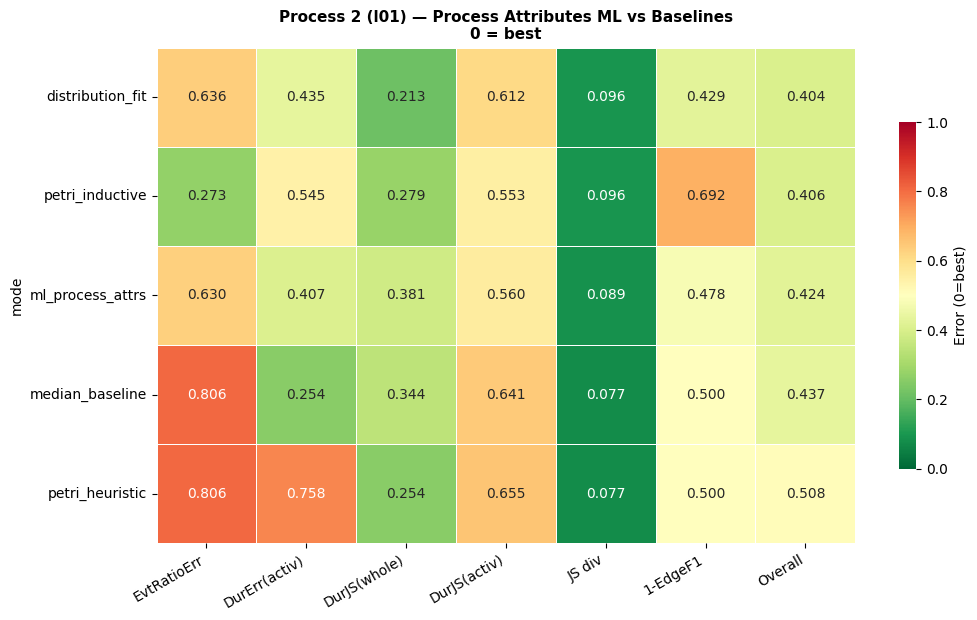


Process 2 (l01) — Process Attributes ML vs Baselines
------------------------------------------------------------
                  EvtRatioErr  DurErr(activ)  DurJS(whole)  DurJS(activ)  JS div  1-EdgeF1  Overall
mode                                                                                               
distribution_fit       0.6364         0.4347        0.2131        0.6124  0.0964    0.4286   0.4036
petri_inductive        0.2727         0.5451        0.2785        0.5533  0.0962    0.6923   0.4064
ml_process_attrs       0.6296         0.4072        0.3811        0.5597  0.0886    0.4783   0.4241
median_baseline        0.8056         0.2542        0.3440        0.6415  0.0775    0.5000   0.4371
petri_heuristic        0.8056         0.7575        0.2541        0.6545  0.0775    0.5000   0.5082


In [19]:
_plot_short_heatmap(
    evaluation_results_df,
    title='Process 2 (l01) — Process Attributes ML vs Baselines',
    split='test',
)

## 8 · Per-activity breakdown

In [20]:
# Duration error per activity: compare real vs simulated median duration
def activity_duration_table(mode_label, stats_df, production_plan, real_log,
                             sim_mode, process_models=None, ml_models=None):
    sim_log = ProcessSimulation(
        stats_df, production_plan,
        mode=sim_mode, process_models=process_models, ml_models=ml_models,
        verbose=False,
    ).run()
    if sim_log is None or len(sim_log) == 0:
        return pd.DataFrame()

    real_act = (
        real_log.assign(_d=(pd.to_datetime(real_log['timestamp_end']) -
                            pd.to_datetime(real_log['timestamp_start'])).dt.total_seconds() / 60)
        .groupby('activity')['_d'].median()
        .rename('real_median_min')
    )
    sim_act = (
        sim_log.assign(_d=(pd.to_datetime(sim_log['timestamp_end']) -
                           pd.to_datetime(sim_log['timestamp_start'])).dt.total_seconds() / 60)
        .groupby('activity')['_d'].median()
        .rename(f'{mode_label}_median_min')
    )
    return pd.concat([real_act, sim_act], axis=1)


tables = {}
for label, mode, pm, ml in [
    ('median_baseline', 'petri_net_median_duration', pm_heuristic, None),
    ('distribution_fit', 'statistical',              None,         None),
    ('petri_heuristic',  'petri_net',                pm_heuristic, None),
    ('ml_process_attrs', 'ml',                       pm_heuristic, ml_models),
]:
    tables[label] = activity_duration_table(label, stats_heuristic, pp_test, df_test, mode, pm, ml)

# Merge all into one summary table
from functools import reduce
all_acts = reduce(lambda a, b: a.join(b.drop(columns=['real_median_min'], errors='ignore'), how='outer'),
                  tables.values())
print('Per-activity median duration comparison (minutes):')
display(all_acts.round(1))

[DEBUG __init__] mode=petri_net_median_duration, process_models is None: False, process_models len: 1
Building config from 12 activities:
  Config: ('Grundstellung', 'l01', 'l01', 'l01')
    Transitions: {'Nachlauf': 0.038461538461538464, 'Vorwärmen des Warmwasserkreislaufs': 0.15384615384615385, 'Warten auf Ziel': 0.6538461538461539, '__END__': 0.15384615384615385}
    Start: True
  Config: ('Vorwärmen des Warmwasserkreislaufs', 'l01', 'l01', 'l01')
    Transitions: {'Warten auf Ziel': 1.0}
    Start: True
  Config: ('Warten auf Ziel', 'l01', 'l01', 'l01')
    Transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Start: True
  Config: ('Materialvalidierung', 'l01', 'l01', 'l01')
    Transitions: {'Leitung zum Vorheizer füllen': 0.11834319526627218, 'Produktion': 0.6863905325443787, 'Warten auf Quelle': 0.1952662721893

    [7] Fired 'Nachlauf' (dur=0.2 min)
    [8] Fired 'Warten auf Ziel' (dur=16.0 min)
    [9] Fired 'Materialvalidierung' (dur=0.1 min)
    [10] Fired 'Produktion' (dur=6.0 min)
    [11] Fired 'Nachlauf' (dur=0.2 min)
    [12] Fired 'Spülen auf Gully' (dur=0.6 min)
    [13] Fired 'Grundstellung' (dur=202.7 min)
    [14] Fired 'Vorwärmen des Warmwasserkreislaufs' (dur=0.6 min)
    [15] Fired 'Warten auf Ziel' (dur=51.0 min)
    [16] Fired 'Materialvalidierung' (dur=0.3 min)
    [17] Fired 'Produktion' (dur=5.5 min)
    [18] Fired 'Nachlauf' (dur=0.2 min)
    [19] Fired 'Warten auf Ziel' (dur=33.3 min)
    [20] Fired 'Materialvalidierung' (dur=0.3 min)
    [21] Fired 'Produktion' (dur=6.0 min)
    [22] Fired 'Nachlauf' (dur=0.2 min)
    [23] Fired 'Warten auf Ziel' (dur=108.7 min)
    [24] Fired 'Materialvalidierung' (dur=0.2 min)
    [25] Fired 'Produktion' (dur=7.9 min)
    [26] Fired 'Nachlauf' (dur=0.2 min)
    [27] Fired 'Warten auf Ziel' (dur=18.1 min)
    [28] Fired 'Materialvalid

    [2] Fired 'Produktion' (dur=4.4 min)
    [3] Fired 'Nachlauf' (dur=0.2 min)
    [4] Fired 'Warten auf Ziel' (dur=35.8 min)
    [5] Fired 'Fehler Tankanwahl Bestand' (dur=1.0 min)
    [6] Fired 'Grundstellung' (dur=1602.5 min)
    [7] Fired 'Warten auf Ziel' (dur=38.0 min)
    Final marking reached after 7 activities.
  Completed l01 Petri net simulation with 7 activities
Events generated so far: 189

CASE 13/15: shift_3_2024-11-20
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case shift_3_2024-11-20: Petri net simulation for l01 (l01)
    [1] Fired 'Materialvalidierung' (dur=0.2 min)
    [2] Fired 'Produktion' (dur=8.0 min)
    [3] Fired 'Nachlauf' (dur=0.2 min)
    [4] Fired 'Warten auf Ziel' (dur=48.3 min)
    [5] Fired 'Materialvalidierung' (dur=0.1 min)
    [6] Fired 'Produktion' (dur=5.2 min)
    [7] Fired 'Nachlauf' (dur=0.2 min)
    [8] Fired 'Spülen auf Gully' (dur=0.4 min)
    [9] Fired 'Grundstellung' (dur=0.3 min)
    Final marking reached after 9 activitie

    ML transitions: {'Leitung zum Vorheizer füllen': 0.003992282319813967, 'Produktion': 0.7016928195953369, 'Warten auf Quelle': 0.2943149209022522}
    Selected next activity: Produktion
    Processing activity 19: Produktion


    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 20: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 21: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 22: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung z

    Looking for transitions from: Spülen mit Wasser
    Statistical transitions: {'Nachlauf': 1.0}
    Selected next activity: Nachlauf
    Processing activity 22: Nachlauf
    Looking for transitions from: Nachlauf


    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 23: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Fehler Tankanwahl Bestand
    Processing activity 24: Fehler Tankanwahl Bestand
    Looking for transitions from: Fehler Tankanwahl Bestand
    ML transitions: {'Grundstellung': 0.05263161659240723, 'Warten auf Ziel': 0.9473683834075928}
    Selected next activity: Warten auf Ziel
    Processing activity 25: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, '

    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected END transition - stopping process
    Process ended after Warten auf Ziel
  Completed l01 process with 50 activities
Events generated so far: 81

CASE 4/15: shift_1_2024-11-21
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case shift_1_2024-11-21: Found 1 unique object configurations:
  - l01 (l01) with higher_level: l01

Case shift_1_2024-11-21: Simulating l01 (l01) process
  Looking for start activities for: l01 (l01) with higher_level: l01
    Found start activity: Grundstellung
    Found start activity: Vorwärmen des Warmwasserkreislaufs
    Found start activity: Warten auf Ziel
    Found start activity: Materialvalidierung
    Found start activity: Nachlauf
  Starting with activity:

    Looking for transitions from: Vorwärmen des Warmwasserkreislaufs
    Statistical transitions: {'Warten auf Ziel': 1.0}
    Selected next activity: Warten auf Ziel
    Processing activity 2: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 3: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung zum Vorheizer füllen': 0.0008697721641510725, 'Produktion': 0.9980555772781372, 'Warten auf Quelle': 0.0010747081832960248}
    Selected next activity: Produktion
    Processing activity 4: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nac

    ML transitions: {'Leitung zum Vorheizer füllen': 0.001215035212226212, 'Produktion': 0.9930651187896729, 'Warten auf Quelle': 0.005719803739339113}


    Selected next activity: Produktion
    Processing activity 16: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 17: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 18: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 19: Materialvalidierung
    Lo

    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 12: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 13: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung zum Vorheizer füllen': 0.012751778587698936, 'Produktion': 0.8642697930335999, 'Warten auf Quelle': 0.12297838926315308}
    Selected next activity: Produktion
    Processing activity 14: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.00

    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 41: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 42: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Fehler Tankanwahl Bestand
    Processing activity 43: Fehler Tankanwahl Bestand
    Looking for transitions from: Fehler Tankanwahl Bestand
    ML transi

    ML transitions: {'Grundstellung': 0.05263161659240723, 'Warten auf Ziel': 0.9473683834075928}
    Selected next activity: Warten auf Ziel
    Processing activity 68: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 69: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung zum Vorheizer füllen': 0.012751778587698936, 'Produktion': 0.8642697930335999, 'Warten auf Quelle': 0.12297838926315308}
    Selected next activity: Produktion
    Processing activity 70: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269

    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 97: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 98: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 99: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung z

    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 126: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung zum Vorheizer füllen': 0.012751778587698936, 'Produktion': 0.8642697930335999, 'Warten auf Quelle': 0.12297838926315308}
    Selected next activity: Produktion
    Processing activity 127: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 128: Nachlauf
    Looking for transitions from

    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung zum Vorheizer füllen': 0.0008950668852776289, 'Produktion': 0.997713565826416, 'Warten auf Quelle': 0.0013913303846493363}
    Selected next activity: Produktion
    Processing activity 17: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 18: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 19: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvali

    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Fehler Tankanwahl Bestand
    Processing activity 12: Fehler Tankanwahl Bestand
    Looking for transitions from: Fehler Tankanwahl Bestand
    ML transitions: {'Grundstellung': 0.05263161659240723, 'Warten auf Ziel': 0.9473683834075928}
    Selected next activity: Warten auf Ziel
    Processing activity 13: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected END transition - stopping process
    Process ended after War

    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Warten auf Quelle
    Processing activity 16: Warten auf Quelle
    Looking for transitions from: Warten auf Quelle
    Statistical transitions: {'Leitung zum Vorheizer füllen': 0.11428571428571428, 'Produktion': 0.8857142857142857}
    Selected next activity: Produktion
    Processing activity 17: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 18: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf

Per-activity median duration comparison (minutes):


,real_median_min,median_baseline_median_min,distribution_fit_median_min,petri_heuristic_median_min,ml_process_attrs_median_min
activity,,,,,
Fehler Tankanwahl Bestand,0.3,0.3,2.2,1.3,4.9
Grundstellung,46.0,44.5,93.1,43.2,45.7
Leitung zum HSM füllen,0.2,NaN,0.2,NaN,0.2
Leitung zum Vorheizer füllen,3.4,NaN,3.3,NaN,3.4
Materialvalidierung,0.1,0.1,0.2,0.2,0.1
Nachlauf,0.2,0.2,0.2,0.2,0.2
Produktion,6.8,6.8,6.5,6.7,6.7
Spülen auf Gully,0.5,0.5,0.8,0.6,NaN
Spülen mit Wasser,2.3,2.2,2.3,2.3,2.3


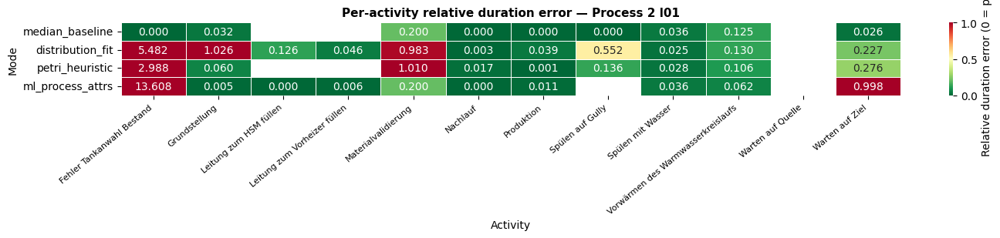

In [21]:
# Heatmap of per-activity relative duration error
err_df = pd.DataFrame(index=all_acts.index)
real_col = all_acts['real_median_min']
for col in all_acts.columns:
    if col == 'real_median_min':
        continue
    mode_name = col.replace('_median_min', '')
    err_df[mode_name] = ((all_acts[col] - real_col) / real_col.replace(0, np.nan)).abs()

err_df = err_df.T   # modes as rows, activities as columns

fig, ax = plt.subplots(figsize=(max(8, len(err_df.columns) * 1.2), max(3, len(err_df) * 0.8)))
sns.heatmap(
    err_df.round(3), annot=True, fmt='.3f',
    cmap='RdYlGn_r', vmin=0, vmax=1,
    linewidths=0.5, linecolor='white',
    cbar_kws={'label': 'Relative duration error (0 = perfect)'},
    ax=ax,
)
ax.set_title('Per-activity relative duration error — Process 2 l01',
             fontsize=11, fontweight='bold')
ax.set_xlabel('Activity')
ax.set_ylabel('Mode')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha='right', fontsize=8)
plt.tight_layout()
plt.show()

## 9 · SHAP feature importance — duration models

In [22]:
import shap

MIN_SAMPLES_SHAP = 10

def _fname(col):
    return (col.replace('attr_', '')
               .replace('prev_activity_', 'prev act ')
               .replace('prev_duration_', 'prev dur ')
               .replace('_', ' ').strip())

# Collect XGBoost duration models with enough training data
shap_items = []
for key, (model, feature_cols, model_type) in ml_models.duration_models.items():
    activity = key[0]
    if model_type != 'xgboost':
        print(f'  [{activity}] model_type={model_type} — skipping')
        continue
    group = raw_df[raw_df['activity'] == activity]
    if len(group) < MIN_SAMPLES_SHAP:
        print(f'  [{activity}] only {len(group)} samples — skipping')
        continue
    X = ml_models._build_X(group, feature_cols)
    shap_items.append((activity, model, X, feature_cols))

print(f'\n{len(shap_items)} activities to plot:')
for act, _, X, _ in shap_items:
    print(f'  {act!r}: {len(X)} samples')

  [Grundstellung] model_type=median — skipping
  [Leitung zum HSM füllen] model_type=median — skipping
  [Leitung zum Vorheizer füllen] model_type=median — skipping
  [Materialvalidierung] model_type=median — skipping
  [Nachlauf] model_type=median — skipping
  [Vorwärmen des Warmwasserkreislaufs] model_type=mean — skipping

6 activities to plot:
  'Fehler Tankanwahl Bestand': 19 samples
  'Produktion': 171 samples
  'Spülen auf Gully': 23 samples
  'Spülen mit Wasser': 23 samples
  'Warten auf Quelle': 35 samples
  'Warten auf Ziel': 191 samples


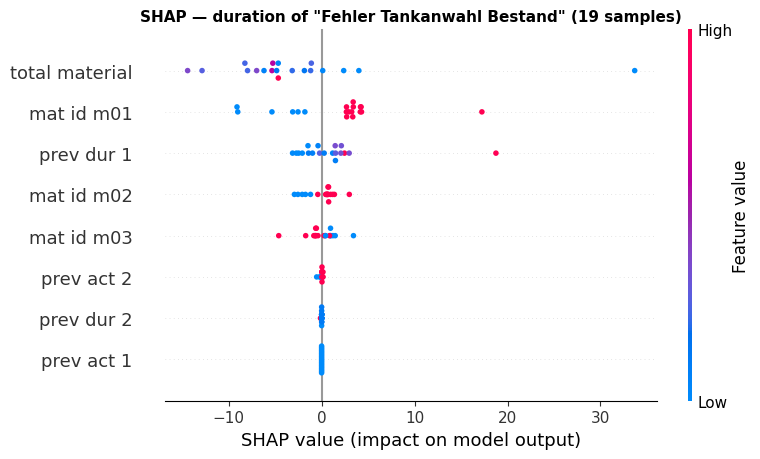

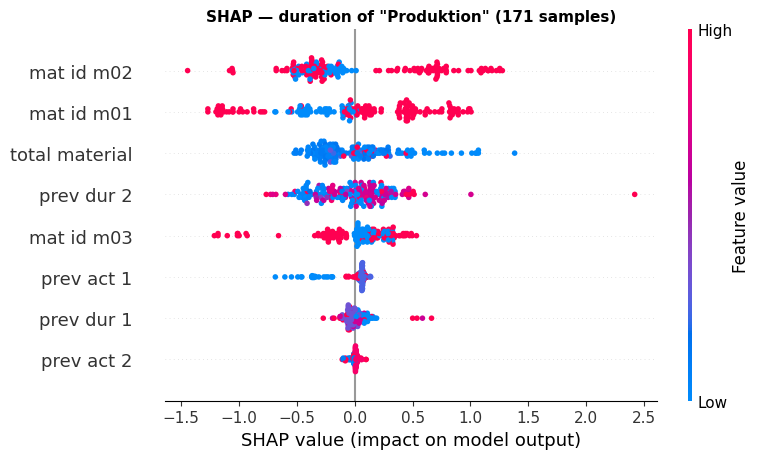

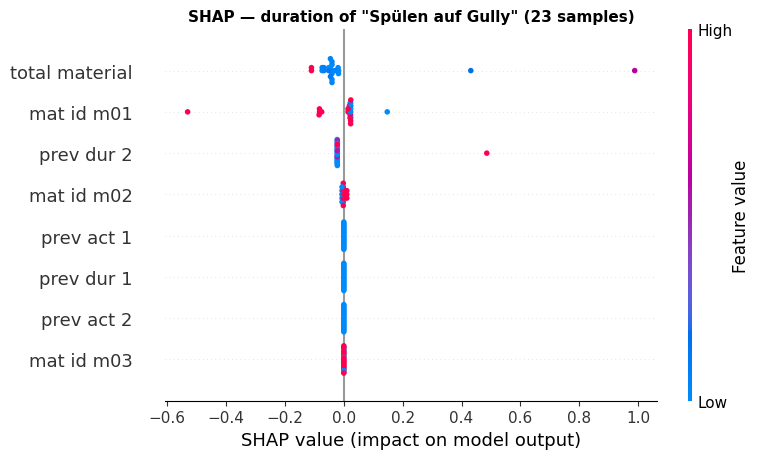

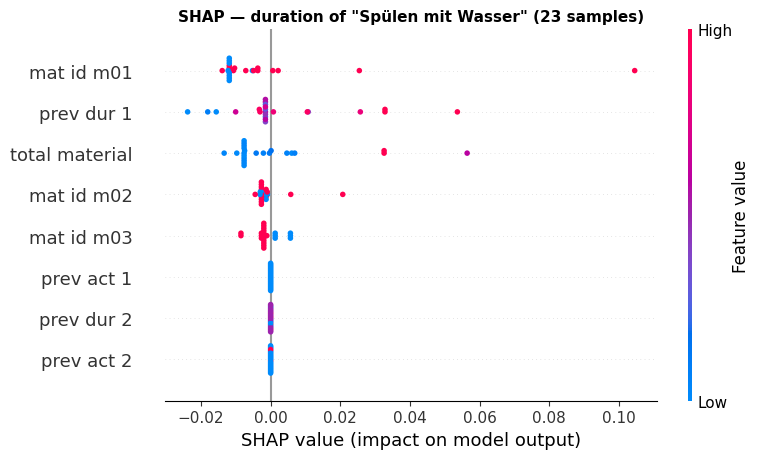

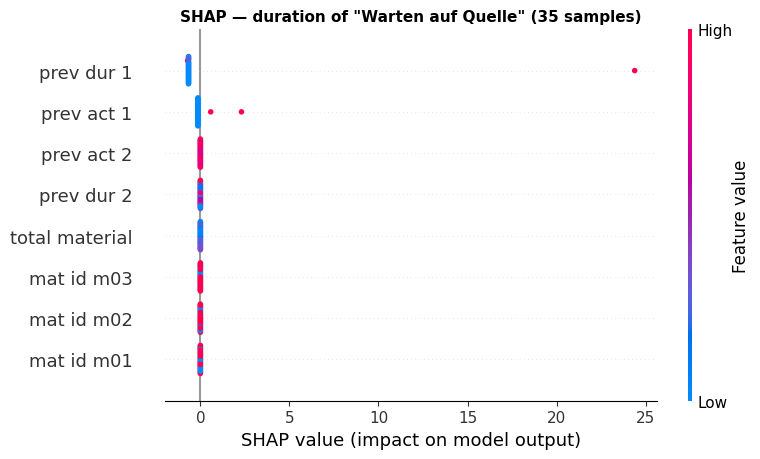

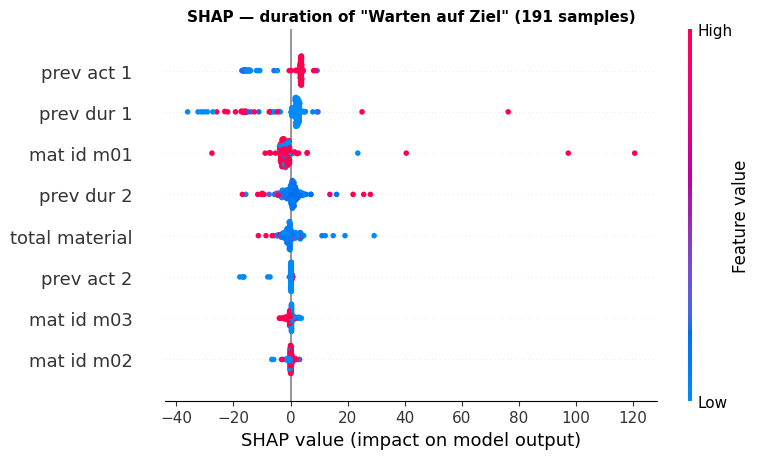

In [23]:
import xgboost as xgb

for activity, model, X, feature_cols in shap_items:
    booster = model.get_booster()
    dmat = xgb.DMatrix(X)
    # pred_contribs=True gives exact Tree SHAP values natively — no SHAP version issues
    contribs = booster.predict(dmat, pred_contribs=True)
    sv = contribs[:, :-1]   # last column is the bias term
    readable = [_fname(c) for c in X.columns]

    shap.summary_plot(sv, X.values, feature_names=readable, plot_type='dot', show=False)
    plt.title(f'SHAP — duration of "{activity}" ({len(X)} samples)',
              fontsize=11, fontweight='bold')
    plt.tight_layout()
    plt.show()

---
## Cross-process comparison: MAE & WAPE per process × approach

Runs all 5 approaches on every process and collects **per-activity MAE** (mean minutes off) and **WAPE** (weighted absolute % error on median durations). Uses the same temporal 70/30 split as above. Process 2 is still filtered to line l01; the others use all events.

In [24]:
import traceback
from functools import reduce

PROCESSES_TO_RUN = ['process_1', 'process_2', 'process_3', 'process_4']
OBJECT_FILTERS   = {'process_2': 'l01'}   # None means no filter
TRAIN_RATIO_CP   = 0.70

def load_and_split(process):
    gb = Path(SRC_DIR).parent / 'data' / 'gold' / 'experiment_1' / process / 'datasets'
    el = pd.read_parquet(gb / 'df_event_log.parquet')
    el['timestamp_start'] = pd.to_datetime(el['timestamp_start'])
    el['timestamp_end']   = pd.to_datetime(el['timestamp_end'])

    obj_filter = OBJECT_FILTERS.get(process)
    if obj_filter and 'object' in el.columns:
        el = el[el['object'] == obj_filter].copy()

    el = el.dropna(subset=['case_id', 'activity', 'timestamp_start', 'timestamp_end'])

    case_order = el.groupby('case_id')['timestamp_start'].min().sort_values().index.tolist()
    n_train = max(1, int(len(case_order) * TRAIN_RATIO_CP))
    train_ids = set(case_order[:n_train])
    test_ids  = set(case_order[n_train:])

    df_tr = el[el['case_id'].isin(train_ids)].copy()
    df_te = el[el['case_id'].isin(test_ids)].copy()

    agg = {'timestamp_start': ('timestamp_start', 'min'),
           'timestamp_end':   ('timestamp_end',   'max')}
    if 'object_attributes' in el.columns:
        agg['object_attributes'] = ('object_attributes', 'first')
    pp_te = df_te.groupby('case_id').agg(**agg).reset_index()

    return df_tr, df_te, pp_te


def get_act_dur_table(label, stats_df, pp_test, df_test,
                      sim_mode, process_models=None, ml_models=None):
    """Returns DataFrame with real_median_min and {label}_median_min per activity."""
    sim = ProcessSimulation(stats_df, pp_test, mode=sim_mode,
                            process_models=process_models,
                            ml_models=ml_models, verbose=False).run()
    if sim is None or len(sim) == 0:
        return pd.DataFrame()

    real = (df_test
            .assign(_d=(pd.to_datetime(df_test['timestamp_end']) -
                        pd.to_datetime(df_test['timestamp_start'])).dt.total_seconds()/60)
            .groupby('activity')['_d'].median().rename('real_median_min'))
    sim_d = (sim
             .assign(_d=(pd.to_datetime(sim['timestamp_end']) -
                         pd.to_datetime(sim['timestamp_start'])).dt.total_seconds()/60)
             .groupby('activity')['_d'].median().rename(f'{label}_median_min'))
    return pd.concat([real, sim_d], axis=1)


def mae_wape_from_tables(tables):
    """Given {mode: table_df}, compute MAE and WAPE for each mode."""
    all_acts = reduce(
        lambda a, b: a.join(b.drop(columns=['real_median_min'], errors='ignore'), how='outer'),
        tables.values()
    )
    real = all_acts['real_median_min'].dropna()
    out = {}
    for mode in tables:
        col = f'{mode}_median_min'
        if col not in all_acts.columns:
            continue
        pred  = all_acts[col]
        idx   = real.index.intersection(pred.dropna().index)
        r, p  = real[idx].values, pred[idx].values
        if len(r) == 0:
            out[mode] = dict(mae=np.nan, wape=np.nan); continue
        out[mode] = dict(
            mae  = float(np.mean(np.abs(p - r))),
            wape = float(100 * np.sum(np.abs(p - r)) / np.sum(np.abs(r)))
                   if np.sum(np.abs(r)) > 0 else np.nan,
        )
    return out


# ── Main loop ──────────────────────────────────────────────────────────────────
cross_results = []   # list of dicts: process, mode, mae, wape

MODES_CFG = [
    ('median_baseline', 'petri_net_median_duration', 'heuristic', False),
    ('distribution_fit', 'statistical',              'heuristic', False),
    ('petri_heuristic',  'petri_net',                'heuristic', False),
    ('petri_inductive',  'petri_net',                'inductive', False),
    ('ml_process_attrs', 'ml',                       'heuristic', True),
]

for proc in PROCESSES_TO_RUN:
    print(f'\n{"="*60}\n{proc}')
    try:
        df_tr, df_te, pp_te = load_and_split(proc)
        print(f'  train {len(df_tr["case_id"].unique())} cases, test {len(df_te["case_id"].unique())} cases')

        # Extract process models
        stats_heu, raw_heu, pm_heu = extract_process(
            df_tr, mining_algorithm='heuristic', optimize_mining_hyperparams=False)
        stats_ind, _,       pm_ind = extract_process(
            df_tr, mining_algorithm='inductive',  optimize_mining_hyperparams=False)

        # Train ML model
        ml = SimModeller(model_types=['xgboost','mean','median'],
                         optimize_hyperparams=False, train_transitions=True)
        ml.train(raw_heu, stats_heu)

        model_map = {'heuristic': (stats_heu, pm_heu), 'inductive': (stats_ind, pm_ind)}

        tables = {}
        for label, sim_mode, miner, use_ml in MODES_CFG:
            stats_df, pm_use = model_map[miner]
            ml_use = ml if use_ml else None
            try:
                t = get_act_dur_table(label, stats_df, pp_te, df_te,
                                      sim_mode, pm_use, ml_use)
                if not t.empty:
                    tables[label] = t
                    print(f'  [{label}] OK')
                else:
                    print(f'  [{label}] empty sim log — skipped')
            except Exception as e:
                print(f'  [{label}] ERROR: {e}')

        metrics = mae_wape_from_tables(tables)
        for mode, vals in metrics.items():
            cross_results.append({'process': proc, 'mode': mode, **vals})

    except Exception as e:
        print(f'  FAILED: {e}')
        traceback.print_exc()

cross_df = pd.DataFrame(cross_results)
print('\n\nDone. Summary:')
display(cross_df.pivot(index='process', columns='mode', values='wape').round(1))


process_1
  train 1533 cases, test 657 cases

Processing: sterilization_process (8 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 22 unique activities: ['water_supply_prepare' 'water_supply_working' 'destillation_heat'
 'bottling_prepare' 'bottling_working' 'bottling_cool'
 'autoclaving_1_prepare' 'autoclaving_1_heat' 'autoclaving_1_hold'
 'autoclaving_1_cool' 'packaging_prepare' 'packaging_working'
 'warehousing_prepare' 'warehousing_working' 'autoclaving_2_prepare'
 'autoclaving_2_heat' 'autoclaving_2_hold' 'autoclaving_2_cool'
 'autoclaving_3_prepare' 'autoclaving_3_heat' 'autoclaving_3_hold'
 'autoclaving_3_cool']


    water_supply_prepare: best fit = weibull_min (3.2580397428477172, 0.0, 0.11167301834301314)


    water_supply_working: best fit = weibull_min (3.25614757967511, 0.0, 1.3404131363271519)


    destillation_heat: best fit = weibull_min (3.2549303143058177, 0.0, 0.6704339890562847)


    bottling_prepare: best fit = weibull_min (3.2580397428477172, 0.0, 0.11167301834301314)


    bottling_working: best fit = weibull_min (3.2112863655797685, 0.0, 0.7480378987499562)


    bottling_cool: best fit = weibull_min (3.2580397428477172, 0.0, 0.11167301834301314)


    autoclaving_1_prepare: best fit = norm (2.00015260603097, 0.040883540124555584)


    autoclaving_1_heat: best fit = weibull_min (8.377254188417748, 0.0, 17.562068559154074)


    autoclaving_1_hold: best fit = weibull_min (7.147424260142181, 0.0, 13.592185048045966)


    autoclaving_1_cool: best fit = weibull_min (7.945215927002271, 0.0, 27.270542691372068)


    packaging_prepare: best fit = norm (3.9900811714285718, 1.9951219800828741)


    packaging_working: best fit = norm (3.992825818014786, 1.996179319360958)


    warehousing_prepare: best fit = norm (3.9960306670689283, 1.9981437856029447)


    warehousing_working: best fit = norm (3.9956765136442702, 1.996787322207397)


    autoclaving_2_prepare: best fit = lognorm (0.02018525711108521, 0.0, 2.0025290938285703)


    autoclaving_2_heat: best fit = weibull_min (8.508546008540861, 0.0, 17.579933704443384)


    autoclaving_2_hold: best fit = weibull_min (7.33824814908634, 0.0, 13.622483653695244)


    autoclaving_2_cool: best fit = weibull_min (8.124496633892939, 0.0, 27.326439458824247)


    autoclaving_3_prepare: best fit = norm (2.0008051032828282, 0.03956632746293716)


    autoclaving_3_heat: best fit = weibull_min (7.472998605224257, 0.0, 17.422830181648276)


    autoclaving_3_hold: best fit = weibull_min (6.386608478225549, 0.0, 13.481243779899398)


    autoclaving_3_cool: best fit = weibull_min (7.104419451464237, 0.0, 27.061328519688523)


    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.9800, fitness=1.0000, precision=1.0000, generalization=0.964261205983456, simplicity=0.9555555555555555
    Selected params: noise=0.2, heur={} (score=0.9800)
    Petri net: 21 places, 22 transitions, 44 arcs
    Stochastic map: 22 transition weights


    Decision-point weights: 20 decision points, 0 with __END__ probability
    Max case length in training: 14
      water_supply_prepare: Start=True, End=False, Transitions={'water_supply_working': 1.0}
      water_supply_working: Start=False, End=False, Transitions={'destillation_heat': 1.0}
      destillation_heat: Start=False, End=False, Transitions={'bottling_prepare': 1.0}
      bottling_prepare: Start=False, End=False, Transitions={'bottling_working': 1.0}
      bottling_working: Start=False, End=False, Transitions={'bottling_cool': 1.0}
      bottling_cool: Start=False, End=False, Transitions={'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
      autoclaving_1_prepare: Start=False, End=False, Transitions={'autoclaving_1_heat': 1.0}
      autoclaving_1_heat: Start=False, End=False, Transitions={'autoclaving_1_hold': 1.0}
      autoclaving_1_hold: Start=False, End=False, Transitions={'autoclavi

    History weights: 24 bigram keys, 22 activity-count keys

Processing: sterilization_process (8 objects, one whole-process net)
  Mining algorithm: inductive
  Found 22 unique activities: ['water_supply_prepare' 'water_supply_working' 'destillation_heat'
 'bottling_prepare' 'bottling_working' 'bottling_cool'
 'autoclaving_1_prepare' 'autoclaving_1_heat' 'autoclaving_1_hold'
 'autoclaving_1_cool' 'packaging_prepare' 'packaging_working'
 'warehousing_prepare' 'warehousing_working' 'autoclaving_2_prepare'
 'autoclaving_2_heat' 'autoclaving_2_hold' 'autoclaving_2_cool'
 'autoclaving_3_prepare' 'autoclaving_3_heat' 'autoclaving_3_hold'
 'autoclaving_3_cool']


    water_supply_prepare: best fit = weibull_min (3.2580397428477172, 0.0, 0.11167301834301314)


    water_supply_working: best fit = weibull_min (3.25614757967511, 0.0, 1.3404131363271519)


    destillation_heat: best fit = weibull_min (3.2549303143058177, 0.0, 0.6704339890562847)


    bottling_prepare: best fit = weibull_min (3.2580397428477172, 0.0, 0.11167301834301314)


    bottling_working: best fit = weibull_min (3.2112863655797685, 0.0, 0.7480378987499562)


    bottling_cool: best fit = weibull_min (3.2580397428477172, 0.0, 0.11167301834301314)


    autoclaving_1_prepare: best fit = norm (2.00015260603097, 0.040883540124555584)


    autoclaving_1_heat: best fit = weibull_min (8.377254188417748, 0.0, 17.562068559154074)


    autoclaving_1_hold: best fit = weibull_min (7.147424260142181, 0.0, 13.592185048045966)


    autoclaving_1_cool: best fit = weibull_min (7.945215927002271, 0.0, 27.270542691372068)


    packaging_prepare: best fit = norm (3.9900811714285718, 1.9951219800828741)


    packaging_working: best fit = norm (3.992825818014786, 1.996179319360958)


    warehousing_prepare: best fit = norm (3.9960306670689283, 1.9981437856029447)


    warehousing_working: best fit = norm (3.9956765136442702, 1.996787322207397)


    autoclaving_2_prepare: best fit = lognorm (0.02018525711108521, 0.0, 2.0025290938285703)


    autoclaving_2_heat: best fit = weibull_min (8.508546008540861, 0.0, 17.579933704443384)


    autoclaving_2_hold: best fit = weibull_min (7.33824814908634, 0.0, 13.622483653695244)


    autoclaving_2_cool: best fit = weibull_min (8.124496633892939, 0.0, 27.326439458824247)


    autoclaving_3_prepare: best fit = norm (2.0008051032828282, 0.03956632746293716)


    autoclaving_3_heat: best fit = weibull_min (7.472998605224257, 0.0, 17.422830181648276)


    autoclaving_3_hold: best fit = weibull_min (6.386608478225549, 0.0, 13.481243779899398)


    autoclaving_3_cool: best fit = weibull_min (7.104419451464237, 0.0, 27.061328519688523)


    Mining Petri net with 'inductive' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.9800, fitness=1.0000, precision=1.0000, generalization=0.964261205983456, simplicity=0.9555555555555555
    Selected params: noise=0.2, heur={} (score=0.9800)
    Petri net: 21 places, 22 transitions, 44 arcs


    Stochastic map: 22 transition weights


    Decision-point weights: 20 decision points, 0 with __END__ probability
    Max case length in training: 14
      water_supply_prepare: Start=True, End=False, Transitions={'water_supply_working': 1.0}
      water_supply_working: Start=False, End=False, Transitions={'destillation_heat': 1.0}
      destillation_heat: Start=False, End=False, Transitions={'bottling_prepare': 1.0}
      bottling_prepare: Start=False, End=False, Transitions={'bottling_working': 1.0}
      bottling_working: Start=False, End=False, Transitions={'bottling_cool': 1.0}
      bottling_cool: Start=False, End=False, Transitions={'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
      autoclaving_1_prepare: Start=False, End=False, Transitions={'autoclaving_1_heat': 1.0}
      autoclaving_1_heat: Start=False, End=False, Transitions={'autoclaving_1_hold': 1.0}
      autoclaving_1_hold: Start=False, End=False, Transitions={'autoclavi

    History weights: 24 bigram keys, 22 activity-count keys



[SimModeller] Model types      : ['xgboost', 'mean', 'median']
[SimModeller] Optuna tuning    : False
[SimModeller] Internal val %   : 20%
[SimModeller] Feature columns  : ['attr_recipe', 'attr_volume_L', 'prev_activity_1', 'prev_duration_1', 'prev_activity_2', 'prev_duration_2']



  Key: ('autoclaving_1_cool', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 408, Val size: 103, Total: 511
    Duration [ xgboost]  MAE=0.410  RMSE=0.504  R²=0.991
    Duration [    mean]  MAE=4.204  RMSE=5.189  R²=-0.001
    Duration [  median]  MAE=2.862  RMSE=5.639  R²=-0.182
    ✓ Best duration model: xgboost  (val MAE=0.410)



  Key: ('autoclaving_1_heat', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 408, Val size: 103, Total: 511
    Duration [ xgboost]  MAE=0.398  RMSE=0.907  R²=0.919
    Duration [    mean]  MAE=2.578  RMSE=3.187  R²=-0.001
    Duration [  median]  MAE=1.795  RMSE=3.459  R²=-0.179
    ✓ Best duration model: xgboost  (val MAE=0.398)



  Key: ('autoclaving_1_hold', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 408, Val size: 103, Total: 511
    Duration [ xgboost]  MAE=0.261  RMSE=0.366  R²=0.983
    Duration [    mean]  MAE=2.223  RMSE=2.792  R²=-0.000
    Duration [  median]  MAE=1.529  RMSE=3.070  R²=-0.209
    ✓ Best duration model: xgboost  (val MAE=0.261)



  Key: ('autoclaving_1_prepare', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 408, Val size: 103, Total: 511
    Duration [ xgboost]  MAE=0.525  RMSE=0.865  R²=-0.177
    Duration [    mean]  MAE=0.646  RMSE=0.797  R²=-0.001
    Duration [  median]  MAE=0.418  RMSE=0.875  R²=-0.204
    ✓ Best duration model: median  (val MAE=0.418)



  Key: ('autoclaving_2_cool', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 408, Val size: 103, Total: 511
    Duration [ xgboost]  MAE=0.548  RMSE=0.806  R²=0.970
    Duration [    mean]  MAE=3.847  RMSE=4.697  R²=-0.035
    Duration [  median]  MAE=2.272  RMSE=4.907  R²=-0.129
    ✓ Best duration model: xgboost  (val MAE=0.548)



  Key: ('autoclaving_2_heat', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 408, Val size: 103, Total: 511
    Duration [ xgboost]  MAE=0.420  RMSE=0.902  R²=0.900
    Duration [    mean]  MAE=2.348  RMSE=2.896  R²=-0.030
    Duration [  median]  MAE=1.437  RMSE=3.022  R²=-0.122
    ✓ Best duration model: xgboost  (val MAE=0.420)



  Key: ('autoclaving_2_hold', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 408, Val size: 103, Total: 511
    Duration [ xgboost]  MAE=0.259  RMSE=0.418  R²=0.972
    Duration [    mean]  MAE=2.046  RMSE=2.523  R²=-0.029
    Duration [  median]  MAE=1.194  RMSE=2.658  R²=-0.142
    ✓ Best duration model: xgboost  (val MAE=0.259)



  Key: ('autoclaving_2_prepare', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 408, Val size: 103, Total: 511
    Duration [ xgboost]  MAE=0.442  RMSE=0.786  R²=-0.243
    Duration [    mean]  MAE=0.575  RMSE=0.713  R²=-0.025
    Duration [  median]  MAE=0.317  RMSE=0.761  R²=-0.168
    ✓ Best duration model: median  (val MAE=0.317)



  Key: ('autoclaving_3_cool', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 408, Val size: 103, Total: 511
    Duration [ xgboost]  MAE=0.438  RMSE=0.564  R²=0.990
    Duration [    mean]  MAE=4.631  RMSE=5.700  R²=-0.015
    Duration [  median]  MAE=3.637  RMSE=6.558  R²=-0.343
    ✓ Best duration model: xgboost  (val MAE=0.438)



  Key: ('autoclaving_3_heat', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 408, Val size: 103, Total: 511
    Duration [ xgboost]  MAE=0.283  RMSE=0.382  R²=0.988
    Duration [    mean]  MAE=2.946  RMSE=3.578  R²=-0.010
    Duration [  median]  MAE=2.317  RMSE=4.053  R²=-0.297
    ✓ Best duration model: xgboost  (val MAE=0.283)



  Key: ('autoclaving_3_hold', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 408, Val size: 103, Total: 511
    Duration [ xgboost]  MAE=0.260  RMSE=0.323  R²=0.989
    Duration [    mean]  MAE=2.524  RMSE=3.095  R²=-0.013
    Duration [  median]  MAE=2.004  RMSE=3.549  R²=-0.332
    ✓ Best duration model: xgboost  (val MAE=0.260)



  Key: ('autoclaving_3_prepare', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 408, Val size: 103, Total: 511
    Duration [ xgboost]  MAE=0.615  RMSE=0.993  R²=-0.267
    Duration [    mean]  MAE=0.733  RMSE=0.887  R²=-0.010
    Duration [  median]  MAE=0.544  RMSE=1.018  R²=-0.331
    ✓ Best duration model: median  (val MAE=0.544)



  Key: ('bottling_cool', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 1226, Val size: 307, Total: 1533
    Duration [ xgboost]  MAE=0.000  RMSE=0.000  R²=1.000
    Duration [    mean]  MAE=0.029  RMSE=0.034  R²=-0.000
    Duration [  median]  MAE=0.029  RMSE=0.034  R²=-0.001
    ✓ Best duration model: xgboost  (val MAE=0.000)


    Transition [ xgboost]  Acc=0.296  F1=0.294
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of multiclass and continuous targets
    Transition [  median]  Acc=0.332  F1=0.166
    ✓ Best transition model: median  (val Acc=0.332)



  Key: ('bottling_prepare', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 1226, Val size: 307, Total: 1533
    Duration [ xgboost]  MAE=0.000  RMSE=0.001  R²=1.000
    Duration [    mean]  MAE=0.029  RMSE=0.034  R²=-0.000
    Duration [  median]  MAE=0.029  RMSE=0.034  R²=-0.001
    ✓ Best duration model: xgboost  (val MAE=0.000)



  Key: ('bottling_working', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 1226, Val size: 307, Total: 1533
    Duration [ xgboost]  MAE=0.030  RMSE=0.041  R²=0.968
    Duration [    mean]  MAE=0.197  RMSE=0.228  R²=-0.001
    Duration [  median]  MAE=0.197  RMSE=0.228  R²=-0.000
    ✓ Best duration model: xgboost  (val MAE=0.030)



  Key: ('destillation_heat', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 1226, Val size: 307, Total: 1533
    Duration [ xgboost]  MAE=0.006  RMSE=0.008  R²=0.998
    Duration [    mean]  MAE=0.175  RMSE=0.203  R²=-0.000
    Duration [  median]  MAE=0.175  RMSE=0.203  R²=-0.001
    ✓ Best duration model: xgboost  (val MAE=0.006)



  Key: ('packaging_prepare', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 1226, Val size: 307, Total: 1533
    Duration [ xgboost]  MAE=0.174  RMSE=0.241  R²=0.985
    Duration [    mean]  MAE=1.605  RMSE=1.985  R²=-0.000
    Duration [  median]  MAE=1.146  RMSE=2.182  R²=-0.208
    ✓ Best duration model: xgboost  (val MAE=0.174)



  Key: ('packaging_working', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 1226, Val size: 307, Total: 1533
    Duration [ xgboost]  MAE=0.166  RMSE=0.226  R²=0.987
    Duration [    mean]  MAE=1.599  RMSE=1.983  R²=-0.000
    Duration [  median]  MAE=1.152  RMSE=2.182  R²=-0.211
    ✓ Best duration model: xgboost  (val MAE=0.166)



  Key: ('warehousing_prepare', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 1226, Val size: 307, Total: 1533
    Duration [ xgboost]  MAE=0.158  RMSE=0.220  R²=0.988
    Duration [    mean]  MAE=1.595  RMSE=1.980  R²=-0.000
    Duration [  median]  MAE=1.128  RMSE=2.180  R²=-0.212
    ✓ Best duration model: xgboost  (val MAE=0.158)



  Key: ('warehousing_working', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 1226, Val size: 307, Total: 1533
    Duration [ xgboost]  MAE=0.161  RMSE=0.228  R²=0.987
    Duration [    mean]  MAE=1.599  RMSE=1.983  R²=-0.000
    Duration [  median]  MAE=1.138  RMSE=2.179  R²=-0.207


    ✓ Best duration model: xgboost  (val MAE=0.161)



  Key: ('water_supply_prepare', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 1226, Val size: 307, Total: 1533
    Duration [ xgboost]  MAE=0.000  RMSE=0.000  R²=1.000
    Duration [    mean]  MAE=0.029  RMSE=0.034  R²=-0.000
    Duration [  median]  MAE=0.029  RMSE=0.034  R²=-0.001
    ✓ Best duration model: xgboost  (val MAE=0.000)



  Key: ('water_supply_working', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Fit size: 1226, Val size: 307, Total: 1533
    Duration [ xgboost]  MAE=0.011  RMSE=0.015  R²=0.999
    Duration [    mean]  MAE=0.352  RMSE=0.408  R²=-0.000
    Duration [  median]  MAE=0.352  RMSE=0.408  R²=-0.000
    ✓ Best duration model: xgboost  (val MAE=0.011)



[SimModeller] Training complete – 22 duration models, 1 transition models.

  ── Training Global Duration Model ──


    Features (13): ['feat_activity', 'feat_object', 'feat_object_type', 'feat_higher_level_activity', 'prev_activity_1', 'prev_activity_2', 'prev_duration_1', 'prev_duration_2', 'activity_index', 'hour_of_day', 'day_of_week', 'attr_recipe', 'attr_volume_L']
    Training samples: 21462


    Global [ xgboost]  MAE=0.173  RMSE=0.488  R²=0.996
    Global [    mean]  MAE=5.471  RMSE=7.584  R²=-0.000
    Global [  median]  MAE=4.944  RMSE=8.346  R²=-0.211


    ✓ Best global model: xgboost  (val MAE=0.173)
[DEBUG __init__] mode=petri_net_median_duration, process_models is None: False, process_models len: 1
Building config from 22 activities:
  Config: ('water_supply_prepare', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'water_supply_working': 1.0}
    Start: True
  Config: ('water_supply_working', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'destillation_heat': 1.0}
    Start: False
  Config: ('destillation_heat', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'bottling_prepare': 1.0}
    Start: False
  Config: ('bottling_prepare', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'bottling_working': 1.0}
    Start: False
  Config: ('bottling_working', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'bottling_cool': 1.0}
    

    [12] Fired 'packaging_working' (dur=4.9 min)
    [13] Fired 'warehousing_prepare' (dur=4.9 min)
    [14] Fired 'warehousing_working' (dur=4.9 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 1050

CASE 76/657: batch_1609
[DEBUG _simulate_process_for_case] self.mode = 'petri_net_median_duration'

Case batch_1609: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=1.2 min)
    [3] Fired 'destillation_heat' (dur=0.6 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.7 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_3_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_3_heat' (dur=17.8 min)
    [9] Fired 'autoclaving_3_hold' (dur=13.9 min)
    [10] Fired 'autoclaving_3_cool' (dur=27.8 min)
    [11] Fired 'packa

    [8] Fired 'autoclaving_2_heat' (dur=17.9 min)
    [9] Fired 'autoclaving_2_hold' (dur=13.9 min)
    [10] Fired 'autoclaving_2_cool' (dur=27.9 min)
    [11] Fired 'packaging_prepare' (dur=4.9 min)
    [12] Fired 'packaging_working' (dur=4.9 min)
    [13] Fired 'warehousing_prepare' (dur=4.9 min)
    [14] Fired 'warehousing_working' (dur=4.9 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 2142

CASE 154/657: batch_1687
[DEBUG _simulate_process_for_case] self.mode = 'petri_net_median_duration'

Case batch_1687: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=1.2 min)
    [3] Fired 'destillation_heat' (dur=0.6 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.7 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclav

    [13] Fired 'warehousing_prepare' (dur=4.9 min)
    [14] Fired 'warehousing_working' (dur=4.9 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 3220

CASE 231/657: batch_1764
[DEBUG _simulate_process_for_case] self.mode = 'petri_net_median_duration'

Case batch_1764: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=1.2 min)
    [3] Fired 'destillation_heat' (dur=0.6 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.7 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_2_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_2_heat' (dur=17.9 min)
    [9] Fired 'autoclaving_2_hold' (dur=13.9 min)
    [10] Fired 'autoclaving_2_cool' (dur=27.9 min)
    [11] Fired 'packaging_prepare' (dur=4.9 min)
    [12] Fired 'pack

    [12] Fired 'packaging_working' (dur=4.9 min)
    [13] Fired 'warehousing_prepare' (dur=4.9 min)
    [14] Fired 'warehousing_working' (dur=4.9 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 4326

CASE 310/657: batch_1843
[DEBUG _simulate_process_for_case] self.mode = 'petri_net_median_duration'

Case batch_1843: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=1.2 min)
    [3] Fired 'destillation_heat' (dur=0.6 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.7 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_2_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_2_heat' (dur=17.9 min)
    [9] Fired 'autoclaving_2_hold' (dur=13.9 min)
    [10] Fired 'autoclaving_2_cool' (dur=27.9 min)
    [11] Fired 'pack

    [8] Fired 'autoclaving_1_heat' (dur=17.9 min)
    [9] Fired 'autoclaving_1_hold' (dur=13.9 min)
    [10] Fired 'autoclaving_1_cool' (dur=27.8 min)
    [11] Fired 'packaging_prepare' (dur=4.9 min)
    [12] Fired 'packaging_working' (dur=4.9 min)
    [13] Fired 'warehousing_prepare' (dur=4.9 min)
    [14] Fired 'warehousing_working' (dur=4.9 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 5418

CASE 388/657: batch_1921
[DEBUG _simulate_process_for_case] self.mode = 'petri_net_median_duration'

Case batch_1921: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=1.2 min)
    [3] Fired 'destillation_heat' (dur=0.6 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.7 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclav


Case batch_1996: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=1.2 min)
    [3] Fired 'destillation_heat' (dur=0.6 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.7 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_2_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_2_heat' (dur=17.9 min)
    [9] Fired 'autoclaving_2_hold' (dur=13.9 min)
    [10] Fired 'autoclaving_2_cool' (dur=27.9 min)
    [11] Fired 'packaging_prepare' (dur=4.9 min)
    [12] Fired 'packaging_working' (dur=4.9 min)
    [13] Fired 'warehousing_prepare' (dur=4.9 min)
    [14] Fired 'warehousing_working' (dur=4.9 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 6482

CASE 464/657: batch_1997
[DEBUG _simulate_process_for_case] self.mode =

    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=1.2 min)
    [3] Fired 'destillation_heat' (dur=0.6 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.7 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_3_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_3_heat' (dur=17.8 min)
    [9] Fired 'autoclaving_3_hold' (dur=13.9 min)
    [10] Fired 'autoclaving_3_cool' (dur=27.8 min)
    [11] Fired 'packaging_prepare' (dur=4.9 min)
    [12] Fired 'packaging_working' (dur=4.9 min)
    [13] Fired 'warehousing_prepare' (dur=4.9 min)
    [14] Fired 'warehousing_working' (dur=4.9 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 7392

CASE 529/657: batch_2062
[DEBUG _simulate_process_for_case] self.mode = 'petri_net_median_duration'

Case batch_2062: Petri net simulation for sterilization_


Case batch_2138: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=1.2 min)
    [3] Fired 'destillation_heat' (dur=0.6 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.7 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_2_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_2_heat' (dur=17.9 min)
    [9] Fired 'autoclaving_2_hold' (dur=13.9 min)
    [10] Fired 'autoclaving_2_cool' (dur=27.9 min)
    [11] Fired 'packaging_prepare' (dur=4.9 min)
    [12] Fired 'packaging_working' (dur=4.9 min)
    [13] Fired 'warehousing_prepare' (dur=4.9 min)
    [14] Fired 'warehousing_working' (dur=4.9 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 8470

CASE 606/657: batch_2139
[DEBUG _simulate_process_for_case] self.mode =

  [median_baseline] OK
[DEBUG __init__] mode=statistical, process_models is None: False, process_models len: 1
Building config from 22 activities:
  Config: ('water_supply_prepare', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'water_supply_working': 1.0}
    Start: True
  Config: ('water_supply_working', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'destillation_heat': 1.0}
    Start: False
  Config: ('destillation_heat', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'bottling_prepare': 1.0}
    Start: False
  Config: ('bottling_prepare', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'bottling_working': 1.0}
    Start: False
  Config: ('bottling_working', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'bottling_cool': 1.0}
    Start: False
  Config: ('bottling_cool', 

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    

Case batch_1691: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1691: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 

    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 3038

CASE 218/657: batch_1751
[DEBUG _simulate_process_for_case] self.mode = 'statistical'
Case batch_1751: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1751: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: w

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 7084

CASE 507/657: batch_2040
[DEBUG _simulate_process_for_case] self.mode = 'statistical'
Case batch_2040: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_2040: Simulating sterilization_process (sterilization_line) pr

    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    

    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 8400

CASE 601/657: batch_2134
[DEBUG _simulate_process_for_case] self.mode = 'statistical'
Case batch_2134: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_2134: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: w

  [distribution_fit] OK
[DEBUG __init__] mode=petri_net, process_models is None: False, process_models len: 1
Building config from 22 activities:
  Config: ('water_supply_prepare', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'water_supply_working': 1.0}
    Start: True
  Config: ('water_supply_working', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'destillation_heat': 1.0}
    Start: False
  Config: ('destillation_heat', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'bottling_prepare': 1.0}
    Start: False
  Config: ('bottling_prepare', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'bottling_working': 1.0}
    Start: False
  Config: ('bottling_working', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'bottling_cool': 1.0}
    Start: False
  Config: ('bottling_cool', '

    [2] Fired 'water_supply_working' (dur=0.8 min)
    [3] Fired 'destillation_heat' (dur=0.9 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.6 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_2_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_2_heat' (dur=20.0 min)
    [9] Fired 'autoclaving_2_hold' (dur=10.7 min)
    [10] Fired 'autoclaving_2_cool' (dur=26.9 min)
    [11] Fired 'packaging_prepare' (dur=8.9 min)
    [12] Fired 'packaging_working' (dur=4.3 min)
    [13] Fired 'warehousing_prepare' (dur=4.2 min)
    [14] Fired 'warehousing_working' (dur=5.4 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 728

CASE 53/657: batch_1586
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_1586: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (du

    [9] Fired 'autoclaving_1_hold' (dur=11.3 min)
    [10] Fired 'autoclaving_1_cool' (dur=25.1 min)
    [11] Fired 'packaging_prepare' (dur=5.2 min)
    [12] Fired 'packaging_working' (dur=4.1 min)
    [13] Fired 'warehousing_prepare' (dur=5.6 min)
    [14] Fired 'warehousing_working' (dur=4.1 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 1470

CASE 106/657: batch_1639
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_1639: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=0.6 min)
    [3] Fired 'destillation_heat' (dur=0.7 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.9 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_2_prepare' (dur=2.1 min)
    [8] Fired 'autoclaving_2_heat' (d


Case batch_1691: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=1.3 min)
    [3] Fired 'destillation_heat' (dur=0.6 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.9 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_3_prepare' (dur=1.9 min)
    [8] Fired 'autoclaving_3_heat' (dur=15.2 min)
    [9] Fired 'autoclaving_3_hold' (dur=11.2 min)
    [10] Fired 'autoclaving_3_cool' (dur=21.8 min)
    [11] Fired 'packaging_prepare' (dur=3.7 min)
    [12] Fired 'packaging_working' (dur=3.1 min)
    [13] Fired 'warehousing_prepare' (dur=0.1 min)
    [14] Fired 'warehousing_working' (dur=5.5 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 2212

CASE 159/657: batch_1692
[DEBUG _simulate_process_for_case] self.mode =

    [12] Fired 'packaging_working' (dur=4.0 min)
    [13] Fired 'warehousing_prepare' (dur=4.7 min)
    [14] Fired 'warehousing_working' (dur=5.8 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 2940

CASE 211/657: batch_1744
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_1744: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=0.7 min)
    [3] Fired 'destillation_heat' (dur=0.7 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.6 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_3_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_3_heat' (dur=15.9 min)
    [9] Fired 'autoclaving_3_hold' (dur=15.3 min)
    [10] Fired 'autoclaving_3_cool' (dur=22.0 min)
    [11] Fired 'packaging_prepare' (


Case batch_1774: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.2 min)
    [2] Fired 'water_supply_working' (dur=1.4 min)
    [3] Fired 'destillation_heat' (dur=0.9 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.7 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_1_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_1_heat' (dur=20.0 min)
    [9] Fired 'autoclaving_1_hold' (dur=15.1 min)
    [10] Fired 'autoclaving_1_cool' (dur=28.3 min)
    [11] Fired 'packaging_prepare' (dur=3.1 min)
    [12] Fired 'packaging_working' (dur=2.1 min)
    [13] Fired 'warehousing_prepare' (dur=2.0 min)
    [14] Fired 'warehousing_working' (dur=6.0 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 3374

CASE 242/657: batch_1775
[DEBUG _simulate_process_for_case] self.mode =

    [2] Fired 'water_supply_working' (dur=1.2 min)
    [3] Fired 'destillation_heat' (dur=0.7 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.5 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_3_prepare' (dur=2.1 min)
    [8] Fired 'autoclaving_3_heat' (dur=15.7 min)
    [9] Fired 'autoclaving_3_hold' (dur=13.5 min)
    [10] Fired 'autoclaving_3_cool' (dur=25.3 min)
    [11] Fired 'packaging_prepare' (dur=5.1 min)
    [12] Fired 'packaging_working' (dur=5.2 min)
    [13] Fired 'warehousing_prepare' (dur=2.2 min)
    [14] Fired 'warehousing_working' (dur=0.1 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 3850

CASE 276/657: batch_1809
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_1809: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (

    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=1.7 min)
    [3] Fired 'destillation_heat' (dur=0.7 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.6 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_1_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_1_heat' (dur=15.3 min)
    [9] Fired 'autoclaving_1_hold' (dur=11.4 min)
    [10] Fired 'autoclaving_1_cool' (dur=31.1 min)
    [11] Fired 'packaging_prepare' (dur=6.9 min)
    [12] Fired 'packaging_working' (dur=6.0 min)
    [13] Fired 'warehousing_prepare' (dur=2.5 min)
    [14] Fired 'warehousing_working' (dur=2.0 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 4270

CASE 306/657: batch_1839
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_1839: Petri net simulation for sterilization_process (sterili

    [2] Fired 'water_supply_working' (dur=1.0 min)
    [3] Fired 'destillation_heat' (dur=0.6 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.8 min)
    [6] Fired 'bottling_cool' (dur=0.2 min)
    [7] Fired 'autoclaving_3_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_3_heat' (dur=17.3 min)
    [9] Fired 'autoclaving_3_hold' (dur=15.5 min)
    [10] Fired 'autoclaving_3_cool' (dur=21.1 min)
    [11] Fired 'packaging_prepare' (dur=1.7 min)
    [12] Fired 'packaging_working' (dur=4.8 min)
    [13] Fired 'warehousing_prepare' (dur=7.1 min)
    [14] Fired 'warehousing_working' (dur=3.6 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 4998

CASE 358/657: batch_1891
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_1891: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (

    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_3_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_3_heat' (dur=18.9 min)
    [9] Fired 'autoclaving_3_hold' (dur=10.6 min)
    [10] Fired 'autoclaving_3_cool' (dur=29.3 min)
    [11] Fired 'packaging_prepare' (dur=1.3 min)
    [12] Fired 'packaging_working' (dur=7.0 min)
    [13] Fired 'warehousing_prepare' (dur=4.7 min)
    [14] Fired 'warehousing_working' (dur=2.2 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 5726

CASE 410/657: batch_1943
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_1943: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=1.7 min)
    [3] Fired 'destillation_heat' (dur=0.6 min)
    [4] Fired 'bottling_prepare' (dur=0.2 min)
    [5] Fired 'bottling_working' (

    [10] Fired 'autoclaving_2_cool' (dur=29.0 min)
    [11] Fired 'packaging_prepare' (dur=5.5 min)
    [12] Fired 'packaging_working' (dur=4.8 min)
    [13] Fired 'warehousing_prepare' (dur=3.5 min)
    [14] Fired 'warehousing_working' (dur=8.0 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 6454

CASE 462/657: batch_1995
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_1995: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=0.7 min)
    [3] Fired 'destillation_heat' (dur=0.7 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.7 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_3_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_3_heat' (dur=14.1 min)
    [9] Fired 'autoclaving_3_hold' (d

    [5] Fired 'bottling_working' (dur=0.5 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_1_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_1_heat' (dur=16.8 min)
    [9] Fired 'autoclaving_1_hold' (dur=12.5 min)
    [10] Fired 'autoclaving_1_cool' (dur=25.2 min)
    [11] Fired 'packaging_prepare' (dur=5.9 min)
    [12] Fired 'packaging_working' (dur=3.0 min)
    [13] Fired 'warehousing_prepare' (dur=3.2 min)
    [14] Fired 'warehousing_working' (dur=1.0 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 7182

CASE 514/657: batch_2047
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_2047: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.2 min)
    [2] Fired 'water_supply_working' (dur=0.8 min)
    [3] Fired 'destillation_heat' (dur=0.5 min)
    [4] Fired 'bottling_prepare' (

    [14] Fired 'warehousing_working' (dur=3.4 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 7910

CASE 566/657: batch_2099
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_2099: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=0.9 min)
    [3] Fired 'destillation_heat' (dur=0.2 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.7 min)
    [6] Fired 'bottling_cool' (dur=0.2 min)
    [7] Fired 'autoclaving_1_prepare' (dur=1.9 min)
    [8] Fired 'autoclaving_1_heat' (dur=17.3 min)
    [9] Fired 'autoclaving_1_hold' (dur=12.8 min)
    [10] Fired 'autoclaving_1_cool' (dur=26.7 min)
    [11] Fired 'packaging_prepare' (dur=1.8 min)
    [12] Fired 'packaging_working' (dur=2.5 min)
    [13] Fired 'warehousing_prepare' (

    [12] Fired 'packaging_working' (dur=5.2 min)
    [13] Fired 'warehousing_prepare' (dur=5.9 min)
    [14] Fired 'warehousing_working' (dur=3.4 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 8624

CASE 617/657: batch_2150
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_2150: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=1.0 min)
    [3] Fired 'destillation_heat' (dur=0.7 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.8 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_3_prepare' (dur=1.9 min)
    [8] Fired 'autoclaving_3_heat' (dur=16.4 min)
    [9] Fired 'autoclaving_3_hold' (dur=13.8 min)
    [10] Fired 'autoclaving_3_cool' (dur=30.1 min)
    [11] Fired 'packaging_prepare' (

  [petri_heuristic] OK
[DEBUG __init__] mode=petri_net, process_models is None: False, process_models len: 1
Building config from 22 activities:
  Config: ('water_supply_prepare', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'water_supply_working': 1.0}
    Start: True
  Config: ('water_supply_working', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'destillation_heat': 1.0}
    Start: False
  Config: ('destillation_heat', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'bottling_prepare': 1.0}
    Start: False
  Config: ('bottling_prepare', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'bottling_working': 1.0}
    Start: False
  Config: ('bottling_working', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'bottling_cool': 1.0}
    Start: False
  Config: ('bottling_cool', 's

    [14] Fired 'warehousing_working' (dur=0.7 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 714

CASE 52/657: batch_1585
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_1585: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=0.8 min)
    [3] Fired 'destillation_heat' (dur=0.9 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.6 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_2_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_2_heat' (dur=20.0 min)
    [9] Fired 'autoclaving_2_hold' (dur=10.7 min)
    [10] Fired 'autoclaving_2_cool' (dur=26.9 min)
    [11] Fired 'packaging_prepare' (dur=8.9 min)
    [12] Fired 'packaging_working' (dur=4.3 min)
    [13] Fired 'warehousing_prepare' (du


Case batch_1637: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=1.0 min)
    [3] Fired 'destillation_heat' (dur=0.7 min)
    [4] Fired 'bottling_prepare' (dur=0.2 min)
    [5] Fired 'bottling_working' (dur=0.8 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_2_prepare' (dur=2.1 min)
    [8] Fired 'autoclaving_2_heat' (dur=18.1 min)
    [9] Fired 'autoclaving_2_hold' (dur=12.8 min)
    [10] Fired 'autoclaving_2_cool' (dur=19.4 min)
    [11] Fired 'packaging_prepare' (dur=5.1 min)
    [12] Fired 'packaging_working' (dur=4.1 min)
    [13] Fired 'warehousing_prepare' (dur=5.1 min)
    [14] Fired 'warehousing_working' (dur=2.2 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 1456

CASE 105/657: batch_1638
[DEBUG _simulate_process_for_case] self.mode =

    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_3_prepare' (dur=2.1 min)
    [8] Fired 'autoclaving_3_heat' (dur=15.5 min)
    [9] Fired 'autoclaving_3_hold' (dur=9.0 min)
    [10] Fired 'autoclaving_3_cool' (dur=24.7 min)
    [11] Fired 'packaging_prepare' (dur=6.8 min)
    [12] Fired 'packaging_working' (dur=6.2 min)
    [13] Fired 'warehousing_prepare' (dur=1.6 min)
    [14] Fired 'warehousing_working' (dur=0.7 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 2170

CASE 156/657: batch_1689
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_1689: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=2.1 min)
    [3] Fired 'destillation_heat' (dur=0.6 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (d

    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.7 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_3_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_3_heat' (dur=17.1 min)
    [9] Fired 'autoclaving_3_hold' (dur=12.9 min)
    [10] Fired 'autoclaving_3_cool' (dur=23.0 min)
    [11] Fired 'packaging_prepare' (dur=3.6 min)
    [12] Fired 'packaging_working' (dur=5.6 min)
    [13] Fired 'warehousing_prepare' (dur=3.5 min)
    [14] Fired 'warehousing_working' (dur=6.2 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 2842

CASE 204/657: batch_1737
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_1737: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=1.3 min)
    [3] Fired 'destillation_heat' (

    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=0.7 min)
    [3] Fired 'destillation_heat' (dur=0.4 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=1.1 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_3_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_3_heat' (dur=15.0 min)
    [9] Fired 'autoclaving_3_hold' (dur=14.5 min)
    [10] Fired 'autoclaving_3_cool' (dur=23.7 min)
    [11] Fired 'packaging_prepare' (dur=4.9 min)
    [12] Fired 'packaging_working' (dur=2.0 min)
    [13] Fired 'warehousing_prepare' (dur=2.5 min)
    [14] Fired 'warehousing_working' (dur=3.2 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 3206

CASE 230/657: batch_1763
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_1763: Petri net simulation for sterilization_process (sterili

    [12] Fired 'packaging_working' (dur=2.6 min)
    [13] Fired 'warehousing_prepare' (dur=2.5 min)
    [14] Fired 'warehousing_working' (dur=5.7 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 3696

CASE 265/657: batch_1798
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_1798: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=0.7 min)
    [3] Fired 'destillation_heat' (dur=0.4 min)
    [4] Fired 'bottling_prepare' (dur=0.2 min)
    [5] Fired 'bottling_working' (dur=0.8 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_1_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_1_heat' (dur=17.3 min)
    [9] Fired 'autoclaving_1_hold' (dur=13.4 min)
    [10] Fired 'autoclaving_1_cool' (dur=27.7 min)
    [11] Fired 'packaging_prepare' (

    [7] Fired 'autoclaving_1_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_1_heat' (dur=15.8 min)
    [9] Fired 'autoclaving_1_hold' (dur=13.6 min)
    [10] Fired 'autoclaving_1_cool' (dur=22.5 min)
    [11] Fired 'packaging_prepare' (dur=6.3 min)
    [12] Fired 'packaging_working' (dur=5.0 min)
    [13] Fired 'warehousing_prepare' (dur=3.6 min)
    [14] Fired 'warehousing_working' (dur=2.9 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 4424

CASE 317/657: batch_1850
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_1850: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=1.3 min)
    [3] Fired 'destillation_heat' (dur=0.5 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.7 min)
    [6] Fired 'bottling_cool' (

    [8] Fired 'autoclaving_3_heat' (dur=15.4 min)
    [9] Fired 'autoclaving_3_hold' (dur=11.8 min)
    [10] Fired 'autoclaving_3_cool' (dur=26.7 min)
    [11] Fired 'packaging_prepare' (dur=4.6 min)
    [12] Fired 'packaging_working' (dur=5.5 min)
    [13] Fired 'warehousing_prepare' (dur=6.8 min)
    [14] Fired 'warehousing_working' (dur=7.1 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 5138

CASE 368/657: batch_1901
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_1901: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=0.9 min)
    [3] Fired 'destillation_heat' (dur=0.5 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.4 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_3_prepare' (

    [10] Fired 'autoclaving_1_cool' (dur=30.0 min)
    [11] Fired 'packaging_prepare' (dur=0.9 min)
    [12] Fired 'packaging_working' (dur=7.1 min)
    [13] Fired 'warehousing_prepare' (dur=4.2 min)
    [14] Fired 'warehousing_working' (dur=7.5 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 5866

CASE 420/657: batch_1953
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_1953: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=0.7 min)
    [3] Fired 'destillation_heat' (dur=0.6 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.2 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_1_prepare' (dur=2.1 min)
    [8] Fired 'autoclaving_1_heat' (dur=11.7 min)
    [9] Fired 'autoclaving_1_hold' (d

    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=1.2 min)
    [3] Fired 'destillation_heat' (dur=0.4 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.7 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_2_prepare' (dur=1.9 min)
    [8] Fired 'autoclaving_2_heat' (dur=17.5 min)
    [9] Fired 'autoclaving_2_hold' (dur=13.3 min)
    [10] Fired 'autoclaving_2_cool' (dur=28.1 min)
    [11] Fired 'packaging_prepare' (dur=3.2 min)
    [12] Fired 'packaging_working' (dur=2.5 min)
    [13] Fired 'warehousing_prepare' (dur=3.8 min)
    [14] Fired 'warehousing_working' (dur=5.2 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 6608

CASE 473/657: batch_2006
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_2006: Petri net simulation for sterilization_process (sterili

    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=0.9 min)
    [3] Fired 'destillation_heat' (dur=0.7 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.9 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_3_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_3_heat' (dur=17.7 min)
    [9] Fired 'autoclaving_3_hold' (dur=14.3 min)
    [10] Fired 'autoclaving_3_cool' (dur=25.4 min)
    [11] Fired 'packaging_prepare' (dur=5.2 min)
    [12] Fired 'packaging_working' (dur=2.4 min)
    [13] Fired 'warehousing_prepare' (dur=8.4 min)
    [14] Fired 'warehousing_working' (dur=4.0 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 7322

CASE 524/657: batch_2057
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_2057: Petri net simulation for sterilization_process (sterili

    [2] Fired 'water_supply_working' (dur=0.9 min)
    [3] Fired 'destillation_heat' (dur=0.5 min)
    [4] Fired 'bottling_prepare' (dur=0.1 min)
    [5] Fired 'bottling_working' (dur=0.8 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_1_prepare' (dur=2.1 min)
    [8] Fired 'autoclaving_1_heat' (dur=19.6 min)
    [9] Fired 'autoclaving_1_hold' (dur=8.9 min)
    [10] Fired 'autoclaving_1_cool' (dur=26.7 min)
    [11] Fired 'packaging_prepare' (dur=4.2 min)
    [12] Fired 'packaging_working' (dur=3.1 min)
    [13] Fired 'warehousing_prepare' (dur=5.2 min)
    [14] Fired 'warehousing_working' (dur=4.5 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 8050

CASE 576/657: batch_2109
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_2109: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (d

    [5] Fired 'bottling_working' (dur=0.6 min)
    [6] Fired 'bottling_cool' (dur=0.1 min)
    [7] Fired 'autoclaving_3_prepare' (dur=2.0 min)
    [8] Fired 'autoclaving_3_heat' (dur=11.6 min)
    [9] Fired 'autoclaving_3_hold' (dur=12.0 min)
    [10] Fired 'autoclaving_3_cool' (dur=21.1 min)
    [11] Fired 'packaging_prepare' (dur=4.5 min)
    [12] Fired 'packaging_working' (dur=2.7 min)
    [13] Fired 'warehousing_prepare' (dur=4.6 min)
    [14] Fired 'warehousing_working' (dur=1.5 min)
    Final marking reached after 14 activities.
  Completed sterilization_process Petri net simulation with 14 activities
Events generated so far: 8778

CASE 628/657: batch_2161
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case batch_2161: Petri net simulation for sterilization_process (sterilization_line)
    [1] Fired 'water_supply_prepare' (dur=0.1 min)
    [2] Fired 'water_supply_working' (dur=1.8 min)
    [3] Fired 'destillation_heat' (dur=0.2 min)
    [4] Fired 'bottling_prepare' (

  [petri_inductive] OK
[DEBUG __init__] mode=ml, process_models is None: False, process_models len: 1
Building config from 22 activities:
  Config: ('water_supply_prepare', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'water_supply_working': 1.0}
    Start: True
  Config: ('water_supply_working', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'destillation_heat': 1.0}
    Start: False
  Config: ('destillation_heat', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'bottling_prepare': 1.0}
    Start: False
  Config: ('bottling_prepare', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'bottling_working': 1.0}
    Start: False
  Config: ('bottling_working', 'sterilization_process', 'sterilization_line', 'sterilization_process')
    Transitions: {'bottling_cool': 1.0}
    Start: False
  Config: ('bottling_cool', 'steriliz

    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hold': 1.0}
    Selected next activity: autoclaving_3_hold
    Processing activity 9: autoclaving_3_hold
    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclaving_3_cool': 1.0}
    Selected next activity: autoclaving_3_cool
    Processing activity 10: autoclaving_3_cool
    Looking for transitions from: autoclaving_3_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0}
    Selected next activity: autoclaving_3_heat
    Processing activity 8: autoclaving_3_heat
    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hol

    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 112

CASE 9/657: batch_1542
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1542: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1542: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_wor

    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hold': 1.0}
    Selected next activity: autoclaving_2_hold
    Processing activity 9: autoclaving_2_hold
    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclaving_2_cool': 1.0}
    Selected next activity: autoclaving_2_cool
    Processing activity 10: autoclaving_2_cool
    Looking for transitions from: autoclaving_2_cool
    Statistical transi

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 266

CASE 20/657: batch_1553
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1553: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1553: Simulating sterilization_process (sterilization_line) process
  Loo

    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 336

CASE 25/657: batch_1558
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1558: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1558: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepa

    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0}
    Selected next activity: autoclaving_3_heat
    Processing activity 8: autoclaving_3_heat
    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hold': 1.0}
    Selected next activity: autoclaving_3_hold
    Processing activity 9: autoclaving_3_hold
    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclaving_3_cool': 1.0}
    Selected next activity: autoclaving_3_cool
    Processing activity 10: autoclaving_3_cool
    Looking for transitions from: autoclaving_3_cool
    Statistical transi

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 406

CASE 30/657: batch_1563
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1563: Found 1 uni

    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hol

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 560

CASE 41/657: batch_1574
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1574: Found 1 uni

    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0}
    Selected next activity: autoclaving_3_heat
    Processing activity 8: autoclaving_3_heat
    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hold': 1.0}
    Selected next activity: autoclaving_3_hold
    Processing activity 9: autoclaving_3_hold
    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclaving_3_cool': 1.0}
    Selected next activity: autoclaving_3_cool
    Processing activity 10: autoclaving_3_cool
    Looking for transitions from: autoclaving_3_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: pack

    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: w

    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transi

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0}
    Selected next activity: autoclaving_3_heat
    Processing activity 8: autoclaving_3_heat
    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hold': 1.0}
    Selected next activity: autoclaving_3_hold
    Processing activity 9: autoclaving_3_hold
    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclavi

    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hold': 1.0}
    Selected next activity: autoclaving_2_hold
    Processing activity 9: autoclaving_2_hold
    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclaving_2_cool': 1.0}
    Selected next activity: autoclaving_2_cool
    Processing activity 10: autoclaving_2_cool
    Looking for transitions from: autoclaving_2_cool
    Statistical transi

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 924

CASE 67/657: batch_1600
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1600: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1600: Simulating sterilization_process (sterilization_line) process
  Loo

    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hold': 1.0}
    Selected next activity: autoclaving_3_hold
    Processing activity 9: autoclaving_3_hold
    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclaving_3_cool': 1.0}
    Selected next activity: autoclaving_3_cool
    Processing activity 10: autoclaving_3_cool
    Looking for transitions from: autoclaving_3_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0}
    Selected next activity: autoclaving_3_heat
    Processing activity 8: autoclaving_3_heat
    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hol

    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 1036

CASE 75/657: batch_1608
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1608: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1608: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_suppl

    Looking for transitions from: autoclaving_3_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hol

    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 1148

CASE 83/657: batch_1616
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1616: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1616: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_w

    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 1176

CASE 85/657: batch_1618
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1618: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1618: Simulating sterilization_process (sterilization_line) process
  Lo

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0}
    Selected next activity: autoclaving_3_heat
    Processing activity 8: autoclaving_3_heat
    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hold': 1.0}
    Selected next activity: autoclaving_3_hold
    Processing activity 9: autoclaving_3_hold
    

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 1316

CASE 95/657: batch_1628
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1628: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1628: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prep

    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hold': 1.0}
    Selected next activity: autoclaving_2_hold
    Processing activity 9: autoclaving_2_hold
    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclaving_2_cool': 1.0}
    Selected next activity: autoclaving_2_cool
    Processing activity 10: autoclaving_2_cool
    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0}
    Selected next activity: autoclaving_3_heat
    Processing activity 8: autoclaving_3_heat
    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hol

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 1456

CASE 105/657: batch_1638
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1638: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1638: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_pre

    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hold': 1.0}
    Selected next activity: autoclaving_3_hold
    Processing activity 9: autoclaving_3_hold
    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclaving_3_cool': 1.0}
    Selected next activity: autoclaving_3_cool
    Processing activity 10: autoclaving_3_cool
    Looking for transitions from: autoclaving_3_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for tran

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 1568

CASE 113/657: batch_1646
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1646: Found 1 u

    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 1638

CASE 118/657: batch_1651
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1651: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1651: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_pre

    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 1750

CASE 126/657: batch_1659
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1659: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1659: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_pre

    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hold': 1.0}
    Selected next activity: autoclaving_2_hold
    Processing activity 9: autoclaving_2_hold
    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclaving_2_cool': 1.0}
    Selected next activity: autoclaving_2_cool
    Processing activity 10: autoclaving_2_cool
    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 1862

CASE 134/657: batch_1667
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1667: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1667: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_pre

    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 2002

CASE 144/657: batch_1677
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1677: Found 1 u

    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transi

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 2114

CASE 152/657: batch_1685
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1685: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1685: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_pre

    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: w

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclaving_3_cool': 1.0}
    Selected next activity: autoclaving_3_cool
    Processing activity 10: autoclaving_3_cool
    Looking for transitions from: autoclaving_3_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: w

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 2366

CASE 170/657: batch_1703
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1703: Found 1 u

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0}
    Selected next activity: autoclaving_3_heat
    Processing activity 8: autoclaving_3_heat
    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hol

    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 2436

CASE 175/657: batch_1708
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1708: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1708: Simulating sterilization_process (sterilization_line) process
  L

    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hold': 1.0}
    Selected next activity: autoclaving_2_hold
    Processing activity 9: autoclaving_2_hold
    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclaving_2_cool': 1.0}
    Selected next activity: autoclaving_2_cool
    Processing activity 10: autoclaving_2_cool
    Looking for transitions from: autoclaving_2_cool
    Statistical transi

    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 2506

CASE 180/657: batch_1713
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1713: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1713: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_

    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclaving_2_cool': 1.0}
    Selected next activity: autoclaving_2_cool
    Processing activity 10: autoclaving_2_cool
    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: w

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hol

    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hold': 1.0}
    Selected next activity: autoclaving_2_hold
    Processing activity 9: autoclaving_2_hold
    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclaving_2_cool': 1.0}
    Selected next activity: autoclaving_2_cool
    Processing activity 10: autoclaving_2_cool
    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: w

    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for tran

    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 2968

CASE 213/657: batch_1746
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1746: Found 1 u

    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclavi

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 3038

CASE 218/657: batch_1751
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1751: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1751: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_pre

    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transi

    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 3108

CASE 223/657: batch_1756
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1756: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1756: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    

    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transi

    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 3178

CASE 228/657: batch_1761
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1761: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1761: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_

    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hold': 1.0}
    Selected next activity: autoclaving_3_hold
    Processing activity 9: autoclaving_3_hold
    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclaving_3_cool': 1.0}
    Selected next activity: autoclaving_3_cool
    Processing activity 10: autoclaving_3_cool
    Looking for transitions from: autoclaving_3_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclaving_2_cool': 1.0}
    Selected next activity: autoclaving_2_cool
    Processing activity 10: autoclaving_2_cool
    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: w

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: autoclaving_3_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 3430

CASE 246/657: batch_1779
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1779: Found 1 u

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hol

    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 3500

CASE 251/657: batch_1784
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1784: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1784: Simulating sterilization_process (sterilization_line) process
  L

    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 3528

CASE 253/657: batch_1786
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1786: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1786: Simulating sterilization_process (sterilization_line) process
  L

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 3556

CASE 255/657: batch_1788
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1788: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1788: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_pre

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 3584

CASE 257/657: batch_1790
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1790: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1790: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_pre

    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 3738

CASE 268/657: batch_1801
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1801: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1801: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_pre

    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hold': 1.0}
    Selected next activity: autoclaving_2_hold
    Processing activity 9: autoclaving_2_hold
    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclaving_2_cool': 1.0}
    Selected next activity: autoclaving_2_cool
    Processing activity 10: autoclaving_2_cool
    Looking for transitions from: autoclaving_2_cool
    Statistical transi

    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0

    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 3892

CASE 279/657: batch_1812
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1812: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1812: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    

    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hold': 1.0}
    Selected next activity: autoclaving_2_hold
    Processing activity 9: autoclaving_2_hold
    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclavi

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 4046

CASE 290/657: batch_1823
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1823: Found 1 u

    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hold': 1.0}
    Selected next activity: autoclaving_2_hold
    Processing activity 9: autoclaving_2_hold
    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclaving_2_cool': 1.0}
    Selected next activity: autoclaving_2_cool
    Processing activity 10: autoclaving_2_cool
    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: pack

    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0

    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 4158

CASE 298/657: batch_1831
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1831: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1831: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 4200

CASE 301/657: batch_1834
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1834: Found 1 u

    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hol

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 4354

CASE 312/657: batch_1845
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1845: Found 1 u

    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 4382

CASE 314/657: batch_1847
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1847: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1847: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 4424

CASE 317/657: batch_1850
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1850: Found 1 u

    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hold': 1.0}
    Selected next activity: autoclaving_2_hold
    Processing activity 9: autoclaving_2_hold
    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclavi

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 4578

CASE 328/657: batch_1861
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1861: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1861: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_pre

    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclaving_2_cool': 1.0}
    Selected next activity: autoclaving_2_cool
    Processing activity 10: autoclaving_2_cool
    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: w

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hol

Case batch_1869: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1869: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 

    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclavi

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 4844

CASE 347/657: batch_1880
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1880: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1880: Simulating sterilization_process (sterilization_line) process
  L

    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hold': 1.0}
    Selected next activity: autoclaving_3_hold
    Processing activity 9: autoclaving_3_hold
    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclaving_3_cool': 1.0}
    Selected next activity: autoclaving_3_cool
    Processing activity 10: autoclaving_3_cool
    Looking for transitions from: autoclaving_3_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0}
    Selected next activity: autoclaving_3_heat
    Processing activity 8: autoclaving_3_heat
    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hol

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 4998

CASE 358/657: batch_1891
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1891: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1891: Simulating sterilization_process (sterilization_line) process
  L

    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclaving_3_cool': 1.0}
    Selected next activity: autoclaving_3_cool
    Processing activity 10: autoclaving_3_cool
    Looking for transitions from: autoclaving_3_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: w

    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0}
    Selected next activity: autoclaving_3_heat
    Processing activity 8: autoclaving_3_heat
    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hold': 1.0}
    Selected next activity: autoclaving_3_hold
    Processing activity 9: autoclaving_3_hold
    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclavi

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 5152

CASE 369/657: batch_1902
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1902: Found 1 u

    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hold': 1.0}
    Selected next activity: autoclaving_2_hold
    Processing activity 9: autoclaving_2_hold
    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclaving_2_cool': 1.0}
    Selected next activity: autoclaving_2_cool
    Processing activity 10: autoclaving_2_cool
    Looking for transitions from: autoclaving_2_cool
    Statistical transi

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 5264

CASE 377/657: batch_1910
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1910: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1910: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_p

    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: w

    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transi

    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0

    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 5418

CASE 388/657: batch_1921
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1921: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1921: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 5460

CASE 391/657: batch_1924
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1924: Found 1 u

    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hold': 1.0}
    Selected next activity: autoclaving_3_hold
    Processing activity 9: autoclaving_3_hold
    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclaving_3_cool': 1.0}
    Selected next activity: autoclaving_3_cool
    Processing activity 10: autoclaving_3_cool
    Looking for transitions from: autoclaving_3_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hold': 1.0}
    Selected next activity: autoclaving_2_hold
    Processing activity 9: autoclaving_2_hold
    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclaving_2_cool': 1.0}
    Selected next activity: autoclaving_2_cool
    Processing activity 10: autoclaving_2_cool
    Looking for transitions from: autoclaving_2_cool
    Statistical transi

    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 5586

CASE 400/657: batch_1933
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1933: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1933: Simulating sterilization_process (sterilization_line) process
  L

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 5642

CASE 404/657: batch_1937
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1937: Found 1 u

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 5726

CASE 410/657: batch_1943
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1943: Found 1 u

    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hol

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hol

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hol

    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hold': 1.0}
    Selected next activity: autoclaving_2_hold
    Processing activity 9: autoclaving_2_hold
    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclaving_2_cool': 1.0}
    Selected next activity: autoclaving_2_cool
    Processing activity 10: autoclaving_2_cool
    Looking for transitions from: autoclaving_2_cool
    Statistical transi

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 6062

CASE 434/657: batch_1967
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1967: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1967: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_pre

    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hol

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 6216

CASE 445/657: batch_1978
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1978: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1978: Simulating sterilization_process (sterilization_line) process
  L

    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: w

    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0}
    Selected next activity: autoclaving_3_heat
    Processing activity 8: autoclaving_3_heat
    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hold': 1.0}
    Selected next activity: autoclaving_3_hold
    Processing activity 9: autoclaving_3_hold
    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclavi

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 6370

CASE 456/657: batch_1989
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_1989: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_1989: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_pre

    Looking for transitions from: autoclaving_3_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hol

Case batch_2000: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_2000: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 

    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 6566

CASE 470/65

    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0}
    Selected next activity: autoclaving_3_heat
    Processing activity 8: autoclaving_3_heat
    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hold': 1.0}
    Selected next activity: autoclaving_3_hold
    Processing activity 9: autoclaving_3_hold
    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclaving_3_cool': 1.0}
    Selected next activity: autoclaving_3_cool
    Processing activity 10: autoclaving_3_cool
    Looking for transitions from: autoclaving_3_cool
    Statistical transi

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 6678

CASE 478/657: batch_2011
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2011: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_2011: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_pre

    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclaving_3_cool': 1.0}
    Selected next activity: autoclaving_3_cool
    Processing activity 10: autoclaving_3_cool
    Looking for transitions from: autoclaving_3_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: w

    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hold': 1.0}
    Selected next activity: autoclaving_2_hold
    Processing activity 9: autoclaving_2_hold
    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclavi

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hold': 1.0}
    Selected next activity: autoclaving_2_hold
    Processing activity 9: autoclaving_2_hold
    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclavi

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 6944

CASE 497/657: batch_2030
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2030: Found 1 u

    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prep

    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0

    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 7056

CASE 505/657: batch_2038
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2038: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_2038: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 7098

CASE 508/657: batch_2041
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2041: Found 1 u

    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prep

    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 7210

CASE 516/657: batch_2049
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2049: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_2049: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_pre

    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclaving_3_cool': 1.0}
    Selected next activity: autoclaving_3_cool
    Processing activity 10: autoclaving_3_cool
    Looking for transitions from: autoclaving_3_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: w

    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclavi

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 7364

CASE 527/657: batch_2060
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2060: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_2060: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_pre

    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclaving_2_cool': 1.0}
    Selected next activity: autoclaving_2_cool
    Processing activity 10: autoclaving_2_cool
    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: w

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0}
    Selected next activity: autoclaving_3_heat
    Processing activity 8: autoclaving_3_heat
    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hol

    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 7476

CASE 535/657: batch_2068
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2068: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_2068: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supp

    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transi

    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0

    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 7630

CASE 546/657: batch_2079
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2079: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_2079: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_

    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hold': 1.0}
    Selected next activity: autoclaving_2_hold
    Processing activity 9: autoclaving_2_hold
    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclaving_2_cool': 1.0}
    Selected next activity: autoclaving_2_cool
    Processing activity 10: autoclaving_2_cool
    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: pack

    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0

    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 7784

CASE 557/657: batch_2090
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2090: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_2090: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_

    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transi

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 7938

CASE 568/657: batch_2101
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2101: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_2101: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_pre

    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_wo

    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transi

    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0

    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 8092

CASE 579/657: batch_2112
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2112: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_2112: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 8134

CASE 582/657: batch_2115
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2115: Found 1 u

    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prep

    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0

    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 8246

CASE 590/657: batch_2123
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2123: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_2123: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 8288

CASE 593/657: batch_2126
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2126: Found 1 u

    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hold': 1.0}
    Selected next activity: autoclaving_2_hold
    Processing activity 9: autoclaving_2_hold
    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclaving_2_cool': 1.0}
    Selected next activity: autoclaving_2_cool
    Processing activity 10: autoclaving_2_cool
    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hol

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 8442

CASE 604/657: batch_2137
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2137: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_2137: Simulating sterilization_process (sterilization_line) process
  L

    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: w

    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0}
    Selected next activity: autoclaving_3_heat
    Processing activity 8: autoclaving_3_heat
    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hold': 1.0}
    Selected next activity: autoclaving_3_hold
    Processing activity 9: autoclaving_3_hold
    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclavi

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 8596

CASE 615/657: batch_2148
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2148: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_2148: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_prepare
    Processing activity 1: water_supply_prepare
    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_

    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 8638

CASE 618/657: batch_2151
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2151: Found 1 u

    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hold': 1.0}
    Selected next activity: autoclaving_1_hold
    Processing activity 9: autoclaving_1_hold
    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: wareho

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hol

    Looking for transitions from: water_supply_prepare
    Statistical transitions: {'water_supply_working': 1.0}
    Selected next activity: water_supply_working
    Processing activity 2: water_supply_working
    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Lookin

    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 8792

CASE 629/657: batch_2162
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2162: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_2162: Simulating sterilization_process (sterilization_line) process
  L

    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclaving_2_cool': 1.0}
    Selected next activity: autoclaving_2_cool
    Processing activity 10: autoclaving_2_cool
    Looking for transitions from: autoclaving_2_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: w

    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_3_prepare
    Processing activity 7: autoclaving_3_prepare
    Looking for transitions from: autoclaving_3_prepare
    Statistical transitions: {'autoclaving_3_heat': 1.0}
    Selected next activity: autoclaving_3_heat
    Processing activity 8: autoclaving_3_heat
    Looking for transitions from: autoclaving_3_heat
    Statistical transitions: {'autoclaving_3_hold': 1.0}
    Selected next activity: autoclaving_3_hold
    Processing activity 9: autoclaving_3_hold
    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclavi

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 8946

CASE 640/657: batch_2173
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2173: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_2173: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_pre

    Looking for transitions from: autoclaving_1_hold
    Statistical transitions: {'autoclaving_1_cool': 1.0}
    Selected next activity: autoclaving_1_cool
    Processing activity 10: autoclaving_1_cool
    Looking for transitions from: autoclaving_1_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: w

    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_2_prepare
    Processing activity 7: autoclaving_2_prepare
    Looking for transitions from: autoclaving_2_prepare
    Statistical transitions: {'autoclaving_2_heat': 1.0}
    Selected next activity: autoclaving_2_heat
    Processing activity 8: autoclaving_2_heat
    Looking for transitions from: autoclaving_2_heat
    Statistical transitions: {'autoclaving_2_hold': 1.0}
    Selected next activity: autoclaving_2_hold
    Processing activity 9: autoclaving_2_hold
    Looking for transitions from: autoclaving_2_hold
    Statistical transitions: {'autoclavi

    Looking for transitions from: water_supply_working
    Statistical transitions: {'destillation_heat': 1.0}
    Selected next activity: destillation_heat
    Processing activity 3: destillation_heat
    Looking for transitions from: destillation_heat
    Statistical transitions: {'bottling_prepare': 1.0}
    Selected next activity: bottling_prepare
    Processing activity 4: bottling_prepare
    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Sele

    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: warehousing_working
    Looking for transitions from: warehousing_working
    Statistical transitions: {'__END__': 1.0}
    Selected END transition - stopping process
    Process ended after warehousing_working
  Completed sterilization_process process with 14 activities
Events generated so far: 9100

CASE 651/657: batch_2184
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case batch_2184: Found 1 unique object configurations:
  - sterilization_process (sterilization_line) with higher_level: sterilization_process

Case batch_2184: Simulating sterilization_process (sterilization_line) process
  Looking for start activities for: sterilization_process (sterilization_line) with higher_level: sterilization_process
    Found start activity: water_supply_prepare
  Starting with activity: water_supply_pre

    Looking for transitions from: autoclaving_3_hold
    Statistical transitions: {'autoclaving_3_cool': 1.0}
    Selected next activity: autoclaving_3_cool
    Processing activity 10: autoclaving_3_cool
    Looking for transitions from: autoclaving_3_cool
    Statistical transitions: {'packaging_prepare': 1.0}
    Selected next activity: packaging_prepare
    Processing activity 11: packaging_prepare
    Looking for transitions from: packaging_prepare
    Statistical transitions: {'packaging_working': 1.0}
    Selected next activity: packaging_working
    Processing activity 12: packaging_working
    Looking for transitions from: packaging_working
    Statistical transitions: {'warehousing_prepare': 1.0}
    Selected next activity: warehousing_prepare
    Processing activity 13: warehousing_prepare
    Looking for transitions from: warehousing_prepare
    Statistical transitions: {'warehousing_working': 1.0}
    Selected next activity: warehousing_working
    Processing activity 14: w

    Looking for transitions from: bottling_prepare
    Statistical transitions: {'bottling_working': 1.0}
    Selected next activity: bottling_working
    Processing activity 5: bottling_working
    Looking for transitions from: bottling_working
    Statistical transitions: {'bottling_cool': 1.0}
    Selected next activity: bottling_cool
    Processing activity 6: bottling_cool
    Looking for transitions from: bottling_cool
    Statistical transitions: {'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
    Selected next activity: autoclaving_1_prepare
    Processing activity 7: autoclaving_1_prepare
    Looking for transitions from: autoclaving_1_prepare
    Statistical transitions: {'autoclaving_1_heat': 1.0}
    Selected next activity: autoclaving_1_heat
    Processing activity 8: autoclaving_1_heat
    Looking for transitions from: autoclaving_1_heat
    Statistical transitions: {'autoclaving_1_hol

  [ml_process_attrs] OK

process_2
  train 33 cases, test 15 cases

Processing: l01 (1 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 12 unique activities: ['Grundstellung' 'Vorwärmen des Warmwasserkreislaufs' 'Warten auf Ziel'
 'Materialvalidierung' 'Leitung zum Vorheizer füllen'
 'Leitung zum HSM füllen' 'Produktion' 'Spülen mit Wasser' 'Nachlauf'
 'Spülen auf Gully' 'Fehler Tankanwahl Bestand' 'Warten auf Quelle']
    Grundstellung: best fit = weibull_min (0.5844550101446674, 0.0, 178.00974773019453)
    Vorwärmen des Warmwasserkreislaufs: best fit = lognorm (0.14887146877695792, 0.0, 0.6238080085643007)
    Warten auf Ziel: best fit = weibull_min (1.4034321161703613, 0.0, 62.3606538186368)


    Materialvalidierung: best fit = norm (0.12365591397849464, 0.16309474529158616)
    Leitung zum Vorheizer füllen: best fit = norm (3.1041666666666665, 0.5560327811412774)
    Leitung zum HSM füllen: best fit = norm (0.24652777777777776, 0.04487099994208363)
    Produktion: best fit = weibull_min (4.594773408029717, 0.0, 7.258764040095482)


    Spülen mit Wasser: best fit = norm (2.300724637681159, 0.1384418345981362)
    Nachlauf: best fit = norm (0.16569200779727097, 0.017998231298849306)
    Spülen auf Gully: best fit = lognorm (0.32989829289106276, 0.0, 0.48841459140854526)


    Fehler Tankanwahl Bestand: best fit = gamma (0.42830650319806, 0.0, 21.388221325881048)
    Warten auf Quelle: best fit = norm (14.083333333333334, 13.416666666666668)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.7649, fitness=0.9805, precision=0.8013, generalization=0.6776769662451543, simplicity=0.6000000000000001
    Selected params: noise=0.2, heur={} (score=0.7649)
    Petri net: 16 places, 29 transitions, 60 arcs
    Stochastic map: 29 transition weights
    Decision-point weights: 8 decision points, 4 with __END__ probability
    Max case length in training: 39
      Grundstellung: Start=True, End=True, Transitions={'Nachlauf': 0.038461538461538464, 'Vorwärmen des Warmwasserkreislaufs': 0.15384615384615385, 'Warten auf Ziel': 0.6538461538461539, '__END__': 0.15384615384615385}
      Vorwärmen des Warmwasserkreislaufs: Start=True, End=False, Transitions={'Warten auf Ziel': 1.0}
      Warten auf Ziel: Start=True, End=True, Transitions={'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
      Materialvalidierung: St

    History weights: 29 bigram keys, 52 activity-count keys

Processing: l01 (1 objects, one whole-process net)
  Mining algorithm: inductive
  Found 12 unique activities: ['Grundstellung' 'Vorwärmen des Warmwasserkreislaufs' 'Warten auf Ziel'
 'Materialvalidierung' 'Leitung zum Vorheizer füllen'
 'Leitung zum HSM füllen' 'Produktion' 'Spülen mit Wasser' 'Nachlauf'
 'Spülen auf Gully' 'Fehler Tankanwahl Bestand' 'Warten auf Quelle']
    Grundstellung: best fit = weibull_min (0.5844550101446674, 0.0, 178.00974773019453)
    Vorwärmen des Warmwasserkreislaufs: best fit = lognorm (0.14887146877695792, 0.0, 0.6238080085643007)
    Warten auf Ziel: best fit = weibull_min (1.4034321161703613, 0.0, 62.3606538186368)


    Materialvalidierung: best fit = norm (0.12365591397849464, 0.16309474529158616)
    Leitung zum Vorheizer füllen: best fit = norm (3.1041666666666665, 0.5560327811412774)
    Leitung zum HSM füllen: best fit = norm (0.24652777777777776, 0.04487099994208363)
    Produktion: best fit = weibull_min (4.594773408029717, 0.0, 7.258764040095482)


    Spülen mit Wasser: best fit = norm (2.300724637681159, 0.1384418345981362)
    Nachlauf: best fit = norm (0.16569200779727097, 0.017998231298849306)
    Spülen auf Gully: best fit = lognorm (0.32989829289106276, 0.0, 0.48841459140854526)
    Fehler Tankanwahl Bestand: best fit = gamma (0.42830650319806, 0.0, 21.388221325881048)
    Warten auf Quelle: best fit = norm (14.083333333333334, 13.416666666666668)


    Mining Petri net with 'inductive' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.6565, fitness=0.9637, precision=0.3331, generalization=0.6821559952025946, simplicity=0.6470588235294118
    Selected params: noise=0.2, heur={} (score=0.6565)
    Petri net: 17 places, 27 transitions, 56 arcs
    Stochastic map: 25 transition weights
    Decision-point weights: 4 decision points, 2 with __END__ probability
    Max case length in training: 39
      Grundstellung: Start=True, End=True, Transitions={'Nachlauf': 0.038461538461538464, 'Vorwärmen des Warmwasserkreislaufs': 0.15384615384615385, 'Warten auf Ziel': 0.6538461538461539, '__END__': 0.15384615384615385}
      Vorwärmen des Warmwasserkreislaufs: Start=True, End=False, Transitions={'Warten auf Ziel': 1.0}
      Warten auf Ziel: Start=True, End=True, Transitions={'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
      Materialvalidierung: St

    History weights: 29 bigram keys, 52 activity-count keys

[SimModeller] Model types      : ['xgboost', 'mean', 'median']
[SimModeller] Optuna tuning    : False
[SimModeller] Internal val %   : 20%
[SimModeller] Feature columns  : ['attr_mat_id_m01_', 'attr_mat_id_m02_', 'attr_mat_id_m03_', 'attr_total_material', 'prev_activity_1', 'prev_duration_1', 'prev_activity_2', 'prev_duration_2']

  Key: ('Fehler Tankanwahl Bestand', 'l01', 'l01', 'l01')
    Fit size: 15, Val size: 4, Total: 19
    Duration [ xgboost]  MAE=1.002  RMSE=1.612  R²=-0.123
    Duration [    mean]  MAE=6.967  RMSE=7.131  R²=-20.988
    Duration [  median]  MAE=1.083  RMSE=1.776  R²=-0.363
    ✓ Best duration model: xgboost  (val MAE=1.002)


    Transition [ xgboost]  Acc=1.000  F1=1.000
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of binary and continuous targets
    Transition [  median]  Acc=1.000  F1=1.000
    ✓ Best transition model: xgboost  (val Acc=1.000)

  Key: ('Grundstellung', 'l01', 'l01', 'l01')
    Fit size: 20, Val size: 6, Total: 26
    Duration [ xgboost]  MAE=605.505  RMSE=1398.228  R²=-0.250
    Duration [    mean]  MAE=684.786  RMSE=1304.096  R²=-0.088
    Duration [  median]  MAE=590.056  RMSE=1379.623  R²=-0.217
    ✓ Best duration model: median  (val MAE=590.056)


    Transition [ xgboost]  Acc=0.333  F1=0.250
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of multiclass and continuous targets
    Transition [  median]  Acc=0.500  F1=0.333
    ✓ Best transition model: median  (val Acc=0.500)

  Key: ('Leitung zum HSM füllen', 'l01', 'l01', 'l01')
    Fit size: 19, Val size: 5, Total: 24
    Duration [ xgboost]  MAE=0.050  RMSE=0.065  R²=-1.500
    Duration [    mean]  MAE=0.046  RMSE=0.062  R²=-1.297
    Duration [  median]  MAE=0.033  RMSE=0.053  R²=-0.667
    ✓ Best duration model: median  (val MAE=0.033)

  Key: ('Leitung zum Vorheizer füllen', 'l01', 'l01', 'l01')
    Fit size: 19, Val size: 5, Total: 24
    Duration [ xgboost]  MAE=0.762  RMSE=0.945  R²=-0.990
    Duration [    mean]  MAE=0.602  RMSE=0.718  R²=-0.148
    Duration [  median]  MAE=0.550  RMSE=0.846  R²=-0.595
    ✓ Best duration model: median  (val MAE=0.550)



  Key: ('Materialvalidierung', 'l01', 'l01', 'l01')
    Fit size: 135, Val size: 34, Total: 169
    Duration [ xgboost]  MAE=0.085  RMSE=0.110  R²=-5.593
    Duration [    mean]  MAE=0.030  RMSE=0.045  R²=-0.083
    Duration [  median]  MAE=0.022  RMSE=0.043  R²=-0.003
    ✓ Best duration model: median  (val MAE=0.022)


    Transition [ xgboost]  Acc=0.824  F1=0.810
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of multiclass and continuous targets
    Transition [  median]  Acc=0.794  F1=0.703
    ✓ Best transition model: xgboost  (val Acc=0.824)

  Key: ('Nachlauf', 'l01', 'l01', 'l01')
    Fit size: 136, Val size: 35, Total: 171
    Duration [ xgboost]  MAE=0.003  RMSE=0.014  R²=-270998662539075381909608464384.000
    Duration [    mean]  MAE=0.001  RMSE=0.001  R²=-1949481891931134677850521600.000
    Duration [  median]  MAE=0.000  RMSE=0.000  R²=1.000
    ✓ Best duration model: median  (val MAE=0.000)


    Transition [ xgboost]  Acc=0.971  F1=0.973
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of binary and continuous targets
    Transition [  median]  Acc=0.886  F1=0.832
    ✓ Best transition model: xgboost  (val Acc=0.971)

  Key: ('Produktion', 'l01', 'l01', 'l01')
    Fit size: 136, Val size: 35, Total: 171


    Duration [ xgboost]  MAE=0.997  RMSE=1.213  R²=0.209
    Duration [    mean]  MAE=1.498  RMSE=1.798  R²=-0.738
    Duration [  median]  MAE=1.412  RMSE=1.679  R²=-0.515
    ✓ Best duration model: xgboost  (val MAE=0.997)
    Transition [ xgboost]  FAILED: Invalid classes inferred from unique values of `y`.  Expected: [0 1 2], got [1 2 3]
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of multiclass and continuous targets
    Transition [  median]  Acc=0.857  F1=0.791
    ✓ Best transition model: median  (val Acc=0.857)

  Key: ('Spülen auf Gully', 'l01', 'l01', 'l01')
    Fit size: 18, Val size: 5, Total: 23
    Duration [ xgboost]  MAE=0.367  RMSE=0.784  R²=-0.344
    Duration [    mean]  MAE=0.378  RMSE=0.767  R²=-0.288
    Duration [  median]  MAE=0.400  RMSE=0.785  R²=-0.350
    ✓ Best duration model: xgboost  (val MAE=0.367)



  Key: ('Spülen mit Wasser', 'l01', 'l01', 'l01')
    Fit size: 18, Val size: 5, Total: 23
    Duration [ xgboost]  MAE=0.150  RMSE=0.300  R²=-0.332
    Duration [    mean]  MAE=0.155  RMSE=0.290  R²=-0.237
    Duration [  median]  MAE=0.150  RMSE=0.300  R²=-0.332
    ✓ Best duration model: xgboost  (val MAE=0.150)

  Key: ('Vorwärmen des Warmwasserkreislaufs', 'l01', 'l01', 'l01')
    Fit size: 5, Val size: 2, Total: 7
    Duration [ xgboost]  MAE=0.083  RMSE=0.083  R²=0.000
    Duration [    mean]  MAE=0.067  RMSE=0.067  R²=0.000
    Duration [  median]  MAE=0.083  RMSE=0.083  R²=0.000
    ✓ Best duration model: mean  (val MAE=0.067)

  Key: ('Warten auf Quelle', 'l01', 'l01', 'l01')
    Fit size: 28, Val size: 7, Total: 35
    Duration [ xgboost]  MAE=3.833  RMSE=10.142  R²=-0.111
    Duration [    mean]  MAE=3.946  RMSE=10.385  R²=-0.165
    Duration [  median]  MAE=3.929  RMSE=10.394  R²=-0.167


    ✓ Best duration model: xgboost  (val MAE=3.833)
    Transition [ xgboost]  Acc=0.857  F1=0.923
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of binary and continuous targets
    Transition [  median]  Acc=1.000  F1=1.000
    ✓ Best transition model: median  (val Acc=1.000)



  Key: ('Warten auf Ziel', 'l01', 'l01', 'l01')
    Fit size: 152, Val size: 39, Total: 191
    Duration [ xgboost]  MAE=22.102  RMSE=40.666  R²=-0.191
    Duration [    mean]  MAE=23.229  RMSE=37.996  R²=-0.039
    Duration [  median]  MAE=22.604  RMSE=37.595  R²=-0.017
    ✓ Best duration model: xgboost  (val MAE=22.102)
    Transition [ xgboost]  FAILED: Invalid classes inferred from unique values of `y`.  Expected: [0 1 2 3], got [0 2 3 4]
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of multiclass and continuous targets
    Transition [  median]  Acc=0.667  F1=0.533
    ✓ Best transition model: median  (val Acc=0.667)

[SimModeller] Training complete – 12 duration models, 7 transition models.

  ── Training Global Duration Model ──


    Features (15): ['feat_activity', 'feat_object', 'feat_object_type', 'feat_higher_level_activity', 'prev_activity_1', 'prev_activity_2', 'prev_duration_1', 'prev_duration_2', 'activity_index', 'hour_of_day', 'day_of_week', 'attr_mat_id_m01_', 'attr_mat_id_m02_', 'attr_mat_id_m03_', 'attr_total_material']
    Training samples: 883
    Global [ xgboost]  MAE=26.417  RMSE=255.294  R²=0.013
    Global [    mean]  MAE=42.882  RMSE=257.370  R²=-0.003
    Global [  median]  MAE=35.375  RMSE=259.333  R²=-0.018
    ✓ Best global model: xgboost  (val MAE=26.417)
[DEBUG __init__] mode=petri_net_median_duration, process_models is None: False, process_models len: 1
Building config from 12 activities:
  Config: ('Grundstellung', 'l01', 'l01', 'l01')
    Transitions: {'Nachlauf': 0.038461538461538464, 'Vorwärmen des Warmwasserkreislaufs': 0.15384615384615385, 'Warten auf Ziel': 0.6538461538461539, '__END__': 0.15384615384615385}
    Start: True
  Config: ('Vorwärmen des Warmwasserkreislaufs', 'l01

    [17] Fired 'Produktion' (dur=6.8 min)
    [18] Fired 'Nachlauf' (dur=0.2 min)
    [19] Fired 'Warten auf Ziel' (dur=56.3 min)
    [20] Fired 'Materialvalidierung' (dur=0.1 min)
    [21] Fired 'Produktion' (dur=6.8 min)
    [22] Fired 'Nachlauf' (dur=0.2 min)
    [23] Fired 'Warten auf Ziel' (dur=56.3 min)
    [24] Fired 'Materialvalidierung' (dur=0.1 min)
    [25] Fired 'Produktion' (dur=6.8 min)
    [26] Fired 'Nachlauf' (dur=0.2 min)
    [27] Fired 'Warten auf Ziel' (dur=56.3 min)
    [28] Fired 'Materialvalidierung' (dur=0.1 min)
    [29] Fired 'Produktion' (dur=6.8 min)
    [30] Fired 'Nachlauf' (dur=0.2 min)
    [31] Fired 'Spülen auf Gully' (dur=0.5 min)
    [32] Fired 'Grundstellung' (dur=44.5 min)
    [33] Fired 'Warten auf Ziel' (dur=56.3 min)
    [34] Fired 'Materialvalidierung' (dur=0.1 min)
    [35] Fired 'Produktion' (dur=6.8 min)
    [36] Fired 'Nachlauf' (dur=0.2 min)
    [37] Fired 'Spülen auf Gully' (dur=0.5 min)
    [38] Fired 'Grundstellung' (dur=44.5 min)
    [3

    [5] Fired 'Nachlauf' (dur=0.1 min)
    [6] Fired 'Materialvalidierung' (dur=0.2 min)
    [7] Fired 'Nachlauf' (dur=0.2 min)
    [8] Fired 'Nachlauf' (dur=0.1 min)
    [9] Fired 'Warten auf Ziel' (dur=27.5 min)
    [10] Fired 'Warten auf Quelle' (dur=0.1 min)
    [11] Fired 'Nachlauf' (dur=0.2 min)
    [12] Fired 'Warten auf Ziel' (dur=28.3 min)
    [13] Fired 'Produktion' (dur=6.9 min)
    [14] Fired 'Materialvalidierung' (dur=0.3 min)
    [15] Fired 'Nachlauf' (dur=0.2 min)
    [16] Fired 'Materialvalidierung' (dur=0.1 min)
    [17] Fired 'Produktion' (dur=4.2 min)
    [18] Fired 'Nachlauf' (dur=0.2 min)
    [19] Fired 'Warten auf Ziel' (dur=75.4 min)
    [20] Fired 'Nachlauf' (dur=0.2 min)
    [21] Fired 'Nachlauf' (dur=0.2 min)
    [22] Fired 'Nachlauf' (dur=0.2 min)
    [23] Fired 'Materialvalidierung' (dur=0.2 min)
    [24] Fired 'Produktion' (dur=6.0 min)
    [25] Fired 'Warten auf Ziel' (dur=9.0 min)
    [26] Fired 'Produktion' (dur=5.9 min)
    [27] Fired 'Warten auf Ziel' 

    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung zum Vorheizer füllen': 0.003992282319813967, 'Produktion': 0.7016928195953369, 'Warten auf Quelle': 0.2943149209022522}
    Selected next activity: Produktion
    Processing activity 9: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 10: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 11: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidier

    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 9: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung zum Vorheizer füllen': 0.0008950668852776289, 'Produktion': 0.997713565826416, 'Warten auf Quelle': 0.0013913303846493363}
    Selected next activity: Produktion
    Processing activity 10: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 11: Nachlauf
    Looking for transitions from: 

    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 38: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung zum Vorheizer füllen': 0.0008950668852776289, 'Produktion': 0.997713565826416, 'Warten auf Quelle': 0.0013913303846493363}
    Selected next activity: Produktion
    Processing activity 39: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 40: Nachlauf
    Looking for transitions from:

    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 3: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung zum Vorheizer füllen': 0.001215035212226212, 'Produktion': 0.9930651187896729, 'Warten auf Quelle': 0.005719803739339113}
    Selected next activity: Produktion
    Processing activity 4: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 5: Nachlauf
    Looking for transitions from: Nac

    ML transitions: {'Leitung zum Vorheizer füllen': 0.001215035212226212, 'Produktion': 0.9930651187896729, 'Warten auf Quelle': 0.005719803739339113}
    Selected next activity: Produktion
    Processing activity 32: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 33: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 34: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010

    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 28: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 29: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 30: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung z

    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 56: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Fehler Tankanwahl Bestand
    Processing activity 57: Fehler Tankanwahl Bestand
    Looking for transitions from: Fehler Tankanwahl Bestand
    ML transitions: {'Grundstellung': 0.05263161659240723, 'Warten auf Ziel': 0.9473683834075928}
    Selected next activity: Warten auf Ziel
    Processing activity 58: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, '

    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 84: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 85: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung zum Vorheizer füllen': 0.012751778587698936, 'Produktion': 0.8642697930335999, 'Warten auf Quelle': 0.12297838926315308}
    Selected next activity: Produktion
    Processing activity 86: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.84795321637

    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 112: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung zum Vorheizer füllen': 0.012751778587698936, 'Produktion': 0.8642697930335999, 'Warten auf Quelle': 0.12297838926315308}
    Selected next activity: Warten auf Quelle
    Processing activity 113: Warten auf Quelle
    Looking for transitions from: Warten auf Quelle
    Statistical transitions: {'Leitung zum Vorheizer füllen': 0.11428571428571428, 'Produktion': 0.8857142857142857}
    Selected next activity: Produktion
    Processing activity 114: Produktion
    Looking for transitions from: Produktion
    Statistical transition

    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected END transition - stopping process
    Process ended after Warten auf Ziel
  Completed l01 process with 10 activities
Events generated so far: 270

CASE 9/15: shift_2_2024-11-21
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case shift_2_2024-11-21: Found 1 unique object configurations:
  - l01 (l01) with higher_level: l01

Case shift_2_2024-11-21: Simulating l01 (l01) process
  Looking for start activities for: l01 (l01) with higher_level: l01
    Found start activity: Grundstellung
    Found start activity: Vorwärmen des Warmwasserkreislaufs
    Found start activity: Warten auf Ziel
    Found start activity: Materialvalidierung
    Found start activity: Nachlauf
  Starting with activity

    Looking for transitions from: Warten auf Quelle
    Statistical transitions: {'Leitung zum Vorheizer füllen': 0.11428571428571428, 'Produktion': 0.8857142857142857}
    Selected next activity: Leitung zum Vorheizer füllen
    Processing activity 5: Leitung zum Vorheizer füllen
    Looking for transitions from: Leitung zum Vorheizer füllen
    Statistical transitions: {'Leitung zum HSM füllen': 1.0}
    Selected next activity: Leitung zum HSM füllen
    Processing activity 6: Leitung zum HSM füllen
    Looking for transitions from: Leitung zum HSM füllen
    Statistical transitions: {'Produktion': 1.0}
    Selected next activity: Produktion
    Processing activity 7: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Spülen mit Wasser
    Processing activity 8: Spülen mit 

    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected END transition - stopping process
    Process ended after Warten auf Ziel
  Completed l01 process with 3 activities
Events generated so far: 331

CASE 14/15: shift_3_2024-11-21
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case shift_3_2024-11-21: Found 1 unique object configurations:
  - l01 (l01) with higher_level: l01

Case shift_3_2024-11-21: Simulating l01 (l01) process
  Looking for start activities for: l01 (l01) with higher_level: l01
    Found start activity: Grundstellung
    Found start activity: Vorwärmen des Warmwasserkreislaufs
    Found start activity: Warten auf Ziel
    Found start activity: Materialvalidierung
    Found start activity: Nachlauf
  Starting with activity

    Looking for transitions from: Produktion
    Statistical transitions: {'Materialvalidierung': 0.005847953216374269, 'Nachlauf': 0.847953216374269, 'Spülen mit Wasser': 0.13450292397660818, '__END__': 0.011695906432748537}
    Selected next activity: Nachlauf
    Processing activity 24: Nachlauf
    Looking for transitions from: Nachlauf
    ML transitions: {'Spülen auf Gully': 0.004329800605773926, 'Warten auf Ziel': 0.9956701993942261}
    Selected next activity: Warten auf Ziel
    Processing activity 25: Warten auf Ziel
    Looking for transitions from: Warten auf Ziel
    Statistical transitions: {'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
    Selected next activity: Materialvalidierung
    Processing activity 26: Materialvalidierung
    Looking for transitions from: Materialvalidierung
    ML transitions: {'Leitung z

    Produktion: best fit = gamma (0.9539792562176747, 0.0, 336.38287000348686)


    zurück speisen: best fit = weibull_min (5.19387780255459, 0.0, 2.357054856891865)


    Stabilisiert und angepasst: best fit = weibull_min (4.196844036830021, 0.0, 1.1101507565707918)


    Feed vorwärts: best fit = weibull_min (1.0015158233114292, 0.0, 3.760252961152325)


    Fließbett starten für Produktion: best fit = gamma (1.5198200012403218, 0.0, 4.459592433476628)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.8884, fitness=0.9961, precision=0.9896, generalization=0.8708108732618294, simplicity=0.6969696969696969
    Selected params: noise=0.2, heur={} (score=0.8884)
    Petri net: 9 places, 14 transitions, 28 arcs
    Stochastic map: 14 transition weights
    Decision-point weights: 3 decision points, 1 with __END__ probability
    Max case length in training: 29
      Produktion: Start=True, End=True, Transitions={'Feed vorwärts': 0.0064, 'zurück speisen': 0.7872, '__END__': 0.2064}
      zurück speisen: Start=True, End=False, Transitions={'Feed vorwärts': 0.005952380952380952, 'Stabilisiert und angepasst': 0.9940476190476191}
      Stabilisiert und angepasst: Start=False, End=True, Transitions={'Feed vorwärts': 0.8183632734530938, '__END__': 0.18163672654690619}
      Feed vorwärts: Start=True, End=True, Transitions={'Fließbett starten für Produktion': 0.45579567779960706, 'Produktion': 0.5402750491159135, 'zurück speisen': 0.0019646365422396855, '__END__': 0.001964

    History weights: 14 bigram keys, 33 activity-count keys

Processing: process (N/A objects, one whole-process net)
  Mining algorithm: inductive
  Found 5 unique activities: ['Produktion' 'zurück speisen' 'Stabilisiert und angepasst'
 'Feed vorwärts' 'Fließbett starten für Produktion']


    Produktion: best fit = gamma (0.9539792562176747, 0.0, 336.38287000348686)


    zurück speisen: best fit = weibull_min (5.19387780255459, 0.0, 2.357054856891865)


    Stabilisiert und angepasst: best fit = weibull_min (4.196844036830021, 0.0, 1.1101507565707918)


    Feed vorwärts: best fit = weibull_min (1.0015158233114292, 0.0, 3.760252961152325)


    Fließbett starten für Produktion: best fit = gamma (1.5198200012403218, 0.0, 4.459592433476628)
    Mining Petri net with 'inductive' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.7038, fitness=0.9515, precision=0.3137, generalization=0.9328673011048441, simplicity=0.6170212765957447
    Selected params: noise=0.2, heur={} (score=0.7038)
    Petri net: 14 places, 15 transitions, 38 arcs
    Stochastic map: 15 transition weights


    Decision-point weights: 11 decision points, 5 with __END__ probability
    Max case length in training: 29
      Produktion: Start=True, End=True, Transitions={'Feed vorwärts': 0.0064, 'zurück speisen': 0.7872, '__END__': 0.2064}
      zurück speisen: Start=True, End=False, Transitions={'Feed vorwärts': 0.005952380952380952, 'Stabilisiert und angepasst': 0.9940476190476191}
      Stabilisiert und angepasst: Start=False, End=True, Transitions={'Feed vorwärts': 0.8183632734530938, '__END__': 0.18163672654690619}
      Feed vorwärts: Start=True, End=True, Transitions={'Fließbett starten für Produktion': 0.45579567779960706, 'Produktion': 0.5402750491159135, 'zurück speisen': 0.0019646365422396855, '__END__': 0.0019646365422396855}
      Fließbett starten für Produktion: Start=False, End=False, Transitions={'Feed vorwärts': 0.004310344827586207, 'Produktion': 0.9568965517241379, 'zurück speisen': 0.03879310344827586}


    History weights: 14 bigram keys, 33 activity-count keys

[SimModeller] Model types      : ['xgboost', 'mean', 'median']
[SimModeller] Optuna tuning    : False
[SimModeller] Internal val %   : 20%
[SimModeller] Feature columns  : ['attr_total_material', 'prev_activity_1', 'prev_duration_1', 'prev_activity_2', 'prev_duration_2']



  Key: ('Feed vorwärts', 'process', 'unknown', 'process')
    Fit size: 407, Val size: 102, Total: 509
    Duration [ xgboost]  MAE=1.412  RMSE=1.761  R²=-0.456
    Duration [    mean]  MAE=1.373  RMSE=1.817  R²=-0.550
    Duration [  median]  MAE=1.216  RMSE=1.502  R²=-0.058
    ✓ Best duration model: median  (val MAE=1.216)


    Transition [ xgboost]  Acc=0.588  F1=0.579
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of binary and continuous targets
    Transition [  median]  Acc=0.529  F1=0.367


    ✓ Best transition model: xgboost  (val Acc=0.588)

  Key: ('Fließbett starten für Produktion', 'process', 'unknown', 'process')
    Fit size: 185, Val size: 47, Total: 232
    Duration [ xgboost]  MAE=0.800  RMSE=2.597  R²=-0.134
    Duration [    mean]  MAE=1.078  RMSE=2.451  R²=-0.010
    Duration [  median]  MAE=0.723  RMSE=2.543  R²=-0.088
    ✓ Best duration model: median  (val MAE=0.723)
    Transition [ xgboost]  FAILED: Invalid classes inferred from unique values of `y`.  Expected: [0 1], got [1 2]
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of multiclass and continuous targets
    Transition [  median]  Acc=0.957  F1=0.937
    ✓ Best transition model: median  (val Acc=0.957)



  Key: ('Produktion', 'process', 'unknown', 'process')
    Fit size: 500, Val size: 125, Total: 625
    Duration [ xgboost]  MAE=282.664  RMSE=397.549  R²=-0.212
    Duration [    mean]  MAE=274.087  RMSE=368.889  R²=-0.043
    Duration [  median]  MAE=279.124  RMSE=405.271  R²=-0.259
    ✓ Best duration model: mean  (val MAE=274.087)


    Transition [ xgboost]  Acc=0.664  F1=0.645
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of binary and continuous targets
    Transition [  median]  Acc=0.768  F1=0.667
    ✓ Best transition model: median  (val Acc=0.768)

  Key: ('Stabilisiert und angepasst', 'process', 'unknown', 'process')
    Fit size: 400, Val size: 101, Total: 501


    Duration [ xgboost]  MAE=0.555  RMSE=0.650  R²=-0.398
    Duration [    mean]  MAE=0.529  RMSE=0.556  R²=-0.022
    Duration [  median]  MAE=0.584  RMSE=0.802  R²=-1.129
    ✓ Best duration model: mean  (val MAE=0.529)
    Transition [ xgboost]  Acc=0.743  F1=0.732
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of binary and continuous targets
    Transition [  median]  Acc=0.792  F1=0.700
    ✓ Best transition model: median  (val Acc=0.792)



  Key: ('zurück speisen', 'process', 'unknown', 'process')
    Fit size: 403, Val size: 101, Total: 504
    Duration [ xgboost]  MAE=0.159  RMSE=0.370  R²=-0.305
    Duration [    mean]  MAE=0.263  RMSE=0.331  R²=-0.047
    Duration [  median]  MAE=0.119  RMSE=0.345  R²=-0.135
    ✓ Best duration model: median  (val MAE=0.119)
    Transition [ xgboost]  Acc=1.000  F1=1.000
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of binary and continuous targets
    Transition [  median]  Acc=1.000  F1=1.000


    ✓ Best transition model: xgboost  (val Acc=1.000)

[SimModeller] Training complete – 5 duration models, 5 transition models.

  ── Training Global Duration Model ──


    Features (12): ['feat_activity', 'feat_object', 'feat_object_type', 'feat_higher_level_activity', 'prev_activity_1', 'prev_activity_2', 'prev_duration_1', 'prev_duration_2', 'activity_index', 'hour_of_day', 'day_of_week', 'attr_total_material']
    Training samples: 2371
    Global [ xgboost]  MAE=78.248  RMSE=210.172  R²=0.299
    Global [    mean]  MAE=143.094  RMSE=251.998  R²=-0.008
    Global [  median]  MAE=101.943  RMSE=270.441  R²=-0.161
    ✓ Best global model: xgboost  (val MAE=78.248)
[DEBUG __init__] mode=petri_net_median_duration, process_models is None: False, process_models len: 1
Building config from 5 activities:
  Config: ('Produktion', 'process', 'unknown', 'process')
    Transitions: {'Feed vorwärts': 0.0064, 'zurück speisen': 0.7872, '__END__': 0.2064}
    Start: True
  Config: ('zurück speisen', 'process', 'unknown', 'process')
    Transitions: {'Feed vorwärts': 0.005952380952380952, 'Stabilisiert und angepasst': 0.9940476190476191}
    Start: True
  Config: (

    [1] Fired 'Produktion' (dur=205.0 min)
    [2] Fired 'zurück speisen' (dur=2.0 min)
    [3] Fired 'Stabilisiert und angepasst' (dur=1.0 min)
    [4] Fired 'Feed vorwärts' (dur=3.0 min)
    [5] Fired 'Produktion' (dur=205.0 min)
    [6] Fired 'zurück speisen' (dur=2.0 min)
    [7] Fired 'Stabilisiert und angepasst' (dur=1.0 min)
    Final marking reached after 7 activities.
  Completed process Petri net simulation with 7 activities
Events generated so far: 47

CASE 12/95: 2025-08-26
[DEBUG _simulate_process_for_case] self.mode = 'petri_net_median_duration'

Case 2025-08-26: Petri net simulation for process (unknown)
    [1] Fired 'Feed vorwärts' (dur=3.0 min)
    [2] Fired 'Produktion' (dur=205.0 min)
    Final marking reached after 2 activities.
  Completed process Petri net simulation with 2 activities
Events generated so far: 49

CASE 13/95: 2025-08-27
[DEBUG _simulate_process_for_case] self.mode = 'petri_net_median_duration'

Case 2025-08-27: Petri net simulation for process (un

    [1] Fired 'Feed vorwärts' (dur=3.0 min)
    Final marking reached after 1 activities.
  Completed process Petri net simulation with 1 activities
Events generated so far: 1097

CASE 95/95: 2025-12-24
[DEBUG _simulate_process_for_case] self.mode = 'petri_net_median_duration'

Case 2025-12-24: Petri net simulation for process (unknown)
    [1] Fired 'Produktion' (dur=205.0 min)
    Final marking reached after 1 activities.
  Completed process Petri net simulation with 1 activities
Events generated so far: 1098

SIMULATION COMPLETED
Total events generated: 1098
  [median_baseline] OK
[DEBUG __init__] mode=statistical, process_models is None: False, process_models len: 1
Building config from 5 activities:
  Config: ('Produktion', 'process', 'unknown', 'process')
    Transitions: {'Feed vorwärts': 0.0064, 'zurück speisen': 0.7872, '__END__': 0.2064}
    Start: True
  Config: ('zurück speisen', 'process', 'unknown', 'process')
    Transitions: {'Feed vorwärts': 0.005952380952380952, 'Stab

    Selected next activity: Fließbett starten für Produktion
    Processing activity 5: Fließbett starten für Produktion
    Looking for transitions from: Fließbett starten für Produktion
    Statistical transitions: {'Feed vorwärts': 0.004310344827586207, 'Produktion': 0.9568965517241379, 'zurück speisen': 0.03879310344827586}
    Selected next activity: Produktion
    Processing activity 6: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Feed vorwärts': 0.0064, 'zurück speisen': 0.7872, '__END__': 0.2064}
    Selected next activity: zurück speisen
    Processing activity 7: zurück speisen
    Looking for transitions from: zurück speisen
    Statistical transitions: {'Feed vorwärts': 0.005952380952380952, 'Stabilisiert und angepasst': 0.9940476190476191}
    Selected next activity: Stabilisiert und angepasst
    Processing activity 8: Stabilisiert und angepasst
    Looking for transitions from: Stabilisiert und angepasst
    Statistical transitio


Case 2025-09-18: Petri net simulation for process (unknown)
    [1] Fired 'Produktion' (dur=336.5 min)
    [2] Fired 'zurück speisen' (dur=2.3 min)
    [3] Fired 'Stabilisiert und angepasst' (dur=1.5 min)
    [4] Fired 'Feed vorwärts' (dur=1.8 min)
    [5] Fired 'Fließbett starten für Produktion' (dur=9.4 min)
    [6] Fired 'Produktion' (dur=738.3 min)
    [7] Fired 'zurück speisen' (dur=3.2 min)
    [8] Fired 'Stabilisiert und angepasst' (dur=0.6 min)
    Final marking reached after 8 activities.
  Completed process Petri net simulation with 8 activities
Events generated so far: 341

CASE 32/95: 2025-09-19
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case 2025-09-19: Petri net simulation for process (unknown)
    [1] Fired 'Produktion' (dur=256.1 min)
    [2] Fired 'zurück speisen' (dur=2.2 min)
    [3] Fired 'Stabilisiert und angepasst' (dur=1.1 min)
    [4] Fired 'Feed vorwärts' (dur=4.5 min)
    [5] Fired 'Produktion' (dur=189.8 min)
    [6] Fired 'zurück speisen' (

    [9] Fired 'Feed vorwärts' (dur=0.8 min)
    [10] Fired 'Fließbett starten für Produktion' (dur=2.6 min)
    [11] Fired 'Produktion' (dur=90.3 min)
    [12] Fired 'zurück speisen' (dur=2.7 min)
    [13] Fired 'Stabilisiert und angepasst' (dur=1.2 min)
    [14] Fired 'Feed vorwärts' (dur=5.1 min)
    [15] Fired 'Fließbett starten für Produktion' (dur=0.4 min)
    [16] Fired 'Produktion' (dur=668.6 min)
    [17] Fired 'zurück speisen' (dur=2.1 min)
    [18] Fired 'Stabilisiert und angepasst' (dur=1.2 min)
    [19] Fired 'Feed vorwärts' (dur=2.5 min)
    [20] Fired 'Fließbett starten für Produktion' (dur=2.0 min)
    [21] Fired 'Produktion' (dur=770.3 min)
    [22] Fired 'zurück speisen' (dur=1.9 min)
    [23] Fired 'Stabilisiert und angepasst' (dur=1.1 min)
    [24] Fired 'Feed vorwärts' (dur=9.1 min)
    [25] Fired 'Fließbett starten für Produktion' (dur=8.3 min)
    [26] Fired 'Produktion' (dur=429.0 min)
    [27] Fired 'zurück speisen' (dur=2.5 min)
    [28] Fired 'Stabilisiert und

    [2] Fired 'zurück speisen' (dur=2.1 min)
    [3] Fired 'Stabilisiert und angepasst' (dur=0.7 min)
    [4] Fired 'Feed vorwärts' (dur=1.3 min)
    [5] Fired 'Produktion' (dur=139.4 min)
    [6] Fired 'Produktion' (dur=269.0 min)
    [7] Fired 'Stabilisiert und angepasst' (dur=1.6 min)
    [8] Fired 'Produktion' (dur=297.4 min)
    [9] Fired 'Fließbett starten für Produktion' (dur=1.7 min)
    [10] Fired 'Stabilisiert und angepasst' (dur=0.7 min)
    [11] Fired 'Feed vorwärts' (dur=1.1 min)
    [12] Fired 'Produktion' (dur=51.9 min)
    [13] Fired 'zurück speisen' (dur=1.9 min)
    [14] Fired 'zurück speisen' (dur=1.7 min)
    [15] Fired 'Feed vorwärts' (dur=8.5 min)
    [16] Fired 'Produktion' (dur=24.1 min)
    [17] Fired 'Stabilisiert und angepasst' (dur=1.0 min)
    [18] Fired 'Stabilisiert und angepasst' (dur=1.5 min)
    [19] Fired 'Produktion' (dur=34.7 min)
    [20] Fired 'zurück speisen' (dur=3.0 min)
    [21] Fired 'Feed vorwärts' (dur=7.5 min)
    [22] Fired 'Stabilisiert 

    [6] Fired 'Stabilisiert und angepasst' (dur=0.6 min)
    [7] Fired 'Stabilisiert und angepasst' (dur=1.3 min)
    [8] Fired 'Produktion' (dur=63.7 min)
    [9] Fired 'Produktion' (dur=77.4 min)
    [10] Fired 'Stabilisiert und angepasst' (dur=0.6 min)
    [11] Fired 'Feed vorwärts' (dur=2.8 min)
    [12] Fired 'zurück speisen' (dur=1.4 min)
    [13] Fired 'Feed vorwärts' (dur=6.1 min)
    [14] Fired 'Fließbett starten für Produktion' (dur=6.5 min)
    [15] Fired 'Feed vorwärts' (dur=4.0 min)
    [16] Fired 'Produktion' (dur=240.9 min)
    [17] Fired 'Feed vorwärts' (dur=1.5 min)
    [18] Fired 'Stabilisiert und angepasst' (dur=1.1 min)
    [19] Fired 'Produktion' (dur=1781.2 min)
    [20] Fired 'zurück speisen' (dur=2.3 min)
    [21] Fired 'Stabilisiert und angepasst' (dur=1.2 min)
    [22] Fired 'zurück speisen' (dur=2.2 min)
    [23] Fired 'Feed vorwärts' (dur=0.2 min)
    [24] Fired 'zurück speisen' (dur=2.3 min)
    [25] Fired 'Feed vorwärts' (dur=11.9 min)
    [26] Fired 'Stab

    [3] Fired 'Stabilisiert und angepasst' (dur=1.1 min)
    [4] Fired 'zurück speisen' (dur=2.0 min)
    [5] Fired 'Fließbett starten für Produktion' (dur=3.3 min)
    [6] Fired 'Feed vorwärts' (dur=0.9 min)
    [7] Fired 'zurück speisen' (dur=2.5 min)
    [8] Fired 'Produktion' (dur=151.5 min)
    [9] Fired 'Stabilisiert und angepasst' (dur=1.0 min)
    [10] Fired 'Stabilisiert und angepasst' (dur=1.1 min)
    [11] Fired 'zurück speisen' (dur=2.7 min)
    [12] Fired 'Stabilisiert und angepasst' (dur=1.5 min)
    [13] Fired 'Produktion' (dur=162.8 min)
    [14] Fired 'Feed vorwärts' (dur=5.4 min)
    [15] Fired 'zurück speisen' (dur=2.3 min)
    [16] Fired 'Feed vorwärts' (dur=11.7 min)
    [17] Fired 'Stabilisiert und angepasst' (dur=0.8 min)
    [18] Fired 'Fließbett starten für Produktion' (dur=13.2 min)
    [19] Fired 'Feed vorwärts' (dur=0.2 min)
    [20] Fired 'Stabilisiert und angepasst' (dur=1.3 min)
    [21] Fired 'zurück speisen' (dur=2.1 min)
    [22] Fired 'zurück speisen'

  [petri_inductive] OK
[DEBUG __init__] mode=ml, process_models is None: False, process_models len: 1
Building config from 5 activities:
  Config: ('Produktion', 'process', 'unknown', 'process')
    Transitions: {'Feed vorwärts': 0.0064, 'zurück speisen': 0.7872, '__END__': 0.2064}
    Start: True
  Config: ('zurück speisen', 'process', 'unknown', 'process')
    Transitions: {'Feed vorwärts': 0.005952380952380952, 'Stabilisiert und angepasst': 0.9940476190476191}
    Start: True
  Config: ('Stabilisiert und angepasst', 'process', 'unknown', 'process')
    Transitions: {'Feed vorwärts': 0.8183632734530938, '__END__': 0.18163672654690619}
    Start: False
  Config: ('Feed vorwärts', 'process', 'unknown', 'process')
    Transitions: {'Fließbett starten für Produktion': 0.45579567779960706, 'Produktion': 0.5402750491159135, 'zurück speisen': 0.0019646365422396855, '__END__': 0.0019646365422396855}
    Start: True
  Config: ('Fließbett starten für Produktion', 'process', 'unknown', 'process

    ML transitions: {'Feed vorwärts': 0.00847625732421875, 'Stabilisiert und angepasst': 0.9915237426757812}
    Selected next activity: Stabilisiert und angepasst
    Processing activity 3: Stabilisiert und angepasst
    Looking for transitions from: Stabilisiert und angepasst
    Statistical transitions: {'Feed vorwärts': 0.8183632734530938, '__END__': 0.18163672654690619}
    Selected END transition - stopping process
    Process ended after Stabilisiert und angepasst
  Completed process process with 3 activities
Events generated so far: 65

CASE 8/95: 2025-08-21
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case 2025-08-21: Found 1 unique object configurations:
  - process (unknown) with higher_level: process

Case 2025-08-21: Simulating process (unknown) process
  Looking for start activities for: process (unknown) with higher_level: process
    Found start activity: Produktion
    Found start activity: zurück speisen
    Found start activity: Feed vorwärts
  Starting with a

    ML transitions: {'Fließbett starten für Produktion': 0.9471160769462585, 'Produktion': 0.05252210050821304, '__END__': 0.00019170696032233536, 'zurück speisen': 0.00017008672875817865}
    Selected next activity: Fließbett starten für Produktion
    Processing activity 17: Fließbett starten für Produktion
    Looking for transitions from: Fließbett starten für Produktion
    Statistical transitions: {'Feed vorwärts': 0.004310344827586207, 'Produktion': 0.9568965517241379, 'zurück speisen': 0.03879310344827586}
    Selected next activity: Produktion
    Processing activity 18: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Feed vorwärts': 0.0064, 'zurück speisen': 0.7872, '__END__': 0.2064}
    Selected END transition - stopping process
    Process ended after Produktion
  Completed process process with 18 activities
Events generated so far: 131

CASE 13/95: 2025-08-27
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case 2025-08-27: Found 

    ML transitions: {'Feed vorwärts': 0.02514415979385376, 'Stabilisiert und angepasst': 0.9748558402061462}
    Selected next activity: Stabilisiert und angepasst
    Processing activity 22: Stabilisiert und angepasst
    Looking for transitions from: Stabilisiert und angepasst
    Statistical transitions: {'Feed vorwärts': 0.8183632734530938, '__END__': 0.18163672654690619}
    Selected next activity: Feed vorwärts
    Processing activity 23: Feed vorwärts
    Looking for transitions from: Feed vorwärts
    ML transitions: {'Fließbett starten für Produktion': 0.9943650960922241, 'Produktion': 0.005283508449792862, '__END__': 0.0002548517950344831, 'zurück speisen': 9.652975859353319e-05}
    Selected next activity: Fließbett starten für Produktion
    Processing activity 24: Fließbett starten für Produktion
    Looking for transitions from: Fließbett starten für Produktion
    Statistical transitions: {'Feed vorwärts': 0.004310344827586207, 'Produktion': 0.9568965517241379, 'zurück s

    Selected END transition - stopping process
    Process ended after Produktion
  Completed process process with 25 activities
Events generated so far: 261

CASE 20/95: 2025-09-04
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case 2025-09-04: Found 1 unique object configurations:
  - process (unknown) with higher_level: process

Case 2025-09-04: Simulating process (unknown) process
  Looking for start activities for: process (unknown) with higher_level: process
    Found start activity: Produktion
    Found start activity: zurück speisen
    Found start activity: Feed vorwärts
  Starting with activity: Produktion
    Processing activity 1: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Feed vorwärts': 0.0064, 'zurück speisen': 0.7872, '__END__': 0.2064}
    Selected next activity: zurück speisen
    Processing activity 2: zurück speisen
    Looking for transitions from: zurück speisen
    ML transitions: {'Feed vorwärts': 0.00847625732421

    ML transitions: {'Feed vorwärts': 0.05555284023284912, 'Stabilisiert und angepasst': 0.9444471597671509}
    Selected next activity: Stabilisiert und angepasst
    Processing activity 5: Stabilisiert und angepasst
    Looking for transitions from: Stabilisiert und angepasst
    Statistical transitions: {'Feed vorwärts': 0.8183632734530938, '__END__': 0.18163672654690619}
    Selected next activity: Feed vorwärts
    Processing activity 6: Feed vorwärts
    Looking for transitions from: Feed vorwärts
    ML transitions: {'Fließbett starten für Produktion': 0.9128888845443726, 'Produktion': 0.08627927303314209, '__END__': 0.00047162521514110267, 'zurück speisen': 0.0003601899079512805}
    Selected next activity: Fließbett starten für Produktion
    Processing activity 7: Fließbett starten für Produktion
    Looking for transitions from: Fließbett starten für Produktion
    Statistical transitions: {'Feed vorwärts': 0.004310344827586207, 'Produktion': 0.9568965517241379, 'zurück spei

    ML transitions: {'Feed vorwärts': 0.02514415979385376, 'Stabilisiert und angepasst': 0.9748558402061462}
    Selected next activity: Stabilisiert und angepasst
    Processing activity 22: Stabilisiert und angepasst
    Looking for transitions from: Stabilisiert und angepasst
    Statistical transitions: {'Feed vorwärts': 0.8183632734530938, '__END__': 0.18163672654690619}
    Selected next activity: Feed vorwärts
    Processing activity 23: Feed vorwärts
    Looking for transitions from: Feed vorwärts
    ML transitions: {'Fließbett starten für Produktion': 0.9927622675895691, 'Produktion': 0.006921065971255302, '__END__': 0.00017953265341930091, 'zurück speisen': 0.00013711280189454556}
    Selected next activity: Fließbett starten für Produktion
    Processing activity 24: Fließbett starten für Produktion
    Looking for transitions from: Fließbett starten für Produktion
    Statistical transitions: {'Feed vorwärts': 0.004310344827586207, 'Produktion': 0.9568965517241379, 'zurück

    ML transitions: {'Fließbett starten für Produktion': 0.9748129844665527, 'Produktion': 0.024764856323599815, '__END__': 0.0002236671862192452, 'zurück speisen': 0.0001984427508432418}
    Selected next activity: Fließbett starten für Produktion
    Processing activity 14: Fließbett starten für Produktion
    Looking for transitions from: Fließbett starten für Produktion
    Statistical transitions: {'Feed vorwärts': 0.004310344827586207, 'Produktion': 0.9568965517241379, 'zurück speisen': 0.03879310344827586}
    Selected next activity: Produktion
    Processing activity 15: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Feed vorwärts': 0.0064, 'zurück speisen': 0.7872, '__END__': 0.2064}
    Selected next activity: zurück speisen
    Processing activity 16: zurück speisen
    Looking for transitions from: zurück speisen
    ML transitions: {'Feed vorwärts': 0.00847625732421875, 'Stabilisiert und angepasst': 0.9915237426757812}
    Selected n

    ML transitions: {'Feed vorwärts': 0.00847625732421875, 'Stabilisiert und angepasst': 0.9915237426757812}
    Selected next activity: Stabilisiert und angepasst
    Processing activity 2: Stabilisiert und angepasst
    Looking for transitions from: Stabilisiert und angepasst
    Statistical transitions: {'Feed vorwärts': 0.8183632734530938, '__END__': 0.18163672654690619}
    Selected next activity: Feed vorwärts
    Processing activity 3: Feed vorwärts
    Looking for transitions from: Feed vorwärts
    ML transitions: {'Fließbett starten für Produktion': 0.9826200604438782, 'Produktion': 0.017076997086405754, '__END__': 0.00016053294530138373, 'zurück speisen': 0.00014242845645640045}
    Selected next activity: Fließbett starten für Produktion
    Processing activity 4: Fließbett starten für Produktion
    Looking for transitions from: Fließbett starten für Produktion
    Statistical transitions: {'Feed vorwärts': 0.004310344827586207, 'Produktion': 0.9568965517241379, 'zurück sp

    ML transitions: {'Fließbett starten für Produktion': 0.8595201373100281, 'Produktion': 0.1393216997385025, '__END__': 0.0006136643933132291, 'zurück speisen': 0.0005444574053399265}
    Selected next activity: Fließbett starten für Produktion
    Processing activity 5: Fließbett starten für Produktion
    Looking for transitions from: Fließbett starten für Produktion
    Statistical transitions: {'Feed vorwärts': 0.004310344827586207, 'Produktion': 0.9568965517241379, 'zurück speisen': 0.03879310344827586}
    Selected next activity: Produktion
    Processing activity 6: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Feed vorwärts': 0.0064, 'zurück speisen': 0.7872, '__END__': 0.2064}
    Selected next activity: zurück speisen
    Processing activity 7: zurück speisen
    Looking for transitions from: zurück speisen
    ML transitions: {'Feed vorwärts': 0.00847625732421875, 'Stabilisiert und angepasst': 0.9915237426757812}
    Selected next a

    ML transitions: {'Fließbett starten für Produktion': 0.46500450372695923, 'Produktion': 0.5321921706199646, '__END__': 0.00148543412797153, 'zurück speisen': 0.0013179118977859616}
    Selected next activity: Fließbett starten für Produktion
    Processing activity 26: Fließbett starten für Produktion
    Looking for transitions from: Fließbett starten für Produktion
    Statistical transitions: {'Feed vorwärts': 0.004310344827586207, 'Produktion': 0.9568965517241379, 'zurück speisen': 0.03879310344827586}
    Selected next activity: Produktion
    Processing activity 27: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Feed vorwärts': 0.0064, 'zurück speisen': 0.7872, '__END__': 0.2064}
    Selected next activity: zurück speisen
    Processing activity 28: zurück speisen
    Looking for transitions from: zurück speisen
    ML transitions: {'Feed vorwärts': 0.00847625732421875, 'Stabilisiert und angepasst': 0.9915237426757812}
    Selected next

    ML transitions: {'Feed vorwärts': 0.02514415979385376, 'Stabilisiert und angepasst': 0.9748558402061462}
    Selected next activity: Stabilisiert und angepasst
    Processing activity 17: Stabilisiert und angepasst
    Looking for transitions from: Stabilisiert und angepasst
    Statistical transitions: {'Feed vorwärts': 0.8183632734530938, '__END__': 0.18163672654690619}
    Selected next activity: Feed vorwärts
    Processing activity 18: Feed vorwärts
    Looking for transitions from: Feed vorwärts
    ML transitions: {'Fließbett starten für Produktion': 0.983350932598114, 'Produktion': 0.015964457765221596, '__END__': 0.0004965622210875154, 'zurück speisen': 0.00018808190361596644}
    Selected next activity: Fließbett starten für Produktion
    Processing activity 19: Fließbett starten für Produktion
    Looking for transitions from: Fließbett starten für Produktion
    Statistical transitions: {'Feed vorwärts': 0.004310344827586207, 'Produktion': 0.9568965517241379, 'zurück s

    ML transitions: {'Fließbett starten für Produktion': 0.9650492668151855, 'Produktion': 0.034613266587257385, '__END__': 0.00017881611711345613, 'zurück speisen': 0.00015864985471125692}
    Selected next activity: Fließbett starten für Produktion
    Processing activity 20: Fließbett starten für Produktion
    Looking for transitions from: Fließbett starten für Produktion
    Statistical transitions: {'Feed vorwärts': 0.004310344827586207, 'Produktion': 0.9568965517241379, 'zurück speisen': 0.03879310344827586}
    Selected next activity: Produktion
    Processing activity 21: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Feed vorwärts': 0.0064, 'zurück speisen': 0.7872, '__END__': 0.2064}
    Selected next activity: zurück speisen
    Processing activity 22: zurück speisen
    Looking for transitions from: zurück speisen
    ML transitions: {'Feed vorwärts': 0.00847625732421875, 'Stabilisiert und angepasst': 0.9915237426757812}
    Selected

    ML transitions: {'Feed vorwärts': 0.00847625732421875, 'Stabilisiert und angepasst': 0.9915237426757812}
    Selected next activity: Stabilisiert und angepasst
    Processing activity 35: Stabilisiert und angepasst
    Looking for transitions from: Stabilisiert und angepasst
    Statistical transitions: {'Feed vorwärts': 0.8183632734530938, '__END__': 0.18163672654690619}
    Selected next activity: Feed vorwärts
    Processing activity 36: Feed vorwärts
    Looking for transitions from: Feed vorwärts
    ML transitions: {'Fließbett starten für Produktion': 0.8193385004997253, 'Produktion': 0.1794085055589676, '__END__': 0.0006639404455199838, 'zurück speisen': 0.0005890635075047612}
    Selected next activity: Fließbett starten für Produktion
    Processing activity 37: Fließbett starten für Produktion
    Looking for transitions from: Fließbett starten für Produktion
    Statistical transitions: {'Feed vorwärts': 0.004310344827586207, 'Produktion': 0.9568965517241379, 'zurück spe

    ML transitions: {'Feed vorwärts': 0.02514415979385376, 'Stabilisiert und angepasst': 0.9748558402061462}
    Selected next activity: Stabilisiert und angepasst
    Processing activity 50: Stabilisiert und angepasst
    Looking for transitions from: Stabilisiert und angepasst
    Statistical transitions: {'Feed vorwärts': 0.8183632734530938, '__END__': 0.18163672654690619}
    Selected next activity: Feed vorwärts
    Processing activity 51: Feed vorwärts
    Looking for transitions from: Feed vorwärts
    ML transitions: {'Fließbett starten für Produktion': 0.9877722263336182, 'Produktion': 0.011683378368616104, '__END__': 0.0003948429075535387, 'zurück speisen': 0.00014955393271520734}
    Selected next activity: Fließbett starten für Produktion
    Processing activity 52: Fließbett starten für Produktion
    Looking for transitions from: Fließbett starten für Produktion
    Statistical transitions: {'Feed vorwärts': 0.004310344827586207, 'Produktion': 0.9568965517241379, 'zurück 

    ML transitions: {'Feed vorwärts': 0.00847625732421875, 'Stabilisiert und angepasst': 0.9915237426757812}
    Selected next activity: Stabilisiert und angepasst
    Processing activity 19: Stabilisiert und angepasst
    Looking for transitions from: Stabilisiert und angepasst
    Statistical transitions: {'Feed vorwärts': 0.8183632734530938, '__END__': 0.18163672654690619}
    Selected next activity: Feed vorwärts
    Processing activity 20: Feed vorwärts
    Looking for transitions from: Feed vorwärts
    ML transitions: {'Fließbett starten für Produktion': 0.9740352630615234, 'Produktion': 0.025233080610632896, '__END__': 0.00038768263766542077, 'zurück speisen': 0.000343961117323488}
    Selected next activity: Fließbett starten für Produktion
    Processing activity 21: Fließbett starten für Produktion
    Looking for transitions from: Fließbett starten für Produktion
    Statistical transitions: {'Feed vorwärts': 0.004310344827586207, 'Produktion': 0.9568965517241379, 'zurück s

    Selected next activity: zurück speisen
    Processing activity 10: zurück speisen
    Looking for transitions from: zurück speisen
    ML transitions: {'Feed vorwärts': 0.00847625732421875, 'Stabilisiert und angepasst': 0.9915237426757812}
    Selected next activity: Stabilisiert und angepasst
    Processing activity 11: Stabilisiert und angepasst
    Looking for transitions from: Stabilisiert und angepasst
    Statistical transitions: {'Feed vorwärts': 0.8183632734530938, '__END__': 0.18163672654690619}
    Selected next activity: Feed vorwärts
    Processing activity 12: Feed vorwärts
    Looking for transitions from: Feed vorwärts
    ML transitions: {'Fließbett starten für Produktion': 0.6812283992767334, 'Produktion': 0.3170062303543091, '__END__': 0.0009354450739920139, 'zurück speisen': 0.0008299487526528537}
    Selected next activity: Produktion
    Processing activity 13: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Feed vorwärts'

    Selected next activity: Feed vorwärts
    Processing activity 52: Feed vorwärts
    Looking for transitions from: Feed vorwärts
    ML transitions: {'Fließbett starten für Produktion': 0.9714586734771729, 'Produktion': 0.028083721175789833, '__END__': 0.0002424651029286906, 'zurück speisen': 0.00021512070088647306}
    Selected next activity: Fließbett starten für Produktion
    Processing activity 53: Fließbett starten für Produktion
    Looking for transitions from: Fließbett starten für Produktion
    Statistical transitions: {'Feed vorwärts': 0.004310344827586207, 'Produktion': 0.9568965517241379, 'zurück speisen': 0.03879310344827586}
    Selected next activity: Produktion
    Processing activity 54: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Feed vorwärts': 0.0064, 'zurück speisen': 0.7872, '__END__': 0.2064}
    Selected END transition - stopping process
    Process ended after Produktion
  Completed process process with 54 activit

    ML transitions: {'Fließbett starten für Produktion': 0.9717419147491455, 'Produktion': 0.027629388496279716, '__END__': 0.0003331437474116683, 'zurück speisen': 0.0002955729141831398}
    Selected next activity: Fließbett starten für Produktion
    Processing activity 13: Fließbett starten für Produktion
    Looking for transitions from: Fließbett starten für Produktion
    Statistical transitions: {'Feed vorwärts': 0.004310344827586207, 'Produktion': 0.9568965517241379, 'zurück speisen': 0.03879310344827586}
    Selected next activity: Produktion
    Processing activity 14: Produktion
    Looking for transitions from: Produktion
    Statistical transitions: {'Feed vorwärts': 0.0064, 'zurück speisen': 0.7872, '__END__': 0.2064}
    Selected next activity: zurück speisen
    Processing activity 15: zurück speisen
    Looking for transitions from: zurück speisen
    ML transitions: {'Feed vorwärts': 0.00847625732421875, 'Stabilisiert und angepasst': 0.9915237426757812}
    Selected n

    ML transitions: {'Feed vorwärts': 0.0320475697517395, 'Stabilisiert und angepasst': 0.9679524302482605}
    Selected next activity: Stabilisiert und angepasst
    Processing activity 2: Stabilisiert und angepasst
    Looking for transitions from: Stabilisiert und angepasst
    Statistical transitions: {'Feed vorwärts': 0.8183632734530938, '__END__': 0.18163672654690619}
    Selected END transition - stopping process
    Process ended after Stabilisiert und angepasst
  Completed process process with 2 activities
Events generated so far: 1228

CASE 87/95: 2025-12-11
[DEBUG _simulate_process_for_case] self.mode = 'ml'
Case 2025-12-11: Found 1 unique object configurations:
  - process (unknown) with higher_level: process

Case 2025-12-11: Simulating process (unknown) process
  Looking for start activities for: process (unknown) with higher_level: process
    Found start activity: Produktion
    Found start activity: zurück speisen
    Found start activity: Feed vorwärts
  Starting with

    Selected next activity: zurück speisen
    Processing activity 2: zurück speisen
    Looking for transitions from: zurück speisen
    ML transitions: {'Feed vorwärts': 0.00847625732421875, 'Stabilisiert und angepasst': 0.9915237426757812}
    Selected next activity: Stabilisiert und angepasst
    Processing activity 3: Stabilisiert und angepasst
    Looking for transitions from: Stabilisiert und angepasst
    Statistical transitions: {'Feed vorwärts': 0.8183632734530938, '__END__': 0.18163672654690619}
    Selected next activity: Feed vorwärts
    Processing activity 4: Feed vorwärts
    Looking for transitions from: Feed vorwärts
    ML transitions: {'Fließbett starten für Produktion': 0.9318724870681763, 'Produktion': 0.06748452037572861, '__END__': 0.00034072628477588296, 'zurück speisen': 0.00030230035190470517}
    Selected next activity: Fließbett starten für Produktion
    Processing activity 5: Fließbett starten für Produktion
    Looking for transitions from: Fließbett sta

    Step-030 = Produktion: best fit = gamma (0.36997075995603296, 0.0, 41.26442035876102)


    Step-035 = Ausschub Anlage: best fit = weibull_min (5.503934052185797, 0.0, 18.23274708498551)
    Step-020 = Sterilwasserumlauf (über VLG): best fit = lognorm (1.0576544106495782, 0.0, 27.60500112276729)
    Step-024 = Sterilwasserumlauf, VLG Produktionsbereit: best fit = lognorm (1.4778435756328283, 0.0, 0.28409434598066974)
    Step-025 = Füllen Anlage: best fit = weibull_min (20.67583573387994, 0.0, 14.212921134769509)
    Step-046 = Anlage Abfahren: best fit = norm (2.158333333333333, 0.3749999999999999)
    Step-047 = Anlage Stop: best fit = norm (0.6666666666666666, 0.0)
    Step-049 = CIP läuft: best fit = norm (95.18333333333334, 8.350000000000001)
    Step-021 = Sterilwasserumlauf, Produkt vorziehen: best fit = gamma (0.9337920738144949, 0.0, 1.4133678188928955)


    Step-022 = Sterilwasserumlauf, VLG entleeren: best fit = weibull_min (13.265662196963644, 0.0, 0.8841077972801648)
    Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt: best fit = gamma (164.19005083184817, 0.0, 0.007680801027357329)
    Step-033 = Produkttausch: best fit = lognorm (0.8150782089677399, 0.0, 7.23823453498286)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.6974, fitness=0.9711, precision=0.6507, generalization=0.5721817244131235, simplicity=0.5957446808510639
    Selected params: noise=0.2, heur={} (score=0.6974)
    Petri net: 20 places, 36 transitions, 75 arcs
    Stochastic map: 36 transition weights
    Decision-point weights: 3 decision points, 2 with __END__ probability
    Max case length in training: 159
      Step-032 = Umlauf: Start=True, End=True, Transitions={'Step-030 = Produktion': 0.8907216494845361, 'Step-033 = Produkttausch': 0.01443298969072165, 'Step-035 = Ausschub Anlage': 0.05567010309278351, '__END__': 0.03917525773195876}
      Step-030 = Produktion: Start=True, End=True, Transitions={'Step-032 = Umlauf': 0.9751131221719457, 'Step-035 = Ausschub Anlage': 0.011312217194570135, '__END__': 0.013574660633484163}
      Step-035 = Ausschub Anlage: Start=True, End=True, Transitions={'Step-020 = Sterilwasserumlauf (über VLG)': 0.8421052631578947, '__END__': 0.15789473684210525}
      Step-020 = Steri

    History weights: 29 bigram keys, 198 activity-count keys

Processing: production (1 objects, one whole-process net)
  Mining algorithm: inductive
  Found 13 unique activities: ['Step-032 = Umlauf' 'Step-030 = Produktion' 'Step-035 = Ausschub Anlage'
 'Step-020 = Sterilwasserumlauf (über VLG)'
 'Step-024 = Sterilwasserumlauf, VLG Produktionsbereit'
 'Step-025 = Füllen Anlage' 'Step-046 = Anlage Abfahren'
 'Step-047 = Anlage Stop' 'Step-049 = CIP läuft'
 'Step-021 = Sterilwasserumlauf, Produkt vorziehen'
 'Step-022 = Sterilwasserumlauf, VLG entleeren'
 'Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt'
 'Step-033 = Produkttausch']
    Step-032 = Umlauf: best fit = lognorm (1.9375358911617888, 0.0, 1.384109217727019)


    Step-030 = Produktion: best fit = gamma (0.36997075995603296, 0.0, 41.26442035876102)


    Step-035 = Ausschub Anlage: best fit = weibull_min (5.503934052185797, 0.0, 18.23274708498551)
    Step-020 = Sterilwasserumlauf (über VLG): best fit = lognorm (1.0576544106495782, 0.0, 27.60500112276729)
    Step-024 = Sterilwasserumlauf, VLG Produktionsbereit: best fit = lognorm (1.4778435756328283, 0.0, 0.28409434598066974)
    Step-025 = Füllen Anlage: best fit = weibull_min (20.67583573387994, 0.0, 14.212921134769509)
    Step-046 = Anlage Abfahren: best fit = norm (2.158333333333333, 0.3749999999999999)
    Step-047 = Anlage Stop: best fit = norm (0.6666666666666666, 0.0)
    Step-049 = CIP läuft: best fit = norm (95.18333333333334, 8.350000000000001)
    Step-021 = Sterilwasserumlauf, Produkt vorziehen: best fit = gamma (0.9337920738144949, 0.0, 1.4133678188928955)


    Step-022 = Sterilwasserumlauf, VLG entleeren: best fit = weibull_min (13.265662196963644, 0.0, 0.8841077972801648)
    Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt: best fit = gamma (164.19005083184817, 0.0, 0.007680801027357329)
    Step-033 = Produkttausch: best fit = lognorm (0.8150782089677399, 0.0, 7.23823453498286)
    Mining Petri net with 'inductive' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.6950, fitness=0.9517, precision=0.3804, generalization=0.7335984326015902, simplicity=0.7142857142857143
    Selected params: noise=0.2, heur={} (score=0.6950)
    Petri net: 17 places, 23 transitions, 48 arcs
    Stochastic map: 23 transition weights
    Decision-point weights: 8 decision points, 3 with __END__ probability
    Max case length in training: 159
      Step-032 = Umlauf: Start=True, End=True, Transitions={'Step-030 = Produktion': 0.8907216494845361, 'Step-033 = Produkttausch': 0.01443298969072165, 'Step-035 = Ausschub Anlage': 0.05567010309278351, '__END__': 0.03917525773195876}
      Step-030 = Produktion: Start=True, End=True, Transitions={'Step-032 = Umlauf': 0.9751131221719457, 'Step-035 = Ausschub Anlage': 0.011312217194570135, '__END__': 0.013574660633484163}
      Step-035 = Ausschub Anlage: Start=True, End=True, Transitions={'Step-020 = Sterilwasserumlauf (über VLG)': 0.8421052631578947, '__END__': 0.15789473684210525}
      Step-020 = Steri

    History weights: 29 bigram keys, 198 activity-count keys

[SimModeller] Model types      : ['xgboost', 'mean', 'median']
[SimModeller] Optuna tuning    : False
[SimModeller] Internal val %   : 20%
[SimModeller] Feature columns  : ['attr_attr_product', 'attr_attr_product_id', 'attr_attr_quantity', 'attr_attr_sfg_brix_density', 'attr_attr_sfg_product_info', 'attr_total_material', 'prev_activity_1', 'prev_duration_1', 'prev_activity_2', 'prev_duration_2']

  Key: ('Step-020 = Sterilwasserumlauf (über VLG)', 'production', 'heating_machine', 'production')
    Fit size: 28, Val size: 7, Total: 35
    Duration [ xgboost]  MAE=48.612  RMSE=60.298  R²=-9.728
    Duration [    mean]  MAE=42.134  RMSE=45.980  R²=-5.238
    Duration [  median]  MAE=18.771  RMSE=20.736  R²=-0.269
    ✓ Best duration model: median  (val MAE=18.771)
    Transition [ xgboost]  Acc=0.714  F1=0.595
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of binary and continuous targets
    Trans

    ✓ Best transition model: xgboost  (val Acc=0.714)

  Key: ('Step-021 = Sterilwasserumlauf, Produkt vorziehen', 'production', 'heating_machine', 'production')
    Fit size: 25, Val size: 7, Total: 32
    Duration [ xgboost]  MAE=1.766  RMSE=2.472  R²=-0.645
    Duration [    mean]  MAE=1.412  RMSE=2.002  R²=-0.078
    Duration [  median]  MAE=1.357  RMSE=1.929  R²=-0.001
    ✓ Best duration model: median  (val MAE=1.357)
    Transition [ xgboost]  FAILED: [08:45:29] /workspace/src/objective/regression_obj.cu:119: Check failed: is_valid: base_score must be in (0,1) for the logistic loss.
Stack trace:
  [bt] (0) /home/david/miniconda/envs/htp_causal/lib/python3.10/site-packages/xgboost/lib/libxgboost.so(+0x2be09c) [0x7fcb4b61c09c]
  [bt] (1) /home/david/miniconda/envs/htp_causal/lib/python3.10/site-packages/xgboost/lib/libxgboost.so(+0x1077f04) [0x7fcb4c3d5f04]
  [bt] (2) /home/david/miniconda/envs/htp_causal/lib/python3.10/site-packages/xgboost/lib/libxgboost.so(+0x1078525) [0x7fcb4c

    Duration [  median]  MAE=0.055  RMSE=0.069  R²=-0.011
    ✓ Best duration model: median  (val MAE=0.055)
    Transition [ xgboost]  Acc=1.000  F1=1.000
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of binary and continuous targets
    Transition [  median]  Acc=1.000  F1=1.000


    ✓ Best transition model: xgboost  (val Acc=1.000)

  Key: ('Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt', 'production', 'heating_machine', 'production')
    Fit size: 24, Val size: 6, Total: 30
    Duration [ xgboost]  MAE=0.059  RMSE=0.065  R²=0.186
    Duration [    mean]  MAE=0.061  RMSE=0.075  R²=-0.083
    Duration [  median]  MAE=0.064  RMSE=0.079  R²=-0.178
    ✓ Best duration model: xgboost  (val MAE=0.059)


    Transition [ xgboost]  Acc=1.000  F1=1.000
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of binary and continuous targets
    Transition [  median]  Acc=1.000  F1=1.000
    ✓ Best transition model: xgboost  (val Acc=1.000)

  Key: ('Step-024 = Sterilwasserumlauf, VLG Produktionsbereit', 'production', 'heating_machine', 'production')
    Fit size: 31, Val size: 8, Total: 39
    Duration [ xgboost]  MAE=0.891  RMSE=0.976  R²=-27.871
    Duration [    mean]  MAE=1.142  RMSE=1.156  R²=-39.544
    Duration [  median]  MAE=0.167  RMSE=0.185  R²=-0.043
    ✓ Best duration model: median  (val MAE=0.167)


    Transition [ xgboost]  Acc=1.000  F1=1.000
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of binary and continuous targets
    Transition [  median]  Acc=1.000  F1=1.000
    ✓ Best transition model: xgboost  (val Acc=1.000)

  Key: ('Step-025 = Füllen Anlage', 'production', 'heating_machine', 'production')
    Fit size: 31, Val size: 8, Total: 39
    Duration [ xgboost]  MAE=1.269  RMSE=1.565  R²=-4.484
    Duration [    mean]  MAE=0.715  RMSE=0.771  R²=-0.330
    Duration [  median]  MAE=0.517  RMSE=0.670  R²=-0.003
    ✓ Best duration model: median  (val MAE=0.517)


    Transition [ xgboost]  Acc=0.375  F1=0.205
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of multiclass and continuous targets
    Transition [  median]  Acc=0.375  F1=0.205
    ✓ Best transition model: xgboost  (val Acc=0.375)



  Key: ('Step-030 = Produktion', 'production', 'heating_machine', 'production')
    Fit size: 353, Val size: 89, Total: 442
    Duration [ xgboost]  MAE=7.292  RMSE=15.169  R²=0.053
    Duration [    mean]  MAE=16.302  RMSE=19.036  R²=-0.492
    Duration [  median]  MAE=8.760  RMSE=15.588  R²=-0.000
    ✓ Best duration model: xgboost  (val MAE=7.292)


    Transition [ xgboost]  Acc=0.966  F1=0.950
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of multiclass and continuous targets
    Transition [  median]  Acc=0.966  F1=0.950
    ✓ Best transition model: xgboost  (val Acc=0.966)



  Key: ('Step-032 = Umlauf', 'production', 'heating_machine', 'production')
    Fit size: 388, Val size: 97, Total: 485
    Duration [ xgboost]  MAE=2.549  RMSE=4.953  R²=0.236
    Duration [    mean]  MAE=5.126  RMSE=5.871  R²=-0.073
    Duration [  median]  MAE=4.226  RMSE=5.715  R²=-0.017
    ✓ Best duration model: xgboost  (val MAE=2.549)


    Transition [ xgboost]  Acc=0.938  F1=0.908
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of multiclass and continuous targets
    Transition [  median]  Acc=0.938  F1=0.908
    ✓ Best transition model: xgboost  (val Acc=0.938)

  Key: ('Step-033 = Produkttausch', 'production', 'heating_machine', 'production')
    Fit size: 5, Val size: 2, Total: 7


    Duration [ xgboost]  MAE=8.597  RMSE=9.389  R²=-35261.647
    Duration [    mean]  MAE=6.380  RMSE=6.380  R²=-16281.760
    Duration [  median]  MAE=6.317  RMSE=6.317  R²=-15960.111
    ✓ Best duration model: median  (val MAE=6.317)
    Transition [ xgboost]  Acc=0.000  F1=0.000
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of binary and continuous targets
    Transition [  median]  Acc=0.000  F1=0.000


    ✓ Best transition model: xgboost  (val Acc=0.000)

  Key: ('Step-035 = Ausschub Anlage', 'production', 'heating_machine', 'production')
    Fit size: 30, Val size: 8, Total: 38
    Duration [ xgboost]  MAE=2.603  RMSE=2.774  R²=-8.528
    Duration [    mean]  MAE=0.771  RMSE=1.108  R²=-0.520
    Duration [  median]  MAE=1.048  RMSE=1.381  R²=-1.360
    ✓ Best duration model: mean  (val MAE=0.771)
    Transition [ xgboost]  Acc=0.750  F1=0.643
    Transition [    mean]  FAILED: Classification metrics can't handle a mix of binary and continuous targets
    Transition [  median]  Acc=0.750  F1=0.643


    ✓ Best transition model: xgboost  (val Acc=0.750)

[SimModeller] Training complete – 10 duration models, 10 transition models.

  ── Training Global Duration Model ──


    Features (17): ['feat_activity', 'feat_object', 'feat_object_type', 'feat_higher_level_activity', 'prev_activity_1', 'prev_activity_2', 'prev_duration_1', 'prev_duration_2', 'activity_index', 'hour_of_day', 'day_of_week', 'attr_attr_product', 'attr_attr_product_id', 'attr_attr_quantity', 'attr_attr_sfg_brix_density', 'attr_attr_sfg_product_info', 'attr_total_material']
    Training samples: 1184
    Global [ xgboost]  MAE=4.391  RMSE=10.334  R²=0.112
    Global [    mean]  MAE=10.570  RMSE=12.970  R²=-0.400
    Global [  median]  MAE=6.288  RMSE=10.987  R²=-0.004
    ✓ Best global model: xgboost  (val MAE=4.391)
[DEBUG __init__] mode=petri_net_median_duration, process_models is None: False, process_models len: 1
Building config from 13 activities:
  Config: ('Step-032 = Umlauf', 'production', 'heating_machine', 'production')
    Transitions: {'Step-030 = Produktion': 0.8907216494845361, 'Step-033 = Produkttausch': 0.01443298969072165, 'Step-035 = Ausschub Anlage': 0.055670103092783

    [28] Fired 'Step-030 = Produktion' (dur=4.9 min)
    [29] Fired 'Step-032 = Umlauf' (dur=2.5 min)
    [30] Fired 'Step-030 = Produktion' (dur=4.9 min)
    [31] Fired 'Step-032 = Umlauf' (dur=2.5 min)
    [32] Fired 'Step-030 = Produktion' (dur=4.9 min)
    [33] Fired 'Step-032 = Umlauf' (dur=2.5 min)
    [34] Fired 'Step-030 = Produktion' (dur=4.9 min)
    [35] Fired 'Step-032 = Umlauf' (dur=2.5 min)
    [36] Fired 'Step-030 = Produktion' (dur=4.9 min)
    [37] Fired 'Step-032 = Umlauf' (dur=2.5 min)
    [38] Fired 'Step-030 = Produktion' (dur=4.9 min)
    [39] Fired 'Step-032 = Umlauf' (dur=2.5 min)
    [40] Fired 'Step-030 = Produktion' (dur=4.9 min)
    [41] Fired 'Step-032 = Umlauf' (dur=2.5 min)
    [42] Fired 'Step-030 = Produktion' (dur=4.9 min)
    [43] Fired 'Step-032 = Umlauf' (dur=2.5 min)
    [44] Fired 'Step-030 = Produktion' (dur=4.9 min)
    [45] Fired 'Step-032 = Umlauf' (dur=2.5 min)
    [46] Fired 'Step-030 = Produktion' (dur=4.9 min)
    [47] Fired 'Step-032 = Um

    [45] Fired 'Step-032 = Umlauf' (dur=0.4 min)
    [46] Fired 'Step-030 = Produktion' (dur=1.3 min)
    [47] Fired 'Step-032 = Umlauf' (dur=1.4 min)
    [48] Fired 'Step-030 = Produktion' (dur=0.9 min)
    [49] Fired 'Step-032 = Umlauf' (dur=2.7 min)
    [50] Fired 'Step-030 = Produktion' (dur=0.9 min)
    [51] Fired 'Step-032 = Umlauf' (dur=1.4 min)
    [52] Fired 'Step-030 = Produktion' (dur=22.0 min)
    [53] Fired 'Step-032 = Umlauf' (dur=0.3 min)
    [54] Fired 'Step-030 = Produktion' (dur=12.0 min)
    [55] Fired 'Step-032 = Umlauf' (dur=20.2 min)
    Final marking reached after 55 activities.
  Completed production Petri net simulation with 55 activities
Events generated so far: 99

CASE 7/16: 10708931.0
[DEBUG _simulate_process_for_case] self.mode = 'petri_net'

Case 10708931.0: Petri net simulation for production (heating_machine)
    [1] Fired 'Step-032 = Umlauf' (dur=0.3 min)
    [2] Fired 'Step-030 = Produktion' (dur=33.9 min)
    [3] Fired 'Step-032 = Umlauf' (dur=1.6 mi

    [9] Fired 'Step-030 = Produktion' (dur=96.4 min)
    [10] Fired 'Step-032 = Umlauf' (dur=0.1 min)
    [11] Fired 'Step-030 = Produktion' (dur=77.2 min)
    [12] Fired 'Step-032 = Umlauf' (dur=48.1 min)
    [13] Fired 'Step-032 = Umlauf' (dur=13.6 min)
    [14] Fired 'Step-032 = Umlauf' (dur=0.6 min)
    [15] Fired 'Step-032 = Umlauf' (dur=0.1 min)
    [16] Fired 'Step-030 = Produktion' (dur=136.9 min)
    [17] Fired 'Step-030 = Produktion' (dur=34.5 min)
    [18] Fired 'Step-032 = Umlauf' (dur=19.1 min)
    [19] Fired 'Step-032 = Umlauf' (dur=0.1 min)
    [20] Fired 'Step-032 = Umlauf' (dur=0.4 min)
    [21] Fired 'Step-030 = Produktion' (dur=0.1 min)
    [22] Fired 'Step-032 = Umlauf' (dur=1.4 min)
    [23] Fired 'Step-030 = Produktion' (dur=22.9 min)
    [24] Fired 'Step-032 = Umlauf' (dur=1.5 min)
    [25] Fired 'Step-032 = Umlauf' (dur=0.6 min)
    [26] Fired 'Step-032 = Umlauf' (dur=4.6 min)
    [27] Fired 'Step-030 = Produktion' (dur=4.8 min)
    [28] Fired 'Step-030 = Produk

    ML transitions: {'Step-030 = Produktion': 0.9996405839920044, 'Step-033 = Produkttausch': 2.774810855044052e-05, 'Step-035 = Ausschub Anlage': 0.00029478062060661614, '__END__': 3.6843241105088964e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 8: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9891663193702698, 'Step-035 = Ausschub Anlage': 0.0005978454719297588, '__END__': 0.01023584883660078}
    Selected next activity: Step-032 = Umlauf
    Processing activity 9: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9996405839920044, 'Step-033 = Produkttausch': 2.774810855044052e-05, 'Step-035 = Ausschub Anlage': 0.00029478062060661614, '__END__': 3.6843241105088964e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 10: Step-030 = Produktion
    Looking for transitions from: Step-030 

    ML transitions: {'Step-032 = Umlauf': 0.9891663193702698, 'Step-035 = Ausschub Anlage': 0.0005978454719297588, '__END__': 0.01023584883660078}
    Selected next activity: Step-032 = Umlauf
    Processing activity 33: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9996405839920044, 'Step-033 = Produkttausch': 2.774810855044052e-05, 'Step-035 = Ausschub Anlage': 0.00029478062060661614, '__END__': 3.6843241105088964e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 34: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9891663193702698, 'Step-035 = Ausschub Anlage': 0.0005978454719297588, '__END__': 0.01023584883660078}
    Selected next activity: Step-032 = Umlauf
    Processing activity 35: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99964058

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9996405839920044, 'Step-033 = Produkttausch': 2.774810855044052e-05, 'Step-035 = Ausschub Anlage': 0.00029478062060661614, '__END__': 3.6843241105088964e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 58: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9891663193702698, 'Step-035 = Ausschub Anlage': 0.0005978454719297588, '__END__': 0.01023584883660078}
    Selected next activity: Step-032 = Umlauf
    Processing activity 59: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9996405839920044, 'Step-033 = Produkttausch': 2.774810855044052e-05, 'Step-035 = Ausschub Anlage': 0.00029478062060661614, '__END__': 3.6843241105088964e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 60: Step-030 = 

    ML transitions: {'Step-032 = Umlauf': 0.9891663193702698, 'Step-035 = Ausschub Anlage': 0.0005978454719297588, '__END__': 0.01023584883660078}
    Selected next activity: Step-032 = Umlauf
    Processing activity 83: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9996405839920044, 'Step-033 = Produkttausch': 2.774810855044052e-05, 'Step-035 = Ausschub Anlage': 0.00029478062060661614, '__END__': 3.6843241105088964e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 84: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9891663193702698, 'Step-035 = Ausschub Anlage': 0.0005978454719297588, '__END__': 0.01023584883660078}
    Selected next activity: Step-032 = Umlauf
    Processing activity 85: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99964058

    ML transitions: {'Step-030 = Produktion': 0.9996405839920044, 'Step-033 = Produkttausch': 2.774810855044052e-05, 'Step-035 = Ausschub Anlage': 0.00029478062060661614, '__END__': 3.6843241105088964e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 108: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9891663193702698, 'Step-035 = Ausschub Anlage': 0.0005978454719297588, '__END__': 0.01023584883660078}
    Selected next activity: Step-032 = Umlauf
    Processing activity 109: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9996405839920044, 'Step-033 = Produkttausch': 2.774810855044052e-05, 'Step-035 = Ausschub Anlage': 0.00029478062060661614, '__END__': 3.6843241105088964e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 110: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9996405839920044, 'Step-033 = Produkttausch': 2.774810855044052e-05, 'Step-035 = Ausschub Anlage': 0.00029478062060661614, '__END__': 3.6843241105088964e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 134: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9891663193702698, 'Step-035 = Ausschub Anlage': 0.0005978454719297588, '__END__': 0.01023584883660078}
    Selected next activity: Step-032 = Umlauf
    Processing activity 135: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9996405839920044, 'Step-033 = Produkttausch': 2.774810855044052e-05, 'Step-035 = Ausschub Anlage': 0.00029478062060661614, '__END__': 3.6843241105088964e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 136: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9996405839920044, 'Step-033 = Produkttausch': 2.774810855044052e-05, 'Step-035 = Ausschub Anlage': 0.00029478062060661614, '__END__': 3.6843241105088964e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 158: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9891663193702698, 'Step-035 = Ausschub Anlage': 0.0005978454719297588, '__END__': 0.01023584883660078}
    Selected next activity: Step-032 = Umlauf
    Processing activity 159: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9996405839920044, 'Step-033 = Produkttausch': 2.774810855044052e-05, 'Step-035 = Ausschub Anlage': 0.00029478062060661614, '__END__': 3.6843241105088964e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 160: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 10: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 11: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 12: Step-030 = Pr

    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 35: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 36: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 37: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.999217629

    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 60: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 61: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 62: Step-030 = Produktion
    Looking for transitions from: Step-030 

    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 85: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 86: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 87: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.999217629

    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 110: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 111: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 112: Step-030 = Produktion
    Looking for transitions from: Step-0

    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 128: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 129: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 130: Step-030 = Produktion
    Looking for transitions from: Step-0

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 146: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 147: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 148: Step-030 =

    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 163: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 164: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 165: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.999217

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 181: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 182: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 183: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlau

    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 198: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 199: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 200: Step-030 = Produktion
    Looking for transitions from: Step-0

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 216: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 217: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 218: Step-030 =

    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 233: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 234: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 235: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.999217

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 251: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 252: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 253: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlau

    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 268: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.995668888092041, 'Step-035 = Ausschub Anlage': 0.0004204020369797945, '__END__': 0.003910690080374479}
    Selected next activity: Step-032 = Umlauf
    Processing activity 269: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9992176294326782, 'Step-033 = Produkttausch': 1.2029305253236089e-05, 'Step-035 = Ausschub Anlage': 0.0007160347304306924, '__END__': 5.431035242509097e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 270: Step-030 = Produktion
    Looking for transitions from: Step-0

    ML transitions: {'Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt': 0.9677419662475586, '__END__': 0.032258063554763794}
    Selected next activity: Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt
    Processing activity 5: Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt
    Looking for transitions from: Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt
    ML transitions: {'Step-024 = Sterilwasserumlauf, VLG Produktionsbereit': 0.9666666388511658, 'Step-025 = Füllen Anlage': 0.03333333507180214}
    Selected next activity: Step-024 = Sterilwasserumlauf, VLG Produktionsbereit
    Processing activity 6: Step-024 = Sterilwasserumlauf, VLG Produktionsbereit
    Looking for transitions from: Step-024 = Sterilwasserumlauf, VLG Produktionsbereit
    ML transitions: {'Step-025 = Füllen Anlage': 0.9743589758872986, '__END__': 0.025641025975346565}
    Selected next activity: Step-025 = Füllen Anlage
    Processing activity 7: Step-025 = Füllen Anlage
    Looking for t

    ML transitions: {'Step-032 = Umlauf': 0.9863755106925964, 'Step-035 = Ausschub Anlage': 0.0005956990062259138, '__END__': 0.013028745539486408}
    Selected next activity: Step-032 = Umlauf
    Processing activity 23: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986756443977356, 'Step-033 = Produkttausch': 5.974093801341951e-05, 'Step-035 = Ausschub Anlage': 0.0012490840163081884, '__END__': 1.5479587091249414e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 24: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9863755106925964, 'Step-035 = Ausschub Anlage': 0.0005956990062259138, '__END__': 0.013028745539486408}
    Selected next activity: Step-032 = Umlauf
    Processing activity 25: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986756

    ML transitions: {'Step-032 = Umlauf': 0.9863755106925964, 'Step-035 = Ausschub Anlage': 0.0005956990062259138, '__END__': 0.013028745539486408}
    Selected next activity: Step-032 = Umlauf
    Processing activity 41: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986756443977356, 'Step-033 = Produkttausch': 5.974093801341951e-05, 'Step-035 = Ausschub Anlage': 0.0012490840163081884, '__END__': 1.5479587091249414e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 42: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9863755106925964, 'Step-035 = Ausschub Anlage': 0.0005956990062259138, '__END__': 0.013028745539486408}
    Selected next activity: Step-032 = Umlauf
    Processing activity 43: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986756

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9863755106925964, 'Step-035 = Ausschub Anlage': 0.0005956990062259138, '__END__': 0.013028745539486408}
    Selected next activity: Step-032 = Umlauf
    Processing activity 59: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986756443977356, 'Step-033 = Produkttausch': 5.974093801341951e-05, 'Step-035 = Ausschub Anlage': 0.0012490840163081884, '__END__': 1.5479587091249414e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 60: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9863755106925964, 'Step-035 = Ausschub Anlage': 0.0005956990062259138, '__END__': 0.013028745539486408}
    Selected next activity: Step-032 = Umlauf
    Processing activity 61: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf

    ML transitions: {'Step-030 = Produktion': 0.9986756443977356, 'Step-033 = Produkttausch': 5.974093801341951e-05, 'Step-035 = Ausschub Anlage': 0.0012490840163081884, '__END__': 1.5479587091249414e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 76: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9863755106925964, 'Step-035 = Ausschub Anlage': 0.0005956990062259138, '__END__': 0.013028745539486408}
    Selected next activity: Step-032 = Umlauf
    Processing activity 77: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986756443977356, 'Step-033 = Produkttausch': 5.974093801341951e-05, 'Step-035 = Ausschub Anlage': 0.0012490840163081884, '__END__': 1.5479587091249414e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 78: Step-030 = Produktion
    Looking for transitions from: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986756443977356, 'Step-033 = Produkttausch': 5.974093801341951e-05, 'Step-035 = Ausschub Anlage': 0.0012490840163081884, '__END__': 1.5479587091249414e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 94: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9863755106925964, 'Step-035 = Ausschub Anlage': 0.0005956990062259138, '__END__': 0.013028745539486408}
    Selected next activity: Step-032 = Umlauf
    Processing activity 95: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986756443977356, 'Step-033 = Produkttausch': 5.974093801341951e-05, 'Step-035 = Ausschub Anlage': 0.0012490840163081884, '__END__': 1.5479587091249414e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 96: Step-030 = P

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986756443977356, 'Step-033 = Produkttausch': 5.974093801341951e-05, 'Step-035 = Ausschub Anlage': 0.0012490840163081884, '__END__': 1.5479587091249414e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 114: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9863755106925964, 'Step-035 = Ausschub Anlage': 0.0005956990062259138, '__END__': 0.013028745539486408}
    Selected next activity: Step-032 = Umlauf
    Processing activity 115: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986756443977356, 'Step-033 = Produkttausch': 5.974093801341951e-05, 'Step-035 = Ausschub Anlage': 0.0012490840163081884, '__END__': 1.5479587091249414e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 116: Step-030 

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 9: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 10: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 11: Step-030 = Produktion
    Looking for transitions from: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 27: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 28: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 29: Step-030 = Pro

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 45: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 46: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 47: Step-030 = Pro

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 63: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 64: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 65: Step-030 = Pro

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 81: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 82: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 83: Step-030 = Pro

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 99: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 100: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 101: Step-030 = P

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 117: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 118: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 119: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 135: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 136: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 137: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 153: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 154: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 155: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 171: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 172: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 173: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 189: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 190: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 191: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 207: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 208: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 209: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 225: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 226: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 227: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 243: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 244: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 245: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 261: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 262: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 263: Step-030 = 

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 278: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 279: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 280: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99697

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 296: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 297: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 298: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99697

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 314: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 315: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 316: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umla

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 331: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 332: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 333: Step-030 = Produktion
    Looking for transitions from: Step-03

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 349: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 350: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 351: Step-030 = Produktion
    Looking for transitions from: Step-03

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 367: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 368: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 369: Step-030 = Produktion
    Looking for transitions from: Step-03

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 385: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 386: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 387: Step-030 = Produktion
    Looking for transitions from: Step-03

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 403: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 404: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 405: Step-030 = Produktion
    Looking for transitions from: Step-03

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 421: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 422: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 423: Step-030 = Produktion
    Looking for transitions from: Step-03

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 439: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 440: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 441: Step-030 = Produktion
    Looking for transitions from: Step-03

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 457: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 458: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 459: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 475: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 476: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 477: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 493: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 494: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 495: Step-030 = 

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 510: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 511: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 512: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99697

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 528: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 529: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 530: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99697

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 546: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 547: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 548: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umla

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 563: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 564: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 565: Step-030 = Produktion
    Looking for transitions from: Step-03

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 581: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 582: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 583: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 599: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 600: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 601: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 617: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 618: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 619: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 635: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 636: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 637: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 653: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 654: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 655: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 671: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 672: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 673: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 689: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 690: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 691: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 707: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 708: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 709: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 725: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 726: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 727: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 743: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 744: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 745: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 761: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 762: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 763: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 779: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 780: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 781: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 797: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 798: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 799: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 815: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 816: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 817: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 833: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 834: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 835: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 851: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 852: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 853: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 869: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 870: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 871: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 887: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 888: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 889: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 905: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 906: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 907: Step-030 = 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-035 = Ausschub Anlage
    Processing activity 923: Step-035 = Ausschub Anlage
    Looking for transitions from: Step-035 = Ausschub Anlage
    ML transitions: {'Step-020 = Sterilwasserumlauf (über VLG)': 0.9424134492874146, '__END__': 0.05758652463555336}
    Selected next activity: Step-020 = Sterilwasserumlauf (über VLG)
    Processing activity 924: Step-020 = Sterilwasserumlauf (über VLG)
    Looking for transitions from: Step-020 = Sterilwasserumlauf (über VLG)
    ML transitions: {'Step-021 = Sterilwasserumlauf, Produkt vorziehen': 0.252071738243103, 'Step-024 = Sterilwasserumlauf, VLG Produktionsbereit': 0.7258397936820984, 'Step-046 = Anlage Abfahren': 0.022088484838604927}
    Selected next act

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 942: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 943: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 944: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umla

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 960: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 961: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 962: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umla

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 978: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 979: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 980: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umla

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 996: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 997: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 998: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umla

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1014: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1015: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1016: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-020 = Sterilwasserumlauf (über VLG)': 0.9424134492874146, '__END__': 0.05758652463555336}
    Selected next activity: Step-020 = Sterilwasserumlauf (über VLG)
    Processing activity 1032: Step-020 = Sterilwasserumlauf (über VLG)
    Looking for transitions from: Step-020 = Sterilwasserumlauf (über VLG)
    ML transitions: {'Step-021 = Sterilwasserumlauf, Produkt vorziehen': 0.252071738243103, 'Step-024 = Sterilwasserumlauf, VLG Produktionsbereit': 0.7258397936820984, 'Step-046 = Anlage Abfahren': 0.022088484838604927}
    Selected next activity: Step-021 = Sterilwasserumlauf, Produkt vorziehen
    Processing activity 1033: Step-021 = Sterilwasserumlauf, Produkt vorziehen
    Looking for transitions from: Step-021 = Sterilwasserumlauf, Produkt vorziehen
    Statistical transitions: {'Step-022 = Sterilwasserumlauf, VLG entleeren': 0.96875, 'Step-024 = Sterilwasserumlauf, VLG Produktionsbereit': 0.03125}
    Selected next activity: Step-022 = Sterilwasserumlauf

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1052: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1053: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1054: Step-030 = Produktion
    Looking for transitions from: Step

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1070: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1071: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1072: Step-030 = Produktion
    Looking for transitions from: Step

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1088: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1089: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1090: Step-030 = Produktion
    Looking for transitions from: Step

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1106: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1107: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1108: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1124: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1125: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1126: Step-030

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1141: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1142: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1143: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1159: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1160: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1161: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1177: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1178: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1179: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1194: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1195: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1196: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1212: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1213: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1214: Step-030

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1229: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1230: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1231: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1247: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1248: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1249: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1264: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1265: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1266: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1282: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1283: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1284: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1302: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1303: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1304: Step-030

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1319: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1320: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1321: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1337: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1338: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1339: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1354: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1355: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1356: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1372: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1373: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1374: Step-030

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1396: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1397: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1398: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1421: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1422: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1423: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1445: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1446: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1447: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1469: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1470: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1471: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1493: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1494: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1495: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1518: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1519: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1520: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1542: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1543: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1544: Step-030

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1565: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1566: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1567: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1588: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1589: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1590: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1612: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1613: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1614: Step-030

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1637: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1638: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1639: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1660: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1661: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1662: Step-030 = Produktion
    Looking for transitions from: Step

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1684: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1685: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1686: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1709: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1710: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1711: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1733: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1734: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1735: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1758: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1759: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1760: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1782: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1783: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1784: Step-030

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1806: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1807: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1808: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1831: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1832: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1833: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1854: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1855: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1856: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1879: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1880: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1881: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1896: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1897: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1898: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1914: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1915: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1916: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1932: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1933: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1934: Step-030

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1949: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1950: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1951: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1967: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1968: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1969: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1986: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1987: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1988: Step-030

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2003: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2004: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2005: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2021: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2022: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2023: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2038: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2039: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2040: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2056: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2057: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2058: Step-030

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2073: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2074: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2075: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2091: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2092: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2093: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2108: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2109: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2110: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2126: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2127: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2128: Step-030

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2143: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2144: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2145: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2161: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2162: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2163: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2178: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2179: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2180: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2196: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2197: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2198: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2214: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2215: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2216: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2232: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2233: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2234: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2250: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2251: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2252: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2268: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2269: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2270: Step-030

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2288: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2289: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2290: Step-030 = Produktion
    Looking for transitions from: Step

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2306: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2307: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2308: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2324: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2325: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2326: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2342: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2343: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2344: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2360: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2361: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2362: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2378: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2379: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2380: Step-030

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2395: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2396: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2397: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2413: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-035 = Ausschub Anlage
    Processing activity 2414: Step-035 = Ausschub Anlage
    Looking for transitions from: Step-035 = Ausschub Anlage
    ML transitions: {'Step-020 = Sterilwasserumlauf (über VLG)': 0.9424134492874146, '__END__': 0.05758652463555336}
    Selected next activity: Step-020 = Sterilwasserumlauf (über VLG)
    Processing activity 2415: Step-020 = Sterilwasserumlauf (über VLG)
    Looking for transitions from: Step-020 = Sterilwasserumlauf (über VL

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2434: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2435: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2436: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2452: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2453: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2454: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2470: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2471: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2472: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2488: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2489: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2490: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2506: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2507: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2508: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2524: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2525: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2526: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2541: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2542: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2543: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2559: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2560: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2561: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2577: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2578: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2579: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2595: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2596: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2597: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2613: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2614: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2615: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2631: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2632: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2633: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2649: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2650: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2651: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2667: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2668: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2669: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2685: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2686: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2687: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2703: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2704: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2705: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2721: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2722: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-035 = Ausschub Anlage
    Processing activity 2723: Ste

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2740: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2741: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2742: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2758: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2759: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2760: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2775: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2776: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2777: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2793: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2794: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2795: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2811: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2812: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2813: Step-030

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2828: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2829: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2830: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2846: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2847: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2848: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2863: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2864: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2865: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2881: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2882: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2883: Step-030

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2898: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2899: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2900: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2916: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2917: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2918: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2934: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2935: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2936: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2952: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2953: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2954: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2969: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2970: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2971: Step-030 = Produktion
    Looking for transitions from: Step

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2987: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 2988: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 2989: Step-030 = Produktion
    Looking for transitions from: Step

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3005: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3006: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3007: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3023: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3024: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3025: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3041: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3042: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3043: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3059: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3060: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3061: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3077: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3078: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3079: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3095: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3096: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3097: Step-030

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3112: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3113: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3114: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3130: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3131: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3132: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3148: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3149: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3150: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3165: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3166: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3167: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3183: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3184: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3185: Step-030

    Selected next activity: Step-032 = Umlauf
    Processing activity 3200: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3201: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3202: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3218: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3219: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3220: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3236: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3237: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3238: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3253: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3254: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3255: Step-030 = Produktion
    Looking for transitions from: Step

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3271: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3272: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3273: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3289: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3290: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3291: Step-030

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3307: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3308: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3309: Step-030

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3324: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3325: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3326: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3342: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3343: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3344: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3363: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3364: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3365: Step-030

    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3389: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3390: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3391: Step-030 = Produktion
    Looking for transitions from: Step

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3417: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3418: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3419: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3443: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3444: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3445: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3469: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3470: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3471: Step-032 = Umlauf
    Looking for transitions from: Step-032 = U

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3495: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3496: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3497: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3519: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3520: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3521: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3545: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.996973991394043, 'Step-033 = Produkttausch': 1.3915617273596581e-05, 'Step-035 = Ausschub Anlage': 0.0029771439731121063, '__END__': 3.498539444990456e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 3546: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9964513778686523, 'Step-035 = Ausschub Anlage': 0.0007111967424862087, '__END__': 0.002837419742718339}
    Selected next activity: Step-032 = Umlauf
    Processing activity 3547: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.99

    ML transitions: {'Step-030 = Produktion': 0.9994090795516968, 'Step-033 = Produkttausch': 9.098394366446882e-05, 'Step-035 = Ausschub Anlage': 0.0004759706207551062, '__END__': 2.395746560068801e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 15: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9318647980690002, 'Step-035 = Ausschub Anlage': 0.0029097956139594316, '__END__': 0.06522542238235474}
    Selected next activity: Step-032 = Umlauf
    Processing activity 16: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9994090795516968, 'Step-033 = Produkttausch': 9.098394366446882e-05, 'Step-035 = Ausschub Anlage': 0.0004759706207551062, '__END__': 2.395746560068801e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 17: Step-030 = Produktion
    Looking for transitions from: Step-030 = 

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9318647980690002, 'Step-035 = Ausschub Anlage': 0.0029097956139594316, '__END__': 0.06522542238235474}
    Selected next activity: Step-032 = Umlauf
    Processing activity 40: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9994090795516968, 'Step-033 = Produkttausch': 9.098394366446882e-05, 'Step-035 = Ausschub Anlage': 0.0004759706207551062, '__END__': 2.395746560068801e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 41: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9318647980690002, 'Step-035 = Ausschub Anlage': 0.0029097956139594316, '__END__': 0.06522542238235474}
    Selected next activity: Step-032 = Umlauf
    Processing activity 42: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
  

    ML transitions: {'Step-030 = Produktion': 0.9994090795516968, 'Step-033 = Produkttausch': 9.098394366446882e-05, 'Step-035 = Ausschub Anlage': 0.0004759706207551062, '__END__': 2.395746560068801e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 63: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9318647980690002, 'Step-035 = Ausschub Anlage': 0.0029097956139594316, '__END__': 0.06522542238235474}
    Selected next activity: Step-032 = Umlauf
    Processing activity 64: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9994090795516968, 'Step-033 = Produkttausch': 9.098394366446882e-05, 'Step-035 = Ausschub Anlage': 0.0004759706207551062, '__END__': 2.395746560068801e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 65: Step-030 = Produktion
    Looking for transitions from: Step-030 = 

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9856072664260864, 'Step-035 = Ausschub Anlage': 0.000912127667106688, '__END__': 0.013480578549206257}
    Selected next activity: Step-032 = Umlauf
    Processing activity 24: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9995890259742737, 'Step-033 = Produkttausch': 7.528495189035311e-05, 'Step-035 = Ausschub Anlage': 0.0003185691311955452, '__END__': 1.7144026060122997e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 25: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9856072664260864, 'Step-035 = Ausschub Anlage': 0.000912127667106688, '__END__': 0.013480578549206257}
    Selected next activity: Step-032 = Umlauf
    Processing activity 26: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
 

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9856072664260864, 'Step-035 = Ausschub Anlage': 0.000912127667106688, '__END__': 0.013480578549206257}
    Selected next activity: Step-032 = Umlauf
    Processing activity 50: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9995890259742737, 'Step-033 = Produkttausch': 7.528495189035311e-05, 'Step-035 = Ausschub Anlage': 0.0003185691311955452, '__END__': 1.7144026060122997e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 51: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9856072664260864, 'Step-035 = Ausschub Anlage': 0.000912127667106688, '__END__': 0.013480578549206257}
    Selected next activity: Step-032 = Umlauf
    Processing activity 52: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
 

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9856072664260864, 'Step-035 = Ausschub Anlage': 0.000912127667106688, '__END__': 0.013480578549206257}
    Selected next activity: Step-032 = Umlauf
    Processing activity 76: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9995890259742737, 'Step-033 = Produkttausch': 7.528495189035311e-05, 'Step-035 = Ausschub Anlage': 0.0003185691311955452, '__END__': 1.7144026060122997e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 77: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9856072664260864, 'Step-035 = Ausschub Anlage': 0.000912127667106688, '__END__': 0.013480578549206257}
    Selected next activity: Step-032 = Umlauf
    Processing activity 78: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9995890259742737, 'Step-033 = Produkttausch': 7.528495189035311e-05, 'Step-035 = Ausschub Anlage': 0.0003185691311955452, '__END__': 1.7144026060122997e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 101: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9856072664260864, 'Step-035 = Ausschub Anlage': 0.000912127667106688, '__END__': 0.013480578549206257}
    Selected next activity: Step-032 = Umlauf
    Processing activity 102: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9995890259742737, 'Step-033 = Produkttausch': 7.528495189035311e-05, 'Step-035 = Ausschub Anlage': 0.0003185691311955452, '__END__': 1.7144026060122997e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 103: Step-030 =

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 8: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 9: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 10: Step-030 = Pro

    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 33: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 34: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 35: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 59: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 60: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 61: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 85: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 86: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 87: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf

    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 110: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 111: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 112: Step-030 = Produktion
    Looking for transitions from: Step-

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 128: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 129: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 130: Step-030 

    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 145: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 146: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 147: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 163: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 164: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 165: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Uml

    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 180: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 181: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 182: Step-030 = Produktion
    Looking for transitions from: Step-

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 198: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 199: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 200: Step-030 

    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 215: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 216: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 217: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 233: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 234: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 235: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Uml

    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 250: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 251: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 252: Step-030 = Produktion
    Looking for transitions from: Step-

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 268: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 269: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 270: Step-030 

    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 285: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 286: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 287: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 303: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 304: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 305: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Uml

    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 320: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 321: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 322: Step-030 = Produktion
    Looking for transitions from: Step-

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 338: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 339: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 340: Step-030 

    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 355: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 356: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 357: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 373: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 374: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 375: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Uml

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 391: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 392: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 393: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Uml

    Selected next activity: Step-030 = Produktion
    Processing activity 408: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 409: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 410: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = U

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 426: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 427: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 428: Step-030 

    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 443: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 444: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 445: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 461: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 462: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 463: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Uml

    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 478: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 479: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 480: Step-030 = Produktion
    Looking for transitions from: Step-

    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 496: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 497: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 498: Step-030 = Produktion
    Looking for transitions from: Step-

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 514: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 515: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 516: Step-030 

    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 531: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 532: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 533: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 549: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 550: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 551: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Uml

    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 566: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 567: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 568: Step-030 = Produktion
    Looking for transitions from: Step-

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 584: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 585: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 586: Step-030 

    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 601: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 602: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 603: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 619: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 620: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 621: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Uml

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 637: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 638: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 639: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Uml

    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 654: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 655: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 656: Step-030 = Produktion
    Looking for transitions from: Step-

    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 672: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 673: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 674: Step-030 = Produktion
    Looking for transitions from: Step-

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 690: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 691: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 692: Step-030 

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 707: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 708: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 709: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Uml

    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 724: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 725: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 726: Step-030 = Produktion
    Looking for transitions from: Step-

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 742: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 743: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 744: Step-030 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 760: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 761: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 762: Step-030 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 778: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 779: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 780: Step-030 

    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 795: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 796: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 797: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 813: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 814: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 815: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Uml

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 831: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 832: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 833: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Uml

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 849: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 850: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 851: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Uml

    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 864: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 865: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 866: Step-030 = Produktion
    Looking for transitions from: Step-

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 881: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 882: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 883: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Uml

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 906: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 907: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 908: Step-030 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 932: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 933: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 934: Step-030 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 958: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 959: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 960: Step-030 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 984: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 985: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 986: Step-030 

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1010: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1011: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1012: Step-0

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1036: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1037: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1038: Step-0

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1062: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1063: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1064: Step-0

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1088: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1089: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1090: Step-0

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1114: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1115: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1116: Step-0

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1140: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9957776069641113, 'Step-035 = Ausschub Anlage': 0.0002287678507855162, '__END__': 0.003993579652160406}
    Selected next activity: Step-032 = Umlauf
    Processing activity 1141: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9999346733093262, 'Step-033 = Produkttausch': 4.378076482680626e-06, 'Step-035 = Ausschub Anlage': 4.0812035877024755e-05, '__END__': 2.009332092711702e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 1142: Step-0

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 6: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 7: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 8: Step-030 = Produ

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 32: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 33: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 34: Step-030 = Pr

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 58: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 59: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 60: Step-030 = Pr

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 84: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 85: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 86: Step-030 = Pr

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 109: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 110: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 111: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlau

    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 137: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 138: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 139: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.998680

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 163: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 164: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 165: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlau

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 189: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 190: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 191: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlau

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 215: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 216: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 217: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlau

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 240: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 241: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 242: Step-030 =

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 266: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 267: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 268: Step-030 =

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 291: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 292: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 293: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlau

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected next activity: Step-032 = Umlauf
    Processing activity 317: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9986806511878967, 'Step-033 = Produkttausch': 3.0239605621318333e-05, 'Step-035 = Ausschub Anlage': 0.0012692168820649385, '__END__': 1.983356378332246e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 318: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9907587766647339, 'Step-035 = Ausschub Anlage': 0.005648261401802301, '__END__': 0.003592952387407422}
    Selected END transition - stopping process
    Process ended after Step-030 = Produktion
  Completed production process with 318 activities

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 25: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 26: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 27: Step-030 = Pr

    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 50: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 51: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 52: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.999800026

    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 76: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 77: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 78: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.999800026

    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 102: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 103: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 104: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.999800

    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 128: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 129: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 130: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.999800

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 154: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 155: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 156: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlau

    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 180: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 181: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 182: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.999800

    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 205: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 206: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 207: Step-030 = Produktion
    Looking for transitions from: Step-0

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 230: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 231: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 232: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlau

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 256: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 257: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 258: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlau

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 282: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 283: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 284: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlau

    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 308: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 309: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 310: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.999800

    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 333: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 334: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 335: Step-030 = Produktion
    Looking for transitions from: Step-0

    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 361: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 362: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 363: Step-030 = Produktion
    Looking for transitions from: Step-0

    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 379: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 380: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 381: Step-030 = Produktion
    Looking for transitions from: Step-0

    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 397: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 398: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 399: Step-030 =

    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 414: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlauf
    ML transitions: {'Step-030 = Produktion': 0.9998000264167786, 'Step-033 = Produkttausch': 6.692264832963701e-06, 'Step-035 = Ausschub Anlage': 0.0001826268999138847, '__END__': 1.0672243661247194e-05}
    Selected next activity: Step-030 = Produktion
    Processing activity 415: Step-030 = Produktion
    Looking for transitions from: Step-030 = Produktion
    ML transitions: {'Step-032 = Umlauf': 0.9880453944206238, 'Step-035 = Ausschub Anlage': 0.008024834096431732, '__END__': 0.003929842729121447}
    Selected next activity: Step-032 = Umlauf
    Processing activity 416: Step-032 = Umlauf
    Looking for transitions from: Step-032 = Umlau

mode,distribution_fit,median_baseline,ml_process_attrs,petri_heuristic,petri_inductive
process,,,,,
process_1,7.7,0.3,49.1,8.0,8.0
process_2,69.2,2.7,52.2,17.2,42.4
process_3,36.5,39.3,11.0,20.4,31.0
process_4,35.5,24.8,117.2,35.3,54.0


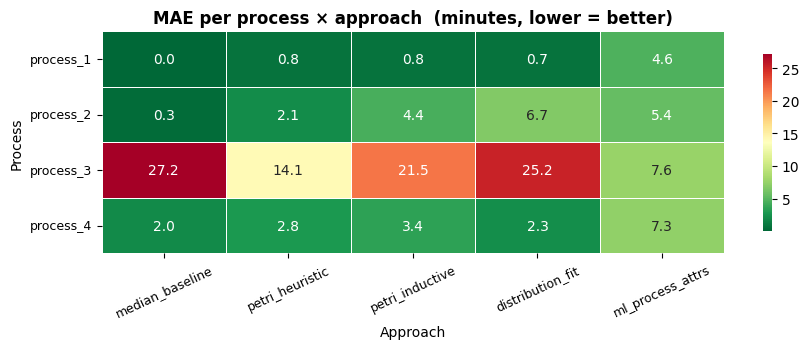

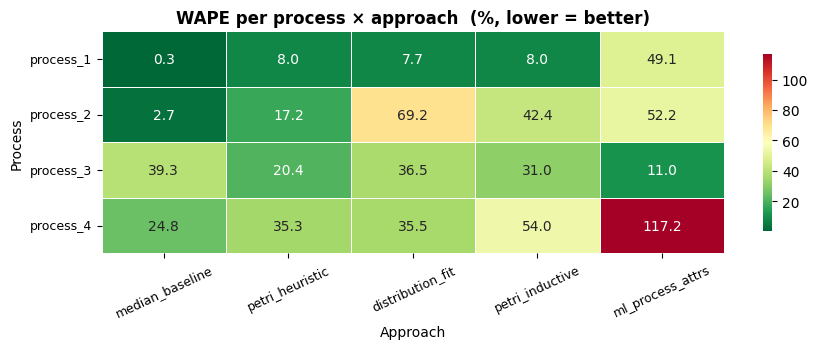

In [25]:
def metric_heatmap(metric, title, fmt='.1f', cmap='RdYlGn_r'):
    pivot = cross_df.pivot(index='process', columns='mode', values=metric)
    # order columns by median value (best to worst)
    col_order = pivot.median().sort_values().index.tolist()
    pivot = pivot[col_order].sort_index()

    fig, ax = plt.subplots(figsize=(max(8, len(col_order) * 1.8), max(3, len(pivot) * 0.9)))
    sns.heatmap(pivot, ax=ax, annot=True, fmt=fmt, cmap=cmap,
                linewidths=0.4, linecolor='white',
                annot_kws={'size': 10}, cbar_kws={'shrink': 0.8})
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.set_xlabel('Approach'); ax.set_ylabel('Process')
    ax.tick_params(axis='x', rotation=25, labelsize=9)
    ax.tick_params(axis='y', rotation=0,  labelsize=9)
    plt.tight_layout()
    plt.show()

metric_heatmap('mae',  'MAE per process × approach  (minutes, lower = better)')
metric_heatmap('wape', 'WAPE per process × approach  (%, lower = better)')

---
## Improvement strategies

Three things to try, run per-process so the heatmap is directly comparable to the baseline above:

| Strategy | What changes |
|---|---|
| **S1 · time features** | Add `hour_of_day` + `day_of_week` (already in `raw_df`) explicitly to XGBoost |
| **S2 · log target** | Train XGBoost on `log1p(duration)` and back-transform predictions |
| **S3 · hyperparameter tuning** | Set `optimize_hyperparams=True` in SimModeller |

In [26]:
from xgboost import XGBRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_absolute_error

# ── per-activity XGBoost helper (standalone, no SimModeller needed) ─────────

def build_feat_matrix(df, extra_cols=None):
    """Build feature matrix from raw_df-style dataframe."""
    use_cols = (
        [c for c in df.columns if c.startswith('attr_')]
        + [c for c in df.columns if c.startswith('prev_')]
        + (extra_cols or [])
    )
    use_cols = [c for c in use_cols if c in df.columns]
    X = df[use_cols].copy()
    for col in X.select_dtypes(include='object').columns:
        le = LabelEncoder()
        X[col] = le.fit_transform(X[col].astype(str))
    return X.fillna(0)


def xgb_per_activity(raw_df_train, raw_df_test, extra_cols=None, log_target=False):
    """
    Train one XGBRegressor per activity (train split) and predict on test split.
    Returns dict {activity: {'mae': float, 'n_test': int}}.
    """
    results = {}
    for act, grp_tr in raw_df_train.groupby('activity'):
        grp_te = raw_df_test[raw_df_test['activity'] == act]
        if len(grp_tr) < 5 or len(grp_te) == 0:
            continue
        X_tr = build_feat_matrix(grp_tr, extra_cols)
        X_te = build_feat_matrix(grp_te, extra_cols)
        # Align columns
        for c in X_tr.columns:
            if c not in X_te.columns: X_te[c] = 0
        X_te = X_te[X_tr.columns]
        y_tr = grp_tr['duration'].values
        y_te = grp_te['duration'].values
        if log_target:
            y_tr = np.log1p(y_tr)
        mdl = XGBRegressor(n_estimators=100, max_depth=4, learning_rate=0.1,
                           random_state=42, verbosity=0)
        mdl.fit(X_tr, y_tr)
        preds = mdl.predict(X_te)
        if log_target:
            preds = np.expm1(preds)
        results[act] = {'mae': float(mean_absolute_error(y_te, preds)), 'n_test': len(y_te)}
    return results


def run_strategy(strat_label, extra_cols=None, log_target=False, optimize_hp=False):
    """Run chosen strategy on all processes; return list of dicts."""
    rows = []
    for proc in PROCESSES_TO_RUN:
        try:
            df_tr, df_te, pp_te = load_and_split(proc)
            _, raw_heu, _ = extract_process(df_tr, mining_algorithm='heuristic',
                                            optimize_mining_hyperparams=False)

            # Build a test raw_df from df_te
            raw_te = raw_heu.copy()  # use training raw_df structure
            # For simplicity, re-extract test raw from df_te using same extractor
            _, raw_te_real, _ = extract_process(df_te, mining_algorithm='heuristic',
                                                optimize_mining_hyperparams=False)

            per_act = xgb_per_activity(raw_heu, raw_te_real,
                                       extra_cols=extra_cols, log_target=log_target)
            if not per_act:
                continue

            maes = [v['mae'] for v in per_act.values()]
            # Approximate WAPE: sum(|pred-real|)/sum(real) — we only have MAE per activity
            # Use simple mean as proxy
            rows.append({'process': proc, 'strategy': strat_label,
                         'mean_mae': float(np.mean(maes)),
                         'n_activities': len(maes)})
            print(f'  [{proc}] {strat_label}: mean MAE={np.mean(maes):.2f} min over {len(maes)} activities')
        except Exception as e:
            print(f'  [{proc}] {strat_label} FAILED: {e}')
    return rows


strat_results = []

print('── S0: baseline XGBoost (no extra features, raw target) ──')
strat_results += run_strategy('S0_baseline')

print('\n── S1: add time features (hour_of_day + day_of_week) ──')
strat_results += run_strategy('S1_time_feats', extra_cols=['hour_of_day', 'day_of_week'])

print('\n── S2: log-transform target ──')
strat_results += run_strategy('S2_log_target', log_target=True)

strat_df = pd.DataFrame(strat_results)

── S0: baseline XGBoost (no extra features, raw target) ──

Processing: sterilization_process (8 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 22 unique activities: ['water_supply_prepare' 'water_supply_working' 'destillation_heat'
 'bottling_prepare' 'bottling_working' 'bottling_cool'
 'autoclaving_1_prepare' 'autoclaving_1_heat' 'autoclaving_1_hold'
 'autoclaving_1_cool' 'packaging_prepare' 'packaging_working'
 'warehousing_prepare' 'warehousing_working' 'autoclaving_2_prepare'
 'autoclaving_2_heat' 'autoclaving_2_hold' 'autoclaving_2_cool'
 'autoclaving_3_prepare' 'autoclaving_3_heat' 'autoclaving_3_hold'
 'autoclaving_3_cool']


    water_supply_prepare: best fit = weibull_min (3.2580397428477172, 0.0, 0.11167301834301314)
    water_supply_working: best fit = weibull_min (3.25614757967511, 0.0, 1.3404131363271519)


    destillation_heat: best fit = weibull_min (3.2549303143058177, 0.0, 0.6704339890562847)
    bottling_prepare: best fit = weibull_min (3.2580397428477172, 0.0, 0.11167301834301314)


    bottling_working: best fit = weibull_min (3.2112863655797685, 0.0, 0.7480378987499562)
    bottling_cool: best fit = weibull_min (3.2580397428477172, 0.0, 0.11167301834301314)


    autoclaving_1_prepare: best fit = norm (2.00015260603097, 0.040883540124555584)
    autoclaving_1_heat: best fit = weibull_min (8.377254188417748, 0.0, 17.562068559154074)


    autoclaving_1_hold: best fit = weibull_min (7.147424260142181, 0.0, 13.592185048045966)
    autoclaving_1_cool: best fit = weibull_min (7.945215927002271, 0.0, 27.270542691372068)


    packaging_prepare: best fit = norm (3.9900811714285718, 1.9951219800828741)
    packaging_working: best fit = norm (3.992825818014786, 1.996179319360958)


    warehousing_prepare: best fit = norm (3.9960306670689283, 1.9981437856029447)
    warehousing_working: best fit = norm (3.9956765136442702, 1.996787322207397)


    autoclaving_2_prepare: best fit = lognorm (0.02018525711108521, 0.0, 2.0025290938285703)
    autoclaving_2_heat: best fit = weibull_min (8.508546008540861, 0.0, 17.579933704443384)


    autoclaving_2_hold: best fit = weibull_min (7.33824814908634, 0.0, 13.622483653695244)
    autoclaving_2_cool: best fit = weibull_min (8.124496633892939, 0.0, 27.326439458824247)


    autoclaving_3_prepare: best fit = norm (2.0008051032828282, 0.03956632746293716)
    autoclaving_3_heat: best fit = weibull_min (7.472998605224257, 0.0, 17.422830181648276)


    autoclaving_3_hold: best fit = weibull_min (6.386608478225549, 0.0, 13.481243779899398)
    autoclaving_3_cool: best fit = weibull_min (7.104419451464237, 0.0, 27.061328519688523)


    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.9800, fitness=1.0000, precision=1.0000, generalization=0.964261205983456, simplicity=0.9555555555555555
    Selected params: noise=0.2, heur={} (score=0.9800)
    Petri net: 21 places, 22 transitions, 44 arcs
    Stochastic map: 22 transition weights


    Decision-point weights: 20 decision points, 0 with __END__ probability
    Max case length in training: 14
      water_supply_prepare: Start=True, End=False, Transitions={'water_supply_working': 1.0}
      water_supply_working: Start=False, End=False, Transitions={'destillation_heat': 1.0}
      destillation_heat: Start=False, End=False, Transitions={'bottling_prepare': 1.0}
      bottling_prepare: Start=False, End=False, Transitions={'bottling_working': 1.0}
      bottling_working: Start=False, End=False, Transitions={'bottling_cool': 1.0}
      bottling_cool: Start=False, End=False, Transitions={'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
      autoclaving_1_prepare: Start=False, End=False, Transitions={'autoclaving_1_heat': 1.0}
      autoclaving_1_heat: Start=False, End=False, Transitions={'autoclaving_1_hold': 1.0}
      autoclaving_1_hold: Start=False, End=False, Transitions={'autoclavi

    History weights: 24 bigram keys, 22 activity-count keys

Processing: sterilization_process (8 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 22 unique activities: ['water_supply_prepare' 'water_supply_working' 'destillation_heat'
 'bottling_prepare' 'bottling_working' 'bottling_cool'
 'autoclaving_1_prepare' 'autoclaving_1_heat' 'autoclaving_1_hold'
 'autoclaving_1_cool' 'packaging_prepare' 'packaging_working'
 'warehousing_prepare' 'warehousing_working' 'autoclaving_2_prepare'
 'autoclaving_2_heat' 'autoclaving_2_hold' 'autoclaving_2_cool'
 'autoclaving_3_prepare' 'autoclaving_3_heat' 'autoclaving_3_hold'
 'autoclaving_3_cool']


    water_supply_prepare: best fit = weibull_min (3.2095543190567604, 0.0, 0.10954824681700295)
    water_supply_working: best fit = weibull_min (3.2044983410929597, 0.0, 1.3158872401510904)


    destillation_heat: best fit = weibull_min (3.2071509729979057, 0.0, 0.657246576379196)
    bottling_prepare: best fit = weibull_min (3.2095543190567604, 0.0, 0.10954824681700295)


    bottling_working: best fit = weibull_min (3.2025216523926945, 0.0, 0.7321657068164182)
    bottling_cool: best fit = weibull_min (3.2095543190567604, 0.0, 0.10954824681700295)


    autoclaving_1_prepare: best fit = norm (1.9974246308333332, 0.04256901656139197)
    autoclaving_1_heat: best fit = weibull_min (9.314129560150555, 0.0, 17.62598149394246)


    autoclaving_1_hold: best fit = weibull_min (7.947285433022936, 0.0, 13.663734915248277)
    autoclaving_1_cool: best fit = weibull_min (8.84608567424673, 0.0, 27.47685354666466)


    packaging_prepare: best fit = norm (4.090189515525114, 1.9288271417373186)
    packaging_working: best fit = norm (4.0884334652207, 1.9277287808109693)


    warehousing_prepare: best fit = norm (4.083199275088788, 1.92447672992171)
    warehousing_working: best fit = norm (4.078275140588534, 1.9222110680348543)


    autoclaving_2_prepare: best fit = lognorm (0.019034334463962205, 0.0, 2.0031958536767327)
    autoclaving_2_heat: best fit = weibull_min (9.337827363362981, 0.0, 17.630180848875646)


    autoclaving_2_hold: best fit = weibull_min (7.950898652665373, 0.0, 13.689174089091551)
    autoclaving_2_cool: best fit = weibull_min (8.795534722421404, 0.0, 27.398203588027314)


    autoclaving_3_prepare: best fit = lognorm (0.02070035877726955, 0.0, 2.0016758281903266)
    autoclaving_3_heat: best fit = weibull_min (8.158498541007164, 0.0, 17.554660513012564)


    autoclaving_3_hold: best fit = weibull_min (6.9266861459236, 0.0, 13.577864156954371)
    autoclaving_3_cool: best fit = weibull_min (7.67498624875043, 0.0, 27.192857869453327)


    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.9752, fitness=1.0000, precision=1.0000, generalization=0.9454080903909173, simplicity=0.9555555555555555
    Selected params: noise=0.2, heur={} (score=0.9752)
    Petri net: 21 places, 22 transitions, 44 arcs
    Stochastic map: 22 transition weights


    Decision-point weights: 20 decision points, 0 with __END__ probability
    Max case length in training: 14
      water_supply_prepare: Start=True, End=False, Transitions={'water_supply_working': 1.0}
      water_supply_working: Start=False, End=False, Transitions={'destillation_heat': 1.0}
      destillation_heat: Start=False, End=False, Transitions={'bottling_prepare': 1.0}
      bottling_prepare: Start=False, End=False, Transitions={'bottling_working': 1.0}
      bottling_working: Start=False, End=False, Transitions={'bottling_cool': 1.0}
      bottling_cool: Start=False, End=False, Transitions={'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
      autoclaving_1_prepare: Start=False, End=False, Transitions={'autoclaving_1_heat': 1.0}
      autoclaving_1_heat: Start=False, End=False, Transitions={'autoclaving_1_hold': 1.0}
      autoclaving_1_hold: Start=False, End=False, Transitions={'autoclavi

    History weights: 24 bigram keys, 22 activity-count keys


  [process_1] S0_baseline: mean MAE=0.16 min over 22 activities

Processing: l01 (1 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 12 unique activities: ['Grundstellung' 'Vorwärmen des Warmwasserkreislaufs' 'Warten auf Ziel'
 'Materialvalidierung' 'Leitung zum Vorheizer füllen'
 'Leitung zum HSM füllen' 'Produktion' 'Spülen mit Wasser' 'Nachlauf'
 'Spülen auf Gully' 'Fehler Tankanwahl Bestand' 'Warten auf Quelle']
    Grundstellung: best fit = weibull_min (0.5844550101446674, 0.0, 178.00974773019453)
    Vorwärmen des Warmwasserkreislaufs: best fit = lognorm (0.14887146877695792, 0.0, 0.6238080085643007)
    Warten auf Ziel: best fit = weibull_min (1.4034321161703613, 0.0, 62.3606538186368)
    Materialvalidierung: best fit = norm (0.12365591397849464, 0.16309474529158616)


    Leitung zum Vorheizer füllen: best fit = norm (3.1041666666666665, 0.5560327811412774)
    Leitung zum HSM füllen: best fit = norm (0.24652777777777776, 0.04487099994208363)
    Produktion: best fit = weibull_min (4.594773408029717, 0.0, 7.258764040095482)
    Spülen mit Wasser: best fit = norm (2.300724637681159, 0.1384418345981362)
    Nachlauf: best fit = norm (0.16569200779727097, 0.017998231298849306)
    Spülen auf Gully: best fit = lognorm (0.32989829289106276, 0.0, 0.48841459140854526)
    Fehler Tankanwahl Bestand: best fit = gamma (0.42830650319806, 0.0, 21.388221325881048)


    Warten auf Quelle: best fit = norm (14.083333333333334, 13.416666666666668)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.7649, fitness=0.9805, precision=0.8013, generalization=0.6776769662451543, simplicity=0.6000000000000001
    Selected params: noise=0.2, heur={} (score=0.7649)
    Petri net: 16 places, 29 transitions, 60 arcs
    Stochastic map: 29 transition weights
    Decision-point weights: 9 decision points, 4 with __END__ probability
    Max case length in training: 39
      Grundstellung: Start=True, End=True, Transitions={'Nachlauf': 0.038461538461538464, 'Vorwärmen des Warmwasserkreislaufs': 0.15384615384615385, 'Warten auf Ziel': 0.6538461538461539, '__END__': 0.15384615384615385}
      Vorwärmen des Warmwasserkreislaufs: Start=True, End=False, Transitions={'Warten auf Ziel': 1.0}
      Warten auf Ziel: Start=True, End=True, Transitions={'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
      Materialvalidierung: St

    History weights: 29 bigram keys, 52 activity-count keys

Processing: l01 (1 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 12 unique activities: ['Vorwärmen des Warmwasserkreislaufs' 'Warten auf Ziel'
 'Materialvalidierung' 'Leitung zum Vorheizer füllen'
 'Leitung zum HSM füllen' 'Produktion' 'Nachlauf' 'Warten auf Quelle'
 'Fehler Tankanwahl Bestand' 'Spülen mit Wasser' 'Spülen auf Gully'
 'Grundstellung']
    Vorwärmen des Warmwasserkreislaufs: best fit = weibull_min (10.152121781079211, 0.0, 0.70377753943952)
    Warten auf Ziel: best fit = gamma (2.4272933826794065, 0.0, 23.039684643453114)
    Materialvalidierung: best fit = weibull_min (3.4279756857128305, 0.0, 0.09981434279603085)
    Leitung zum Vorheizer füllen: best fit = lognorm (0.26410503943176383, 0.0, 3.215411674388279)
    Leitung zum HSM füllen: best fit = lognorm (0.2119309246683312, 0.0, 0.25909429329926875)


    Produktion: best fit = weibull_min (3.6445240191913806, 0.0, 6.837944055771187)
    Nachlauf: best fit = weibull_min (6.384015932531117, 0.0, 0.17945467996738265)
    Warten auf Quelle: best fit = norm (0.0, 0.0)
    Fehler Tankanwahl Bestand: best fit = weibull_min (0.7453648781949114, 0.0, 1.186688936775717)
    Spülen mit Wasser: best fit = lognorm (0.062356381064955266, 0.0, 2.34368343501792)
    Spülen auf Gully: best fit = lognorm (0.15442126879667104, 0.0, 0.4936093929324403)
    Grundstellung: best fit = lognorm (1.6637659448441722, 0.0, 51.579564621726554)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.7243, fitness=0.9914, precision=0.6484, generalization=0.6185173427928319, simplicity=0.638888888888889
    Selected params: noise=0.2, heur={} (score=0.7243)
    Petri net: 17 places, 29 transitions, 59 arcs
    Stochastic map: 29 transition weights
    Decision-point weights: 4 decision points, 3 with __END__ probability
    Max case length in training: 47
      Vorwärmen des Warmwasserkreislaufs: Start=True, End=False, Transitions={'Warten auf Ziel': 1.0}
      Warten auf Ziel: Start=False, End=True, Transitions={'Fehler Tankanwahl Bestand': 0.08791208791208792, 'Materialvalidierung': 0.7802197802197802, '__END__': 0.13186813186813187}
      Materialvalidierung: Start=True, End=False, Transitions={'Leitung zum Vorheizer füllen': 0.12345679012345678, 'Produktion': 0.7530864197530864, 'Warten auf Quelle': 0.12345679012345678}
      Leitung zum Vorheizer füllen: Start=False, End=False, Transitions={'Leitung zum HSM füllen': 1.0}
      Leitung zum HSM füllen: Star

  [process_2] S0_baseline: mean MAE=36.17 min over 12 activities

Processing: process (N/A objects, one whole-process net)
  Mining algorithm: heuristic
  Found 5 unique activities: ['Produktion' 'zurück speisen' 'Stabilisiert und angepasst'
 'Feed vorwärts' 'Fließbett starten für Produktion']


    Produktion: best fit = gamma (0.9539792562176747, 0.0, 336.38287000348686)
    zurück speisen: best fit = weibull_min (5.19387780255459, 0.0, 2.357054856891865)


    Stabilisiert und angepasst: best fit = weibull_min (4.196844036830021, 0.0, 1.1101507565707918)
    Feed vorwärts: best fit = weibull_min (1.0015158233114292, 0.0, 3.760252961152325)


    Fließbett starten für Produktion: best fit = gamma (1.5198200012403218, 0.0, 4.459592433476628)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.8884, fitness=0.9961, precision=0.9896, generalization=0.8708108732618294, simplicity=0.6969696969696969
    Selected params: noise=0.2, heur={} (score=0.8884)
    Petri net: 9 places, 14 transitions, 28 arcs
    Stochastic map: 14 transition weights
    Decision-point weights: 5 decision points, 3 with __END__ probability
    Max case length in training: 29
      Produktion: Start=True, End=True, Transitions={'Feed vorwärts': 0.0064, 'zurück speisen': 0.7872, '__END__': 0.2064}
      zurück speisen: Start=True, End=False, Transitions={'Feed vorwärts': 0.005952380952380952, 'Stabilisiert und angepasst': 0.9940476190476191}
      Stabilisiert und angepasst: Start=False, End=True, Transitions={'Feed vorwärts': 0.8183632734530938, '__END__': 0.18163672654690619}
      Feed vorwärts: Start=True, End=True, Transitions={'Fließbett starten für Produktion': 0.45579567779960706, 'Produktion': 0.5402750491159135, 'zurück speisen': 0.0019646365422396855, '__END__': 0.001964

    History weights: 14 bigram keys, 33 activity-count keys

Processing: process (N/A objects, one whole-process net)
  Mining algorithm: heuristic
  Found 5 unique activities: ['Feed vorwärts' 'Produktion' 'zurück speisen'
 'Stabilisiert und angepasst' 'Fließbett starten für Produktion']
    Feed vorwärts: best fit = weibull_min (3.4188056270050247, 0.0, 3.89447736489036)
    Produktion: best fit = weibull_min (1.0512751505121376, 0.0, 438.43118965483177)


    zurück speisen: best fit = gamma (2.0844790225021055, 0.0, 1.3730380275459695)
    Stabilisiert und angepasst: best fit = weibull_min (4.313275453936304, 0.0, 1.1026910128251224)
    Fließbett starten für Produktion: best fit = lognorm (0.5991746396568217, 0.0, 1.9063685859938733)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.8608, fitness=0.9953, precision=0.9826, generalization=0.7880990703630848, simplicity=0.6774193548387096
    Selected params: noise=0.2, heur={} (score=0.8608)
    Petri net: 8 places, 13 transitions, 26 arcs
    Stochastic map: 13 transition weights
    Decision-point weights: 3 decision points, 2 with __END__ probability
    Max case length in training: 21
      Feed vorwärts: Start=True, End=True, Transitions={'Fließbett starten für Produktion': 0.5436241610738255, 'Produktion': 0.44966442953020136, '__END__': 0.006711409395973154}
      Produktion: Start=True, End=True, Transitions={'Feed vorwärts': 0.014705882352941176, 'zurück speisen': 0.696078431372549, '__END__': 0.28921568627450983}
      zurück speisen: Start=False, End=True, Transitions={'Stabilisiert und angepasst': 0.993103448275862, '__END__': 0.006896551724137931}
      Stabilisiert und angepasst: Start=False, End=True, Transitions={'Feed vorwärts': 0.7638888888888888, '__END__': 0.236111111111111

  [process_3] S0_baseline: mean MAE=60.96 min over 5 activities

Processing: production (1 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 13 unique activities: ['Step-032 = Umlauf' 'Step-030 = Produktion' 'Step-035 = Ausschub Anlage'
 'Step-020 = Sterilwasserumlauf (über VLG)'
 'Step-024 = Sterilwasserumlauf, VLG Produktionsbereit'
 'Step-025 = Füllen Anlage' 'Step-046 = Anlage Abfahren'
 'Step-047 = Anlage Stop' 'Step-049 = CIP läuft'
 'Step-021 = Sterilwasserumlauf, Produkt vorziehen'
 'Step-022 = Sterilwasserumlauf, VLG entleeren'
 'Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt'
 'Step-033 = Produkttausch']
    Step-032 = Umlauf: best fit = lognorm (1.9375358911617888, 0.0, 1.384109217727019)


    Step-030 = Produktion: best fit = gamma (0.36997075995603296, 0.0, 41.26442035876102)
    Step-035 = Ausschub Anlage: best fit = weibull_min (5.503934052185797, 0.0, 18.23274708498551)


    Step-020 = Sterilwasserumlauf (über VLG): best fit = lognorm (1.0576544106495782, 0.0, 27.60500112276729)
    Step-024 = Sterilwasserumlauf, VLG Produktionsbereit: best fit = lognorm (1.4778435756328283, 0.0, 0.28409434598066974)
    Step-025 = Füllen Anlage: best fit = weibull_min (20.67583573387994, 0.0, 14.212921134769509)
    Step-046 = Anlage Abfahren: best fit = norm (2.158333333333333, 0.3749999999999999)
    Step-047 = Anlage Stop: best fit = norm (0.6666666666666666, 0.0)
    Step-049 = CIP läuft: best fit = norm (95.18333333333334, 8.350000000000001)
    Step-021 = Sterilwasserumlauf, Produkt vorziehen: best fit = gamma (0.9337920738144949, 0.0, 1.4133678188928955)
    Step-022 = Sterilwasserumlauf, VLG entleeren: best fit = weibull_min (13.265662196963644, 0.0, 0.8841077972801648)


    Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt: best fit = gamma (164.19005083184817, 0.0, 0.007680801027357329)
    Step-033 = Produkttausch: best fit = lognorm (0.8150782089677399, 0.0, 7.23823453498286)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.6974, fitness=0.9711, precision=0.6507, generalization=0.5721817244131235, simplicity=0.5957446808510639
    Selected params: noise=0.2, heur={} (score=0.6974)
    Petri net: 20 places, 36 transitions, 75 arcs
    Stochastic map: 36 transition weights


    Decision-point weights: 11 decision points, 7 with __END__ probability
    Max case length in training: 159
      Step-032 = Umlauf: Start=True, End=True, Transitions={'Step-030 = Produktion': 0.8907216494845361, 'Step-033 = Produkttausch': 0.01443298969072165, 'Step-035 = Ausschub Anlage': 0.05567010309278351, '__END__': 0.03917525773195876}
      Step-030 = Produktion: Start=True, End=True, Transitions={'Step-032 = Umlauf': 0.9751131221719457, 'Step-035 = Ausschub Anlage': 0.011312217194570135, '__END__': 0.013574660633484163}
      Step-035 = Ausschub Anlage: Start=True, End=True, Transitions={'Step-020 = Sterilwasserumlauf (über VLG)': 0.8421052631578947, '__END__': 0.15789473684210525}
      Step-020 = Sterilwasserumlauf (über VLG): Start=True, End=False, Transitions={'Step-021 = Sterilwasserumlauf, Produkt vorziehen': 0.8, 'Step-024 = Sterilwasserumlauf, VLG Produktionsbereit': 0.17142857142857143, 'Step-046 = Anlage Abfahren': 0.02857142857142857}
      Step-024 = Sterilwass

    History weights: 29 bigram keys, 198 activity-count keys

Processing: production (1 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 12 unique activities: ['Step-032 = Umlauf' 'Step-030 = Produktion' 'Step-035 = Ausschub Anlage'
 'Step-020 = Sterilwasserumlauf (über VLG)'
 'Step-024 = Sterilwasserumlauf, VLG Produktionsbereit'
 'Step-025 = Füllen Anlage' 'Step-033 = Produkttausch'
 'Step-022 = Sterilwasserumlauf, VLG entleeren'
 'Step-046 = Anlage Abfahren' 'Step-047 = Anlage Stop'
 'Step-021 = Sterilwasserumlauf, Produkt vorziehen'
 'Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt']
    Step-032 = Umlauf: best fit = gamma (0.5338658852704479, 0.0, 12.351902305798607)
    Step-030 = Produktion: best fit = gamma (0.39154462004309915, 0.0, 74.61081997975013)


    Step-035 = Ausschub Anlage: best fit = weibull_min (6.96296315017809, 0.0, 16.197852474288094)
    Step-020 = Sterilwasserumlauf (über VLG): best fit = gamma (1.0620312556279998, 0.0, 26.432576323398848)
    Step-024 = Sterilwasserumlauf, VLG Produktionsbereit: best fit = lognorm (1.1273611923699003, 0.0, 0.1312219940459278)
    Step-025 = Füllen Anlage: best fit = norm (12.399999999999997, 2.4073476235569222)
    Step-033 = Produkttausch: best fit = weibull_min (3.751279926759253, 0.0, 8.839043332474562)
    Step-022 = Sterilwasserumlauf, VLG entleeren: best fit = norm (0.7703703703703704, 0.19047986474998208)
    Step-046 = Anlage Abfahren: best fit = norm (2.225, 0.30833333333333324)
    Step-047 = Anlage Stop: best fit = norm (0.6666666666666666, 0.0)
    Step-021 = Sterilwasserumlauf, Produkt vorziehen: best fit = norm (1.192156862745098, 0.833923666336693)


    Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt: best fit = gamma (76.47302537483654, 0.0, 0.01660203499095538)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.6919, fitness=0.9714, precision=0.6223, generalization=0.5640587373345067, simplicity=0.6097560975609756
    Selected params: noise=0.2, heur={} (score=0.6919)
    Petri net: 19 places, 31 transitions, 66 arcs
    Stochastic map: 31 transition weights
    Decision-point weights: 8 decision points, 3 with __END__ probability
    Max case length in training: 75
      Step-032 = Umlauf: Start=True, End=True, Transitions={'Step-030 = Produktion': 0.8388888888888889, 'Step-033 = Produkttausch': 0.03333333333333333, 'Step-035 = Ausschub Anlage': 0.1111111111111111, '__END__': 0.016666666666666666}
      Step-030 = Produktion: Start=False, End=True, Transitions={'Step-032 = Umlauf': 0.943502824858757, 'Step-035 = Ausschub Anlage': 0.04519774011299435, '__END__': 0.011299435028248588}
      Step-035 = Ausschub Anlage: Start=True, End=True, Transitions={'Step-020 = Sterilwasserumlauf (über VLG)': 0.8823529411764706, '__END__': 0.11764705882352941}
      Step-020 = Sterilw

    History weights: 26 bigram keys, 93 activity-count keys


  [process_4] S0_baseline: mean MAE=8.91 min over 10 activities

── S1: add time features (hour_of_day + day_of_week) ──

Processing: sterilization_process (8 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 22 unique activities: ['water_supply_prepare' 'water_supply_working' 'destillation_heat'
 'bottling_prepare' 'bottling_working' 'bottling_cool'
 'autoclaving_1_prepare' 'autoclaving_1_heat' 'autoclaving_1_hold'
 'autoclaving_1_cool' 'packaging_prepare' 'packaging_working'
 'warehousing_prepare' 'warehousing_working' 'autoclaving_2_prepare'
 'autoclaving_2_heat' 'autoclaving_2_hold' 'autoclaving_2_cool'
 'autoclaving_3_prepare' 'autoclaving_3_heat' 'autoclaving_3_hold'
 'autoclaving_3_cool']


    water_supply_prepare: best fit = weibull_min (3.2580397428477172, 0.0, 0.11167301834301314)
    water_supply_working: best fit = weibull_min (3.25614757967511, 0.0, 1.3404131363271519)


    destillation_heat: best fit = weibull_min (3.2549303143058177, 0.0, 0.6704339890562847)
    bottling_prepare: best fit = weibull_min (3.2580397428477172, 0.0, 0.11167301834301314)


    bottling_working: best fit = weibull_min (3.2112863655797685, 0.0, 0.7480378987499562)
    bottling_cool: best fit = weibull_min (3.2580397428477172, 0.0, 0.11167301834301314)


    autoclaving_1_prepare: best fit = norm (2.00015260603097, 0.040883540124555584)
    autoclaving_1_heat: best fit = weibull_min (8.377254188417748, 0.0, 17.562068559154074)


    autoclaving_1_hold: best fit = weibull_min (7.147424260142181, 0.0, 13.592185048045966)
    autoclaving_1_cool: best fit = weibull_min (7.945215927002271, 0.0, 27.270542691372068)


    packaging_prepare: best fit = norm (3.9900811714285718, 1.9951219800828741)


    packaging_working: best fit = norm (3.992825818014786, 1.996179319360958)
    warehousing_prepare: best fit = norm (3.9960306670689283, 1.9981437856029447)


    warehousing_working: best fit = norm (3.9956765136442702, 1.996787322207397)
    autoclaving_2_prepare: best fit = lognorm (0.02018525711108521, 0.0, 2.0025290938285703)


    autoclaving_2_heat: best fit = weibull_min (8.508546008540861, 0.0, 17.579933704443384)
    autoclaving_2_hold: best fit = weibull_min (7.33824814908634, 0.0, 13.622483653695244)


    autoclaving_2_cool: best fit = weibull_min (8.124496633892939, 0.0, 27.326439458824247)
    autoclaving_3_prepare: best fit = norm (2.0008051032828282, 0.03956632746293716)


    autoclaving_3_heat: best fit = weibull_min (7.472998605224257, 0.0, 17.422830181648276)


    autoclaving_3_hold: best fit = weibull_min (6.386608478225549, 0.0, 13.481243779899398)
    autoclaving_3_cool: best fit = weibull_min (7.104419451464237, 0.0, 27.061328519688523)


    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.9800, fitness=1.0000, precision=1.0000, generalization=0.964261205983456, simplicity=0.9555555555555555
    Selected params: noise=0.2, heur={} (score=0.9800)
    Petri net: 21 places, 22 transitions, 44 arcs
    Stochastic map: 22 transition weights


    Decision-point weights: 20 decision points, 0 with __END__ probability
    Max case length in training: 14
      water_supply_prepare: Start=True, End=False, Transitions={'water_supply_working': 1.0}
      water_supply_working: Start=False, End=False, Transitions={'destillation_heat': 1.0}
      destillation_heat: Start=False, End=False, Transitions={'bottling_prepare': 1.0}
      bottling_prepare: Start=False, End=False, Transitions={'bottling_working': 1.0}
      bottling_working: Start=False, End=False, Transitions={'bottling_cool': 1.0}
      bottling_cool: Start=False, End=False, Transitions={'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
      autoclaving_1_prepare: Start=False, End=False, Transitions={'autoclaving_1_heat': 1.0}
      autoclaving_1_heat: Start=False, End=False, Transitions={'autoclaving_1_hold': 1.0}
      autoclaving_1_hold: Start=False, End=False, Transitions={'autoclavi

    History weights: 24 bigram keys, 22 activity-count keys

Processing: sterilization_process (8 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 22 unique activities: ['water_supply_prepare' 'water_supply_working' 'destillation_heat'
 'bottling_prepare' 'bottling_working' 'bottling_cool'
 'autoclaving_1_prepare' 'autoclaving_1_heat' 'autoclaving_1_hold'
 'autoclaving_1_cool' 'packaging_prepare' 'packaging_working'
 'warehousing_prepare' 'warehousing_working' 'autoclaving_2_prepare'
 'autoclaving_2_heat' 'autoclaving_2_hold' 'autoclaving_2_cool'
 'autoclaving_3_prepare' 'autoclaving_3_heat' 'autoclaving_3_hold'
 'autoclaving_3_cool']


    water_supply_prepare: best fit = weibull_min (3.2095543190567604, 0.0, 0.10954824681700295)
    water_supply_working: best fit = weibull_min (3.2044983410929597, 0.0, 1.3158872401510904)


    destillation_heat: best fit = weibull_min (3.2071509729979057, 0.0, 0.657246576379196)
    bottling_prepare: best fit = weibull_min (3.2095543190567604, 0.0, 0.10954824681700295)


    bottling_working: best fit = weibull_min (3.2025216523926945, 0.0, 0.7321657068164182)
    bottling_cool: best fit = weibull_min (3.2095543190567604, 0.0, 0.10954824681700295)


    autoclaving_1_prepare: best fit = norm (1.9974246308333332, 0.04256901656139197)
    autoclaving_1_heat: best fit = weibull_min (9.314129560150555, 0.0, 17.62598149394246)


    autoclaving_1_hold: best fit = weibull_min (7.947285433022936, 0.0, 13.663734915248277)
    autoclaving_1_cool: best fit = weibull_min (8.84608567424673, 0.0, 27.47685354666466)


    packaging_prepare: best fit = norm (4.090189515525114, 1.9288271417373186)
    packaging_working: best fit = norm (4.0884334652207, 1.9277287808109693)


    warehousing_prepare: best fit = norm (4.083199275088788, 1.92447672992171)
    warehousing_working: best fit = norm (4.078275140588534, 1.9222110680348543)


    autoclaving_2_prepare: best fit = lognorm (0.019034334463962205, 0.0, 2.0031958536767327)
    autoclaving_2_heat: best fit = weibull_min (9.337827363362981, 0.0, 17.630180848875646)


    autoclaving_2_hold: best fit = weibull_min (7.950898652665373, 0.0, 13.689174089091551)
    autoclaving_2_cool: best fit = weibull_min (8.795534722421404, 0.0, 27.398203588027314)


    autoclaving_3_prepare: best fit = lognorm (0.02070035877726955, 0.0, 2.0016758281903266)
    autoclaving_3_heat: best fit = weibull_min (8.158498541007164, 0.0, 17.554660513012564)


    autoclaving_3_hold: best fit = weibull_min (6.9266861459236, 0.0, 13.577864156954371)
    autoclaving_3_cool: best fit = weibull_min (7.67498624875043, 0.0, 27.192857869453327)


    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.9752, fitness=1.0000, precision=1.0000, generalization=0.9454080903909173, simplicity=0.9555555555555555
    Selected params: noise=0.2, heur={} (score=0.9752)
    Petri net: 21 places, 22 transitions, 44 arcs
    Stochastic map: 22 transition weights


    Decision-point weights: 20 decision points, 0 with __END__ probability
    Max case length in training: 14
      water_supply_prepare: Start=True, End=False, Transitions={'water_supply_working': 1.0}
      water_supply_working: Start=False, End=False, Transitions={'destillation_heat': 1.0}
      destillation_heat: Start=False, End=False, Transitions={'bottling_prepare': 1.0}
      bottling_prepare: Start=False, End=False, Transitions={'bottling_working': 1.0}
      bottling_working: Start=False, End=False, Transitions={'bottling_cool': 1.0}
      bottling_cool: Start=False, End=False, Transitions={'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
      autoclaving_1_prepare: Start=False, End=False, Transitions={'autoclaving_1_heat': 1.0}
      autoclaving_1_heat: Start=False, End=False, Transitions={'autoclaving_1_hold': 1.0}
      autoclaving_1_hold: Start=False, End=False, Transitions={'autoclavi

    History weights: 24 bigram keys, 22 activity-count keys


  [process_1] S1_time_feats: mean MAE=0.16 min over 22 activities

Processing: l01 (1 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 12 unique activities: ['Grundstellung' 'Vorwärmen des Warmwasserkreislaufs' 'Warten auf Ziel'
 'Materialvalidierung' 'Leitung zum Vorheizer füllen'
 'Leitung zum HSM füllen' 'Produktion' 'Spülen mit Wasser' 'Nachlauf'
 'Spülen auf Gully' 'Fehler Tankanwahl Bestand' 'Warten auf Quelle']
    Grundstellung: best fit = weibull_min (0.5844550101446674, 0.0, 178.00974773019453)
    Vorwärmen des Warmwasserkreislaufs: best fit = lognorm (0.14887146877695792, 0.0, 0.6238080085643007)
    Warten auf Ziel: best fit = weibull_min (1.4034321161703613, 0.0, 62.3606538186368)


    Materialvalidierung: best fit = norm (0.12365591397849464, 0.16309474529158616)
    Leitung zum Vorheizer füllen: best fit = norm (3.1041666666666665, 0.5560327811412774)
    Leitung zum HSM füllen: best fit = norm (0.24652777777777776, 0.04487099994208363)
    Produktion: best fit = weibull_min (4.594773408029717, 0.0, 7.258764040095482)
    Spülen mit Wasser: best fit = norm (2.300724637681159, 0.1384418345981362)


    Nachlauf: best fit = norm (0.16569200779727097, 0.017998231298849306)
    Spülen auf Gully: best fit = lognorm (0.32989829289106276, 0.0, 0.48841459140854526)
    Fehler Tankanwahl Bestand: best fit = gamma (0.42830650319806, 0.0, 21.388221325881048)
    Warten auf Quelle: best fit = norm (14.083333333333334, 13.416666666666668)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.7649, fitness=0.9805, precision=0.8013, generalization=0.6776769662451543, simplicity=0.6000000000000001
    Selected params: noise=0.2, heur={} (score=0.7649)
    Petri net: 16 places, 29 transitions, 60 arcs
    Stochastic map: 29 transition weights
    Decision-point weights: 1 decision points, 1 with __END__ probability
    Max case length in training: 39
      Grundstellung: Start=True, End=True, Transitions={'Nachlauf': 0.038461538461538464, 'Vorwärmen des Warmwasserkreislaufs': 0.15384615384615385, 'Warten auf Ziel': 0.6538461538461539, '__END__': 0.15384615384615385}
      Vorwärmen des Warmwasserkreislaufs: Start=True, End=False, Transitions={'Warten auf Ziel': 1.0}
      Warten auf Ziel: Start=True, End=True, Transitions={'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
      Materialvalidierung: St

    Vorwärmen des Warmwasserkreislaufs: best fit = weibull_min (10.152121781079211, 0.0, 0.70377753943952)
    Warten auf Ziel: best fit = gamma (2.4272933826794065, 0.0, 23.039684643453114)
    Materialvalidierung: best fit = weibull_min (3.4279756857128305, 0.0, 0.09981434279603085)
    Leitung zum Vorheizer füllen: best fit = lognorm (0.26410503943176383, 0.0, 3.215411674388279)
    Leitung zum HSM füllen: best fit = lognorm (0.2119309246683312, 0.0, 0.25909429329926875)
    Produktion: best fit = weibull_min (3.6445240191913806, 0.0, 6.837944055771187)
    Nachlauf: best fit = weibull_min (6.384015932531117, 0.0, 0.17945467996738265)
    Warten auf Quelle: best fit = norm (0.0, 0.0)
    Fehler Tankanwahl Bestand: best fit = weibull_min (0.7453648781949114, 0.0, 1.186688936775717)


    Spülen mit Wasser: best fit = lognorm (0.062356381064955266, 0.0, 2.34368343501792)
    Spülen auf Gully: best fit = lognorm (0.15442126879667104, 0.0, 0.4936093929324403)
    Grundstellung: best fit = lognorm (1.6637659448441722, 0.0, 51.579564621726554)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.7243, fitness=0.9914, precision=0.6484, generalization=0.6185173427928319, simplicity=0.638888888888889
    Selected params: noise=0.2, heur={} (score=0.7243)
    Petri net: 17 places, 29 transitions, 59 arcs
    Stochastic map: 29 transition weights
    Decision-point weights: 8 decision points, 0 with __END__ probability
    Max case length in training: 47
      Vorwärmen des Warmwasserkreislaufs: Start=True, End=False, Transitions={'Warten auf Ziel': 1.0}
      Warten auf Ziel: Start=False, End=True, Transitions={'Fehler Tankanwahl Bestand': 0.08791208791208792, 'Materialvalidierung': 0.7802197802197802, '__END__': 0.13186813186813187}
      Materialvalidierung: Start=True, End=False, Transitions={'Leitung zum Vorheizer füllen': 0.12345679012345678, 'Produktion': 0.7530864197530864, 'Warten auf Quelle': 0.12345679012345678}
      Leitung zum Vorheizer füllen: Start=False, End=False, Transitions={'Leitung zum HSM füllen': 1.0}
      Leitung zum HSM füllen: Star

  [process_2] S1_time_feats: mean MAE=28.60 min over 12 activities

Processing: process (N/A objects, one whole-process net)
  Mining algorithm: heuristic
  Found 5 unique activities: ['Produktion' 'zurück speisen' 'Stabilisiert und angepasst'
 'Feed vorwärts' 'Fließbett starten für Produktion']
    Produktion: best fit = gamma (0.9539792562176747, 0.0, 336.38287000348686)


    zurück speisen: best fit = weibull_min (5.19387780255459, 0.0, 2.357054856891865)
    Stabilisiert und angepasst: best fit = weibull_min (4.196844036830021, 0.0, 1.1101507565707918)


    Feed vorwärts: best fit = weibull_min (1.0015158233114292, 0.0, 3.760252961152325)
    Fließbett starten für Produktion: best fit = gamma (1.5198200012403218, 0.0, 4.459592433476628)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.8884, fitness=0.9961, precision=0.9896, generalization=0.8708108732618294, simplicity=0.6969696969696969
    Selected params: noise=0.2, heur={} (score=0.8884)
    Petri net: 9 places, 14 transitions, 28 arcs
    Stochastic map: 14 transition weights
    Decision-point weights: 5 decision points, 3 with __END__ probability
    Max case length in training: 29
      Produktion: Start=True, End=True, Transitions={'Feed vorwärts': 0.0064, 'zurück speisen': 0.7872, '__END__': 0.2064}
      zurück speisen: Start=True, End=False, Transitions={'Feed vorwärts': 0.005952380952380952, 'Stabilisiert und angepasst': 0.9940476190476191}
      Stabilisiert und angepasst: Start=False, End=True, Transitions={'Feed vorwärts': 0.8183632734530938, '__END__': 0.18163672654690619}
      Feed vorwärts: Start=True, End=True, Transitions={'Fließbett starten für Produktion': 0.45579567779960706, 'Produktion': 0.5402750491159135, 'zurück speisen': 0.0019646365422396855, '__END__': 0.001964

    History weights: 14 bigram keys, 33 activity-count keys

Processing: process (N/A objects, one whole-process net)
  Mining algorithm: heuristic
  Found 5 unique activities: ['Feed vorwärts' 'Produktion' 'zurück speisen'
 'Stabilisiert und angepasst' 'Fließbett starten für Produktion']
    Feed vorwärts: best fit = weibull_min (3.4188056270050247, 0.0, 3.89447736489036)
    Produktion: best fit = weibull_min (1.0512751505121376, 0.0, 438.43118965483177)


    zurück speisen: best fit = gamma (2.0844790225021055, 0.0, 1.3730380275459695)
    Stabilisiert und angepasst: best fit = weibull_min (4.313275453936304, 0.0, 1.1026910128251224)
    Fließbett starten für Produktion: best fit = lognorm (0.5991746396568217, 0.0, 1.9063685859938733)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.8608, fitness=0.9953, precision=0.9826, generalization=0.7880990703630848, simplicity=0.6774193548387096
    Selected params: noise=0.2, heur={} (score=0.8608)
    Petri net: 8 places, 13 transitions, 26 arcs
    Stochastic map: 13 transition weights
    Decision-point weights: 5 decision points, 4 with __END__ probability
    Max case length in training: 21
      Feed vorwärts: Start=True, End=True, Transitions={'Fließbett starten für Produktion': 0.5436241610738255, 'Produktion': 0.44966442953020136, '__END__': 0.006711409395973154}
      Produktion: Start=True, End=True, Transitions={'Feed vorwärts': 0.014705882352941176, 'zurück speisen': 0.696078431372549, '__END__': 0.28921568627450983}
      zurück speisen: Start=False, End=True, Transitions={'Stabilisiert und angepasst': 0.993103448275862, '__END__': 0.006896551724137931}
      Stabilisiert und angepasst: Start=False, End=True, Transitions={'Feed vorwärts': 0.7638888888888888, '__END__': 0.236111111111111

  [process_3] S1_time_feats: mean MAE=55.47 min over 5 activities

Processing: production (1 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 13 unique activities: ['Step-032 = Umlauf' 'Step-030 = Produktion' 'Step-035 = Ausschub Anlage'
 'Step-020 = Sterilwasserumlauf (über VLG)'
 'Step-024 = Sterilwasserumlauf, VLG Produktionsbereit'
 'Step-025 = Füllen Anlage' 'Step-046 = Anlage Abfahren'
 'Step-047 = Anlage Stop' 'Step-049 = CIP läuft'
 'Step-021 = Sterilwasserumlauf, Produkt vorziehen'
 'Step-022 = Sterilwasserumlauf, VLG entleeren'
 'Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt'
 'Step-033 = Produkttausch']
    Step-032 = Umlauf: best fit = lognorm (1.9375358911617888, 0.0, 1.384109217727019)
    Step-030 = Produktion: best fit = gamma (0.36997075995603296, 0.0, 41.26442035876102)


    Step-035 = Ausschub Anlage: best fit = weibull_min (5.503934052185797, 0.0, 18.23274708498551)
    Step-020 = Sterilwasserumlauf (über VLG): best fit = lognorm (1.0576544106495782, 0.0, 27.60500112276729)
    Step-024 = Sterilwasserumlauf, VLG Produktionsbereit: best fit = lognorm (1.4778435756328283, 0.0, 0.28409434598066974)
    Step-025 = Füllen Anlage: best fit = weibull_min (20.67583573387994, 0.0, 14.212921134769509)
    Step-046 = Anlage Abfahren: best fit = norm (2.158333333333333, 0.3749999999999999)
    Step-047 = Anlage Stop: best fit = norm (0.6666666666666666, 0.0)
    Step-049 = CIP läuft: best fit = norm (95.18333333333334, 8.350000000000001)
    Step-021 = Sterilwasserumlauf, Produkt vorziehen: best fit = gamma (0.9337920738144949, 0.0, 1.4133678188928955)
    Step-022 = Sterilwasserumlauf, VLG entleeren: best fit = weibull_min (13.265662196963644, 0.0, 0.8841077972801648)
    Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt: best fit = gamma (164.1900508318481

    Step-033 = Produkttausch: best fit = lognorm (0.8150782089677399, 0.0, 7.23823453498286)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.6974, fitness=0.9711, precision=0.6507, generalization=0.5721817244131235, simplicity=0.5957446808510639
    Selected params: noise=0.2, heur={} (score=0.6974)
    Petri net: 20 places, 36 transitions, 75 arcs
    Stochastic map: 36 transition weights
    Decision-point weights: 4 decision points, 3 with __END__ probability
    Max case length in training: 159
      Step-032 = Umlauf: Start=True, End=True, Transitions={'Step-030 = Produktion': 0.8907216494845361, 'Step-033 = Produkttausch': 0.01443298969072165, 'Step-035 = Ausschub Anlage': 0.05567010309278351, '__END__': 0.03917525773195876}
      Step-030 = Produktion: Start=True, End=True, Transitions={'Step-032 = Umlauf': 0.9751131221719457, 'Step-035 = Ausschub Anlage': 0.011312217194570135, '__END__': 0.013574660633484163}
      Step-035 = Ausschub Anlage: Start=True, End=True, Transitions={'Step-020 = Sterilwasserumlauf (über VLG)': 0.8421052631578947, '__END__': 0.15789473684210525}
      Step-020 = Steri

    History weights: 29 bigram keys, 198 activity-count keys

Processing: production (1 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 12 unique activities: ['Step-032 = Umlauf' 'Step-030 = Produktion' 'Step-035 = Ausschub Anlage'
 'Step-020 = Sterilwasserumlauf (über VLG)'
 'Step-024 = Sterilwasserumlauf, VLG Produktionsbereit'
 'Step-025 = Füllen Anlage' 'Step-033 = Produkttausch'
 'Step-022 = Sterilwasserumlauf, VLG entleeren'
 'Step-046 = Anlage Abfahren' 'Step-047 = Anlage Stop'
 'Step-021 = Sterilwasserumlauf, Produkt vorziehen'
 'Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt']
    Step-032 = Umlauf: best fit = gamma (0.5338658852704479, 0.0, 12.351902305798607)
    Step-030 = Produktion: best fit = gamma (0.39154462004309915, 0.0, 74.61081997975013)
    Step-035 = Ausschub Anlage: best fit = weibull_min (6.96296315017809, 0.0, 16.197852474288094)
    Step-020 = Sterilwasserumlauf (über VLG): best fit = gamma (1.0620312556279998, 0.0, 26.43257632339

    Step-024 = Sterilwasserumlauf, VLG Produktionsbereit: best fit = lognorm (1.1273611923699003, 0.0, 0.1312219940459278)
    Step-025 = Füllen Anlage: best fit = norm (12.399999999999997, 2.4073476235569222)
    Step-033 = Produkttausch: best fit = weibull_min (3.751279926759253, 0.0, 8.839043332474562)
    Step-022 = Sterilwasserumlauf, VLG entleeren: best fit = norm (0.7703703703703704, 0.19047986474998208)
    Step-046 = Anlage Abfahren: best fit = norm (2.225, 0.30833333333333324)
    Step-047 = Anlage Stop: best fit = norm (0.6666666666666666, 0.0)
    Step-021 = Sterilwasserumlauf, Produkt vorziehen: best fit = norm (1.192156862745098, 0.833923666336693)
    Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt: best fit = gamma (76.47302537483654, 0.0, 0.01660203499095538)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.6919, fitness=0.9714, precision=0.6223, generalization=0.5640587373345067, simplicity=0.6097560975609756
    Selected params: noise=0.2, heur={} (score=0.6919)
    Petri net: 19 places, 31 transitions, 66 arcs
    Stochastic map: 31 transition weights
    Decision-point weights: 2 decision points, 1 with __END__ probability
    Max case length in training: 75
      Step-032 = Umlauf: Start=True, End=True, Transitions={'Step-030 = Produktion': 0.8388888888888889, 'Step-033 = Produkttausch': 0.03333333333333333, 'Step-035 = Ausschub Anlage': 0.1111111111111111, '__END__': 0.016666666666666666}
      Step-030 = Produktion: Start=False, End=True, Transitions={'Step-032 = Umlauf': 0.943502824858757, 'Step-035 = Ausschub Anlage': 0.04519774011299435, '__END__': 0.011299435028248588}
      Step-035 = Ausschub Anlage: Start=True, End=True, Transitions={'Step-020 = Sterilwasserumlauf (über VLG)': 0.8823529411764706, '__END__': 0.11764705882352941}
      Step-020 = Sterilw

  [process_4] S1_time_feats: mean MAE=9.95 min over 10 activities

── S2: log-transform target ──

Processing: sterilization_process (8 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 22 unique activities: ['water_supply_prepare' 'water_supply_working' 'destillation_heat'
 'bottling_prepare' 'bottling_working' 'bottling_cool'
 'autoclaving_1_prepare' 'autoclaving_1_heat' 'autoclaving_1_hold'
 'autoclaving_1_cool' 'packaging_prepare' 'packaging_working'
 'warehousing_prepare' 'warehousing_working' 'autoclaving_2_prepare'
 'autoclaving_2_heat' 'autoclaving_2_hold' 'autoclaving_2_cool'
 'autoclaving_3_prepare' 'autoclaving_3_heat' 'autoclaving_3_hold'
 'autoclaving_3_cool']


    water_supply_prepare: best fit = weibull_min (3.2580397428477172, 0.0, 0.11167301834301314)
    water_supply_working: best fit = weibull_min (3.25614757967511, 0.0, 1.3404131363271519)


    destillation_heat: best fit = weibull_min (3.2549303143058177, 0.0, 0.6704339890562847)
    bottling_prepare: best fit = weibull_min (3.2580397428477172, 0.0, 0.11167301834301314)


    bottling_working: best fit = weibull_min (3.2112863655797685, 0.0, 0.7480378987499562)
    bottling_cool: best fit = weibull_min (3.2580397428477172, 0.0, 0.11167301834301314)


    autoclaving_1_prepare: best fit = norm (2.00015260603097, 0.040883540124555584)
    autoclaving_1_heat: best fit = weibull_min (8.377254188417748, 0.0, 17.562068559154074)


    autoclaving_1_hold: best fit = weibull_min (7.147424260142181, 0.0, 13.592185048045966)
    autoclaving_1_cool: best fit = weibull_min (7.945215927002271, 0.0, 27.270542691372068)


    packaging_prepare: best fit = norm (3.9900811714285718, 1.9951219800828741)
    packaging_working: best fit = norm (3.992825818014786, 1.996179319360958)


    warehousing_prepare: best fit = norm (3.9960306670689283, 1.9981437856029447)
    warehousing_working: best fit = norm (3.9956765136442702, 1.996787322207397)


    autoclaving_2_prepare: best fit = lognorm (0.02018525711108521, 0.0, 2.0025290938285703)
    autoclaving_2_heat: best fit = weibull_min (8.508546008540861, 0.0, 17.579933704443384)


    autoclaving_2_hold: best fit = weibull_min (7.33824814908634, 0.0, 13.622483653695244)
    autoclaving_2_cool: best fit = weibull_min (8.124496633892939, 0.0, 27.326439458824247)


    autoclaving_3_prepare: best fit = norm (2.0008051032828282, 0.03956632746293716)
    autoclaving_3_heat: best fit = weibull_min (7.472998605224257, 0.0, 17.422830181648276)


    autoclaving_3_hold: best fit = weibull_min (6.386608478225549, 0.0, 13.481243779899398)
    autoclaving_3_cool: best fit = weibull_min (7.104419451464237, 0.0, 27.061328519688523)


    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.9800, fitness=1.0000, precision=1.0000, generalization=0.964261205983456, simplicity=0.9555555555555555
    Selected params: noise=0.2, heur={} (score=0.9800)
    Petri net: 21 places, 22 transitions, 44 arcs
    Stochastic map: 22 transition weights


    Decision-point weights: 20 decision points, 0 with __END__ probability
    Max case length in training: 14
      water_supply_prepare: Start=True, End=False, Transitions={'water_supply_working': 1.0}
      water_supply_working: Start=False, End=False, Transitions={'destillation_heat': 1.0}
      destillation_heat: Start=False, End=False, Transitions={'bottling_prepare': 1.0}
      bottling_prepare: Start=False, End=False, Transitions={'bottling_working': 1.0}
      bottling_working: Start=False, End=False, Transitions={'bottling_cool': 1.0}
      bottling_cool: Start=False, End=False, Transitions={'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
      autoclaving_1_prepare: Start=False, End=False, Transitions={'autoclaving_1_heat': 1.0}
      autoclaving_1_heat: Start=False, End=False, Transitions={'autoclaving_1_hold': 1.0}
      autoclaving_1_hold: Start=False, End=False, Transitions={'autoclavi

    History weights: 24 bigram keys, 22 activity-count keys

Processing: sterilization_process (8 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 22 unique activities: ['water_supply_prepare' 'water_supply_working' 'destillation_heat'
 'bottling_prepare' 'bottling_working' 'bottling_cool'
 'autoclaving_1_prepare' 'autoclaving_1_heat' 'autoclaving_1_hold'
 'autoclaving_1_cool' 'packaging_prepare' 'packaging_working'
 'warehousing_prepare' 'warehousing_working' 'autoclaving_2_prepare'
 'autoclaving_2_heat' 'autoclaving_2_hold' 'autoclaving_2_cool'
 'autoclaving_3_prepare' 'autoclaving_3_heat' 'autoclaving_3_hold'
 'autoclaving_3_cool']


    water_supply_prepare: best fit = weibull_min (3.2095543190567604, 0.0, 0.10954824681700295)
    water_supply_working: best fit = weibull_min (3.2044983410929597, 0.0, 1.3158872401510904)


    destillation_heat: best fit = weibull_min (3.2071509729979057, 0.0, 0.657246576379196)
    bottling_prepare: best fit = weibull_min (3.2095543190567604, 0.0, 0.10954824681700295)


    bottling_working: best fit = weibull_min (3.2025216523926945, 0.0, 0.7321657068164182)
    bottling_cool: best fit = weibull_min (3.2095543190567604, 0.0, 0.10954824681700295)


    autoclaving_1_prepare: best fit = norm (1.9974246308333332, 0.04256901656139197)
    autoclaving_1_heat: best fit = weibull_min (9.314129560150555, 0.0, 17.62598149394246)


    autoclaving_1_hold: best fit = weibull_min (7.947285433022936, 0.0, 13.663734915248277)
    autoclaving_1_cool: best fit = weibull_min (8.84608567424673, 0.0, 27.47685354666466)


    packaging_prepare: best fit = norm (4.090189515525114, 1.9288271417373186)
    packaging_working: best fit = norm (4.0884334652207, 1.9277287808109693)


    warehousing_prepare: best fit = norm (4.083199275088788, 1.92447672992171)
    warehousing_working: best fit = norm (4.078275140588534, 1.9222110680348543)


    autoclaving_2_prepare: best fit = lognorm (0.019034334463962205, 0.0, 2.0031958536767327)
    autoclaving_2_heat: best fit = weibull_min (9.337827363362981, 0.0, 17.630180848875646)


    autoclaving_2_hold: best fit = weibull_min (7.950898652665373, 0.0, 13.689174089091551)
    autoclaving_2_cool: best fit = weibull_min (8.795534722421404, 0.0, 27.398203588027314)


    autoclaving_3_prepare: best fit = lognorm (0.02070035877726955, 0.0, 2.0016758281903266)
    autoclaving_3_heat: best fit = weibull_min (8.158498541007164, 0.0, 17.554660513012564)
    autoclaving_3_hold: best fit = weibull_min (6.9266861459236, 0.0, 13.577864156954371)


    autoclaving_3_cool: best fit = weibull_min (7.67498624875043, 0.0, 27.192857869453327)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.9752, fitness=1.0000, precision=1.0000, generalization=0.9454080903909173, simplicity=0.9555555555555555
    Selected params: noise=0.2, heur={} (score=0.9752)
    Petri net: 21 places, 22 transitions, 44 arcs
    Stochastic map: 22 transition weights


    Decision-point weights: 20 decision points, 0 with __END__ probability
    Max case length in training: 14
      water_supply_prepare: Start=True, End=False, Transitions={'water_supply_working': 1.0}
      water_supply_working: Start=False, End=False, Transitions={'destillation_heat': 1.0}
      destillation_heat: Start=False, End=False, Transitions={'bottling_prepare': 1.0}
      bottling_prepare: Start=False, End=False, Transitions={'bottling_working': 1.0}
      bottling_working: Start=False, End=False, Transitions={'bottling_cool': 1.0}
      bottling_cool: Start=False, End=False, Transitions={'autoclaving_1_prepare': 0.3333333333333333, 'autoclaving_2_prepare': 0.3333333333333333, 'autoclaving_3_prepare': 0.3333333333333333}
      autoclaving_1_prepare: Start=False, End=False, Transitions={'autoclaving_1_heat': 1.0}
      autoclaving_1_heat: Start=False, End=False, Transitions={'autoclaving_1_hold': 1.0}
      autoclaving_1_hold: Start=False, End=False, Transitions={'autoclavi

    History weights: 24 bigram keys, 22 activity-count keys


  [process_1] S2_log_target: mean MAE=0.16 min over 22 activities

Processing: l01 (1 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 12 unique activities: ['Grundstellung' 'Vorwärmen des Warmwasserkreislaufs' 'Warten auf Ziel'
 'Materialvalidierung' 'Leitung zum Vorheizer füllen'
 'Leitung zum HSM füllen' 'Produktion' 'Spülen mit Wasser' 'Nachlauf'
 'Spülen auf Gully' 'Fehler Tankanwahl Bestand' 'Warten auf Quelle']
    Grundstellung: best fit = weibull_min (0.5844550101446674, 0.0, 178.00974773019453)
    Vorwärmen des Warmwasserkreislaufs: best fit = lognorm (0.14887146877695792, 0.0, 0.6238080085643007)
    Warten auf Ziel: best fit = weibull_min (1.4034321161703613, 0.0, 62.3606538186368)
    Materialvalidierung: best fit = norm (0.12365591397849464, 0.16309474529158616)
    Leitung zum Vorheizer füllen: best fit = norm (3.1041666666666665, 0.5560327811412774)


    Leitung zum HSM füllen: best fit = norm (0.24652777777777776, 0.04487099994208363)
    Produktion: best fit = weibull_min (4.594773408029717, 0.0, 7.258764040095482)
    Spülen mit Wasser: best fit = norm (2.300724637681159, 0.1384418345981362)
    Nachlauf: best fit = norm (0.16569200779727097, 0.017998231298849306)
    Spülen auf Gully: best fit = lognorm (0.32989829289106276, 0.0, 0.48841459140854526)
    Fehler Tankanwahl Bestand: best fit = gamma (0.42830650319806, 0.0, 21.388221325881048)
    Warten auf Quelle: best fit = norm (14.083333333333334, 13.416666666666668)


    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.7649, fitness=0.9805, precision=0.8013, generalization=0.6776769662451543, simplicity=0.6000000000000001
    Selected params: noise=0.2, heur={} (score=0.7649)
    Petri net: 16 places, 29 transitions, 60 arcs
    Stochastic map: 29 transition weights
    Decision-point weights: 8 decision points, 4 with __END__ probability
    Max case length in training: 39
      Grundstellung: Start=True, End=True, Transitions={'Nachlauf': 0.038461538461538464, 'Vorwärmen des Warmwasserkreislaufs': 0.15384615384615385, 'Warten auf Ziel': 0.6538461538461539, '__END__': 0.15384615384615385}
      Vorwärmen des Warmwasserkreislaufs: Start=True, End=False, Transitions={'Warten auf Ziel': 1.0}
      Warten auf Ziel: Start=True, End=True, Transitions={'Fehler Tankanwahl Bestand': 0.09947643979057591, 'Grundstellung': 0.005235602094240838, 'Materialvalidierung': 0.743455497382199, 'Warten auf Quelle': 0.010471204188481676, '__END__': 0.14136125654450263}
      Materialvalidierung: St

    History weights: 29 bigram keys, 52 activity-count keys

Processing: l01 (1 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 12 unique activities: ['Vorwärmen des Warmwasserkreislaufs' 'Warten auf Ziel'
 'Materialvalidierung' 'Leitung zum Vorheizer füllen'
 'Leitung zum HSM füllen' 'Produktion' 'Nachlauf' 'Warten auf Quelle'
 'Fehler Tankanwahl Bestand' 'Spülen mit Wasser' 'Spülen auf Gully'
 'Grundstellung']
    Vorwärmen des Warmwasserkreislaufs: best fit = weibull_min (10.152121781079211, 0.0, 0.70377753943952)
    Warten auf Ziel: best fit = gamma (2.4272933826794065, 0.0, 23.039684643453114)
    Materialvalidierung: best fit = weibull_min (3.4279756857128305, 0.0, 0.09981434279603085)
    Leitung zum Vorheizer füllen: best fit = lognorm (0.26410503943176383, 0.0, 3.215411674388279)
    Leitung zum HSM füllen: best fit = lognorm (0.2119309246683312, 0.0, 0.25909429329926875)
    Produktion: best fit = weibull_min (3.6445240191913806, 0.0, 6.837944055771187)

    Spülen mit Wasser: best fit = lognorm (0.062356381064955266, 0.0, 2.34368343501792)
    Spülen auf Gully: best fit = lognorm (0.15442126879667104, 0.0, 0.4936093929324403)
    Grundstellung: best fit = lognorm (1.6637659448441722, 0.0, 51.579564621726554)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.7243, fitness=0.9914, precision=0.6484, generalization=0.6185173427928319, simplicity=0.638888888888889
    Selected params: noise=0.2, heur={} (score=0.7243)
    Petri net: 17 places, 29 transitions, 59 arcs
    Stochastic map: 29 transition weights
    Decision-point weights: 9 decision points, 1 with __END__ probability
    Max case length in training: 47
      Vorwärmen des Warmwasserkreislaufs: Start=True, End=False, Transitions={'Warten auf Ziel': 1.0}
      Warten auf Ziel: Start=False, End=True, Transitions={'Fehler Tankanwahl Bestand': 0.08791208791208792, 'Materialvalidierung': 0.7802197802197802, '__END__': 0.13186813186813187}
      Materialvalidierung: Start=True, End=False, Transitions={'Leitung zum Vorheizer füllen': 0.12345679012345678, 'Produktion': 0.7530864197530864, 'Warten auf Quelle': 0.12345679012345678}
      Leitung zum Vorheizer füllen: Start=False, End=False, Transitions={'Leitung zum HSM füllen': 1.0}
      Leitung zum HSM füllen: Star

  [process_2] S2_log_target: mean MAE=25.71 min over 12 activities

Processing: process (N/A objects, one whole-process net)
  Mining algorithm: heuristic
  Found 5 unique activities: ['Produktion' 'zurück speisen' 'Stabilisiert und angepasst'
 'Feed vorwärts' 'Fließbett starten für Produktion']
    Produktion: best fit = gamma (0.9539792562176747, 0.0, 336.38287000348686)


    zurück speisen: best fit = weibull_min (5.19387780255459, 0.0, 2.357054856891865)
    Stabilisiert und angepasst: best fit = weibull_min (4.196844036830021, 0.0, 1.1101507565707918)


    Feed vorwärts: best fit = weibull_min (1.0015158233114292, 0.0, 3.760252961152325)
    Fließbett starten für Produktion: best fit = gamma (1.5198200012403218, 0.0, 4.459592433476628)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.8884, fitness=0.9961, precision=0.9896, generalization=0.8708108732618294, simplicity=0.6969696969696969
    Selected params: noise=0.2, heur={} (score=0.8884)
    Petri net: 9 places, 14 transitions, 28 arcs
    Stochastic map: 14 transition weights
    Decision-point weights: 1 decision points, 0 with __END__ probability
    Max case length in training: 29
      Produktion: Start=True, End=True, Transitions={'Feed vorwärts': 0.0064, 'zurück speisen': 0.7872, '__END__': 0.2064}
      zurück speisen: Start=True, End=False, Transitions={'Feed vorwärts': 0.005952380952380952, 'Stabilisiert und angepasst': 0.9940476190476191}
      Stabilisiert und angepasst: Start=False, End=True, Transitions={'Feed vorwärts': 0.8183632734530938, '__END__': 0.18163672654690619}
      Feed vorwärts: Start=True, End=True, Transitions={'Fließbett starten für Produktion': 0.45579567779960706, 'Produktion': 0.5402750491159135, 'zurück speisen': 0.0019646365422396855, '__END__': 0.001964

    History weights: 14 bigram keys, 33 activity-count keys

Processing: process (N/A objects, one whole-process net)
  Mining algorithm: heuristic
  Found 5 unique activities: ['Feed vorwärts' 'Produktion' 'zurück speisen'
 'Stabilisiert und angepasst' 'Fließbett starten für Produktion']
    Feed vorwärts: best fit = weibull_min (3.4188056270050247, 0.0, 3.89447736489036)
    Produktion: best fit = weibull_min (1.0512751505121376, 0.0, 438.43118965483177)
    zurück speisen: best fit = gamma (2.0844790225021055, 0.0, 1.3730380275459695)


    Stabilisiert und angepasst: best fit = weibull_min (4.313275453936304, 0.0, 1.1026910128251224)
    Fließbett starten für Produktion: best fit = lognorm (0.5991746396568217, 0.0, 1.9063685859938733)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0
      quality: score=0.8608, fitness=0.9953, precision=0.9826, generalization=0.7880990703630848, simplicity=0.6774193548387096
    Selected params: noise=0.2, heur={} (score=0.8608)
    Petri net: 8 places, 13 transitions, 26 arcs


    Stochastic map: 13 transition weights
    Decision-point weights: 5 decision points, 3 with __END__ probability
    Max case length in training: 21
      Feed vorwärts: Start=True, End=True, Transitions={'Fließbett starten für Produktion': 0.5436241610738255, 'Produktion': 0.44966442953020136, '__END__': 0.006711409395973154}
      Produktion: Start=True, End=True, Transitions={'Feed vorwärts': 0.014705882352941176, 'zurück speisen': 0.696078431372549, '__END__': 0.28921568627450983}
      zurück speisen: Start=False, End=True, Transitions={'Stabilisiert und angepasst': 0.993103448275862, '__END__': 0.006896551724137931}
      Stabilisiert und angepasst: Start=False, End=True, Transitions={'Feed vorwärts': 0.7638888888888888, '__END__': 0.2361111111111111}
      Fließbett starten für Produktion: Start=False, End=False, Transitions={'Produktion': 0.9629629629629629, 'zurück speisen': 0.037037037037037035}
    History weights: 10 bigram keys, 24 activity-count keys


  [process_3] S2_log_target: mean MAE=63.55 min over 5 activities

Processing: production (1 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 13 unique activities: ['Step-032 = Umlauf' 'Step-030 = Produktion' 'Step-035 = Ausschub Anlage'
 'Step-020 = Sterilwasserumlauf (über VLG)'
 'Step-024 = Sterilwasserumlauf, VLG Produktionsbereit'
 'Step-025 = Füllen Anlage' 'Step-046 = Anlage Abfahren'
 'Step-047 = Anlage Stop' 'Step-049 = CIP läuft'
 'Step-021 = Sterilwasserumlauf, Produkt vorziehen'
 'Step-022 = Sterilwasserumlauf, VLG entleeren'
 'Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt'
 'Step-033 = Produkttausch']
    Step-032 = Umlauf: best fit = lognorm (1.9375358911617888, 0.0, 1.384109217727019)
    Step-030 = Produktion: best fit = gamma (0.36997075995603296, 0.0, 41.26442035876102)


    Step-035 = Ausschub Anlage: best fit = weibull_min (5.503934052185797, 0.0, 18.23274708498551)
    Step-020 = Sterilwasserumlauf (über VLG): best fit = lognorm (1.0576544106495782, 0.0, 27.60500112276729)
    Step-024 = Sterilwasserumlauf, VLG Produktionsbereit: best fit = lognorm (1.4778435756328283, 0.0, 0.28409434598066974)
    Step-025 = Füllen Anlage: best fit = weibull_min (20.67583573387994, 0.0, 14.212921134769509)
    Step-046 = Anlage Abfahren: best fit = norm (2.158333333333333, 0.3749999999999999)
    Step-047 = Anlage Stop: best fit = norm (0.6666666666666666, 0.0)
    Step-049 = CIP läuft: best fit = norm (95.18333333333334, 8.350000000000001)
    Step-021 = Sterilwasserumlauf, Produkt vorziehen: best fit = gamma (0.9337920738144949, 0.0, 1.4133678188928955)
    Step-022 = Sterilwasserumlauf, VLG entleeren: best fit = weibull_min (13.265662196963644, 0.0, 0.8841077972801648)
    Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt: best fit = gamma (164.1900508318481

    Step-033 = Produkttausch: best fit = lognorm (0.8150782089677399, 0.0, 7.23823453498286)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.6974, fitness=0.9711, precision=0.6507, generalization=0.5721817244131235, simplicity=0.5957446808510639
    Selected params: noise=0.2, heur={} (score=0.6974)
    Petri net: 20 places, 36 transitions, 75 arcs
    Stochastic map: 36 transition weights
    Decision-point weights: 5 decision points, 3 with __END__ probability
    Max case length in training: 159
      Step-032 = Umlauf: Start=True, End=True, Transitions={'Step-030 = Produktion': 0.8907216494845361, 'Step-033 = Produkttausch': 0.01443298969072165, 'Step-035 = Ausschub Anlage': 0.05567010309278351, '__END__': 0.03917525773195876}
      Step-030 = Produktion: Start=True, End=True, Transitions={'Step-032 = Umlauf': 0.9751131221719457, 'Step-035 = Ausschub Anlage': 0.011312217194570135, '__END__': 0.013574660633484163}
      Step-035 = Ausschub Anlage: Start=True, End=True, Transitions={'Step-020 = Sterilwasserumlauf (über VLG)': 0.8421052631578947, '__END__': 0.15789473684210525}
      Step-020 = Steri

    History weights: 29 bigram keys, 198 activity-count keys

Processing: production (1 objects, one whole-process net)
  Mining algorithm: heuristic
  Found 12 unique activities: ['Step-032 = Umlauf' 'Step-030 = Produktion' 'Step-035 = Ausschub Anlage'
 'Step-020 = Sterilwasserumlauf (über VLG)'
 'Step-024 = Sterilwasserumlauf, VLG Produktionsbereit'
 'Step-025 = Füllen Anlage' 'Step-033 = Produkttausch'
 'Step-022 = Sterilwasserumlauf, VLG entleeren'
 'Step-046 = Anlage Abfahren' 'Step-047 = Anlage Stop'
 'Step-021 = Sterilwasserumlauf, Produkt vorziehen'
 'Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt']
    Step-032 = Umlauf: best fit = gamma (0.5338658852704479, 0.0, 12.351902305798607)
    Step-030 = Produktion: best fit = gamma (0.39154462004309915, 0.0, 74.61081997975013)
    Step-035 = Ausschub Anlage: best fit = weibull_min (6.96296315017809, 0.0, 16.197852474288094)
    Step-020 = Sterilwasserumlauf (über VLG): best fit = gamma (1.0620312556279998, 0.0, 26.43257632339

    Step-025 = Füllen Anlage: best fit = norm (12.399999999999997, 2.4073476235569222)
    Step-033 = Produkttausch: best fit = weibull_min (3.751279926759253, 0.0, 8.839043332474562)
    Step-022 = Sterilwasserumlauf, VLG entleeren: best fit = norm (0.7703703703703704, 0.19047986474998208)
    Step-046 = Anlage Abfahren: best fit = norm (2.225, 0.30833333333333324)
    Step-047 = Anlage Stop: best fit = norm (0.6666666666666666, 0.0)
    Step-021 = Sterilwasserumlauf, Produkt vorziehen: best fit = norm (1.192156862745098, 0.833923666336693)
    Step-023 = Sterilwasserumlauf, VLG füllen mit Produkt: best fit = gamma (76.47302537483654, 0.0, 0.01660203499095538)
    Mining Petri net with 'heuristic' (candidate 1/1): noise=0.2, heur={}, ilp_cov=1.0


      quality: score=0.6919, fitness=0.9714, precision=0.6223, generalization=0.5640587373345067, simplicity=0.6097560975609756
    Selected params: noise=0.2, heur={} (score=0.6919)
    Petri net: 19 places, 31 transitions, 66 arcs
    Stochastic map: 31 transition weights
    Decision-point weights: 3 decision points, 1 with __END__ probability
    Max case length in training: 75
      Step-032 = Umlauf: Start=True, End=True, Transitions={'Step-030 = Produktion': 0.8388888888888889, 'Step-033 = Produkttausch': 0.03333333333333333, 'Step-035 = Ausschub Anlage': 0.1111111111111111, '__END__': 0.016666666666666666}
      Step-030 = Produktion: Start=False, End=True, Transitions={'Step-032 = Umlauf': 0.943502824858757, 'Step-035 = Ausschub Anlage': 0.04519774011299435, '__END__': 0.011299435028248588}
      Step-035 = Ausschub Anlage: Start=True, End=True, Transitions={'Step-020 = Sterilwasserumlauf (über VLG)': 0.8823529411764706, '__END__': 0.11764705882352941}
      Step-020 = Sterilw

  [process_4] S2_log_target: mean MAE=6.07 min over 10 activities


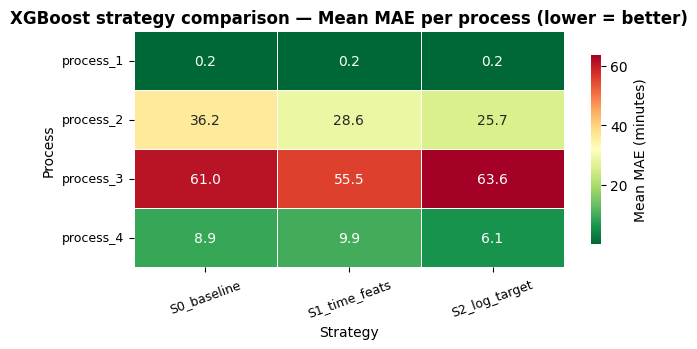


Delta vs S0_baseline (negative = worse, positive = better) in MAE minutes:


strategy,S1_time_feats,S2_log_target
process,,
process_1,+0.00,-0.00
process_2,-7.58,-10.46
process_3,-5.50,+2.59
process_4,+1.04,-2.84


In [27]:
# Strategy comparison heatmap: process × strategy, value = mean MAE (minutes)
pivot_s = strat_df.pivot(index='process', columns='strategy', values='mean_mae').sort_index()

fig, ax = plt.subplots(figsize=(max(6, len(pivot_s.columns) * 2.2), max(3, len(pivot_s) * 0.9)))
sns.heatmap(pivot_s, ax=ax, annot=True, fmt='.1f', cmap='RdYlGn_r',
            linewidths=0.4, linecolor='white',
            annot_kws={'size': 10}, cbar_kws={'label': 'Mean MAE (minutes)', 'shrink': 0.8})
ax.set_title('XGBoost strategy comparison — Mean MAE per process (lower = better)',
             fontsize=12, fontweight='bold')
ax.set_xlabel('Strategy'); ax.set_ylabel('Process')
ax.tick_params(axis='x', rotation=20, labelsize=9)
ax.tick_params(axis='y', rotation=0,  labelsize=9)
plt.tight_layout()
plt.show()

# Delta vs S0: positive = improvement
print('\nDelta vs S0_baseline (negative = worse, positive = better) in MAE minutes:')
s0 = pivot_s.get('S0_baseline')
if s0 is not None:
    delta = pivot_s.subtract(s0, axis=0).drop(columns='S0_baseline', errors='ignore')
    display(delta.round(2).style
            .format('{:+.2f}')
            .background_gradient(cmap='RdYlGn', axis=None))